# Part 2 - Data Analysis and Interpretation

## Job Metadata

In [3]:
# Imports
import string
import numpy as np
import pandas as pd
from IPython.core.display import display, HTML

# Increase the width of the notebook for displaying DataFrames
display(HTML("<style>.container { width:95% !important; }</style>"))

#Data Prepocessing
import nltk
import random
import copy


/var/folders/mx/b2s2fns51plfn__sspbylxk00000gn/T/ipykernel_1086/97215127.py:5: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [4]:
#DataPrep

df = pd.read_csv('data.csv', low_memory=False)

df = df.assign(AverageSalary = lambda row: (row.LowestSalary + row.HighestSalary)/2)
#df.head(10)
AverageSalary = df.groupby('AverageSalary')
averageSalaryStats = AverageSalary.count()
averageSalaryStats['Count'] = averageSalaryStats['Id']
averageSalaryStats['Count']

df["Id"] = df["Id"].replace(to_replace=r'&.*', value='', regex=True)
df["Date"] = df["Date"].replace(to_replace=r'T.*', value='', regex=True)

# Set column "Id" to type int64
df["Id"] = df["Id"].astype(np.int64)

# Set column "Date" to type datetime64[ns]
df["Date"] = pd.to_datetime(df.Date)
# Data types after data cleaning and conversions
df.dtypes

#Save the cleaned and preprocessed dataset
df.to_csv("preprocessed_data.csv")

df = pd.read_csv('preprocessed_data.csv')
#df = pd.read_csv('data.csv', low_memory=False)

/var/folders/mx/b2s2fns51plfn__sspbylxk00000gn/T/ipykernel_1086/2508707546.py:26: DtypeWarning: Columns (5,6,7,8) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('preprocessed_data.csv')


In [5]:
df.shape

(318477, 15)

In [6]:
# df = pd.read_csv('data.csv', low_memory=False)
# df.head(10) 

In [7]:
df = df.assign(AverageSalary = lambda row: (row.LowestSalary + row.HighestSalary)/2)
# df.head(10)
Classification = df.groupby('Classification')
ClassificationStats = Classification.count()
ClassificationStats['Count'] = ClassificationStats['Id']
ClassificationStats['Count']

Classification
Accounting                                 9368
Administration & Office Support           10020
Advertising, Arts & Media                   833
Banking & Financial Services               4633
CEO & General Management                    844
Call Centre & Customer Service             3971
Community Services & Development           4485
Construction                               8372
Consulting & Strategy                      1206
Design & Architecture                      1811
Education & Training                       9280
Engineering                                6458
Farming, Animals & Conservation             882
Government & Defence                       7443
Healthcare & Medical                      17085
Hospitality & Tourism                     15523
Human Resources & Recruitment              4144
Information & Communication Technology    22796
Insurance & Superannuation                 1474
Legal                                      4237
Manufacturing, Transport 

In [8]:
ClassificationStats.shape
# 30 Job Classifications

(30, 15)

In [9]:
# ##Hint replace(to_replace=r'&.*', value='', regex=True)

# df["Id"] = df["Id"].replace(to_replace=r'&.*', value='', regex=True)
# #Your code to clean date
# df["Date"] = df["Date"].replace(to_replace=r'T.*', value='', regex=True)
# #df.dtypes
# # Set column "Id" to type int64
# df["Id"] = df["Id"].astype(np.int64)

# # Set column "Date" to type datetime64[ns]
# df["Date"] = pd.to_datetime(df.Date)
# # Data types after data cleaning and conversions
df.dtypes

Unnamed: 0             int64
Id                     int64
Title                 object
Company               object
Date                  object
Location              object
Area                  object
Classification        object
SubClassification     object
Requirement           object
FullDescription       object
LowestSalary           int64
HighestSalary          int64
JobType               object
AverageSalary        float64
dtype: object

In [10]:
# #Save the cleaned and preprocessed dataset
# df.to_csv("preprocessed_data.csv")

### Job metadata

In [11]:
colors = ['#1F77B4', '#AEC7E8', '#FF7F0E', '#FFBB78', '#2CA02C', '#98DF8A', '#B5CF6B', '#FF9896','#9467BD', '#C5B0D5', '#BCBD22']

In [12]:
#Redo After cleanup

# df = df.assign(AverageSalary = lambda row: (row.LowestSalary + row.HighestSalary)/2)
# # df.head(10)
# Classification = df.groupby('Classification')

Classification = df[df['Classification'].isna()==False]

df = df.assign(AverageSalary = lambda row: (row.LowestSalary + row.HighestSalary)/2)
# df.head(10)
Classification = Classification.groupby('Classification')
ClassificationStats = Classification.count()
ClassificationStats['Count'] = ClassificationStats['Id']
ClassificationStats['Classification'] = ClassificationStats.index
ClassificationStats['Count']

Classification
Accounting                                 9368
Administration & Office Support           10020
Advertising, Arts & Media                   833
Banking & Financial Services               4633
CEO & General Management                    844
Call Centre & Customer Service             3971
Community Services & Development           4485
Construction                               8372
Consulting & Strategy                      1206
Design & Architecture                      1811
Education & Training                       9280
Engineering                                6458
Farming, Animals & Conservation             882
Government & Defence                       7443
Healthcare & Medical                      17085
Hospitality & Tourism                     15523
Human Resources & Recruitment              4144
Information & Communication Technology    22796
Insurance & Superannuation                 1474
Legal                                      4237
Manufacturing, Transport 

In [13]:
ClassificationStats.shape

(30, 16)

In [14]:
ClassificationStats

,Unnamed: 0,Id,Title,Company,Date,Location,Area,SubClassification,Requirement,FullDescription,LowestSalary,HighestSalary,JobType,AverageSalary,Count,Classification
Classification,,,,,,,,,,,,,,,,
Accounting,9368,9368,9368,9056,9368,9368,7308,9368,9368,8760,9368,9368,8760,9368,9368,Accounting
Administration & Office Support,10020,10020,10020,9534,10020,10020,6843,10020,10020,9215,10020,10020,9215,10020,10020,Administration & Office Support
"Advertising, Arts & Media",833,833,833,808,833,833,555,833,833,802,833,833,803,833,833,"Advertising, Arts & Media"
Banking & Financial Services,4633,4633,4633,4574,4633,4633,3456,4633,4633,4310,4633,4633,4311,4633,4633,Banking & Financial Services
CEO & General Management,844,844,844,811,844,844,430,844,844,783,844,844,783,844,844,CEO & General Management
Call Centre & Customer Service,3971,3971,3971,3858,3971,3971,3065,3971,3971,3659,3971,3971,3659,3971,3971,Call Centre & Customer Service
Community Services & Development,4485,4485,4485,4350,4485,4485,2144,4485,4483,4262,4485,4485,4267,4485,4485,Community Services & Development
Construction,8372,8372,8372,8042,8372,8372,5057,8372,8372,8022,8372,8372,8023,8372,8372,Construction
Consulting & Strategy,1206,1206,1206,1186,1206,1206,816,1206,1206,1140,1206,1206,1140,1206,1206,Consulting & Strategy


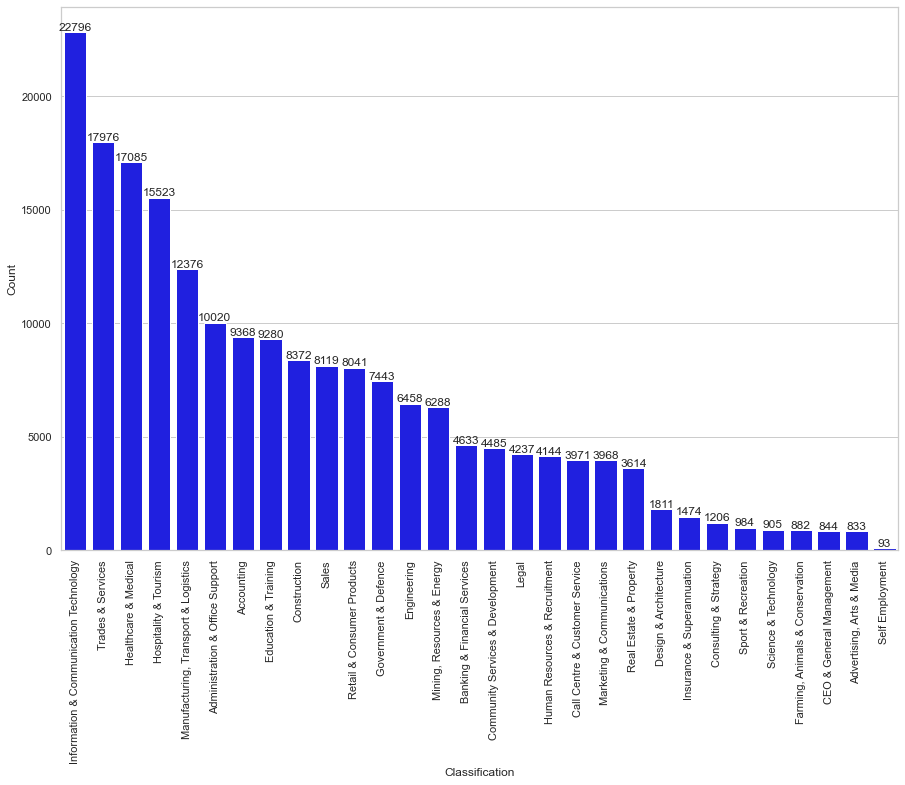

In [15]:
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(15,10))

ClassificationStats_sorted = ClassificationStats.sort_values("Count",ascending=False)
sns.set()
sns.set_style("whitegrid")


ax = sns.barplot(data=ClassificationStats_sorted,x="Classification",y="Count",color="blue")
ax.bar_label(ax.containers[0])
plt.xticks(rotation=90)
plt.show()

#### Bar chart to display the correlations between “Sector” and the total jobs of in each sector

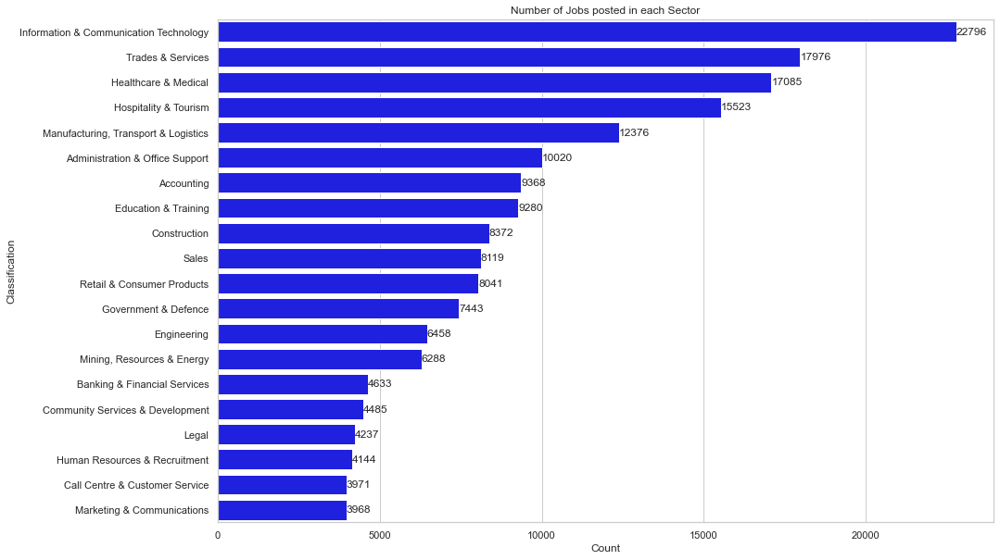

In [16]:
plt.figure(figsize=(15,10))

ax = sns.barplot(
    data=ClassificationStats_sorted,
    x="Count",
    y="Classification",
    color="blue",
    order=ClassificationStats_sorted["Classification"][:20]
)
ax.bar_label(ax.containers[0])

plt.title("Number of Jobs posted in each Sector")
plt.show()

In [17]:
ClassificationStats_10 = ClassificationStats_sorted[:10].copy()
ClassificationStats_10
ClassificationStats_10["Classification"].values

array(['Information & Communication Technology', 'Trades & Services',
       'Healthcare & Medical', 'Hospitality & Tourism',
       'Manufacturing, Transport & Logistics',
       'Administration & Office Support', 'Accounting',
       'Education & Training', 'Construction', 'Sales'], dtype=object)

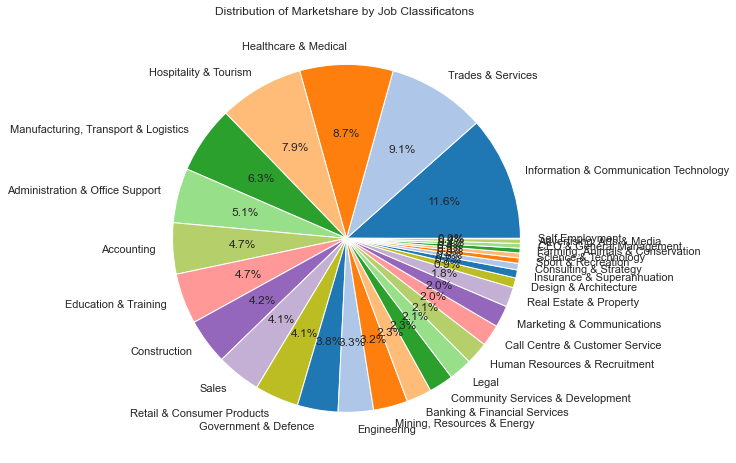

In [18]:
# Distribution of Sub-sectors in each sector

plt.figure(figsize=(8,8))
plt.title("Distribution of Marketshare by Job Classificatons ")
plt.pie(
    ClassificationStats_sorted["Count"],
    labels=ClassificationStats_sorted["Classification"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

In [19]:
# ict = ClassificationStats_10["Classification"]["Information & Communication Technology"] 
# trades_S = ClassificationStats_10["Classification"]["Trades & Services"]
# h_m = ClassificationStats_10["Classification"]["Healthcare & Medical"]
# h_t = ClassificationStats_10["Classification"]["Hospitality & Tourism"]
# man_trans_tour = ClassificationStats_10["Classification"]["Manufacturing, Transport & Logistics"]
# b_admin = ClassificationStats_10["Classification"]["Administration & Office Support"]
# accounting = ClassificationStats_10["Classification"]["Accounting"]
# education = ClassificationStats_10["Classification"]["Education & Training"]
# construction = ClassificationStats_10["Classification"]["Construction"]
# sales = ClassificationStats_10["Classification"]["Sales"]

ict = df[df["Classification"] == "Information & Communication Technology"]  
trades_S = df[df["Classification"] == "Trades & Services"] 
h_m = df[df["Classification"] == "Healthcare & Medical"] 
h_t = df[df["Classification"] == "Hospitality & Tourism"] 
man_trans_tour = df[df["Classification"] == "Manufacturing, Transport & Logistics"] 
b_admin = df[df["Classification"] == "Administration & Office Support"] 
accounting = df[df["Classification"] == "Accounting"] 
education = df[df["Classification"] == "Education & Training"] 
construction = df[df["Classification"] == "Construction"] 
sales = df[df["Classification"] == "Sales"] 

In [18]:
ict

,Unnamed: 0,Id,Title,Company,Date,Location,Area,Classification,SubClassification,Requirement,FullDescription,LowestSalary,HighestSalary,JobType,AverageSalary
89,89,37404291,Technical Support Engineer,FTI Consulting,2018-10-07,Sydney,"CBD, Inner West & Eastern Suburbs",Information & Communication Technology,Help Desk & IT Support,Act as an advisor to staff in all practice are...,NaN,0,30,NaN,15.0
96,96,37404325,Business Development Manager,TPG Telecom Limited,2018-10-07,Perth,"CBD, Inner & Western Suburbs",Information & Communication Technology,Sales - Pre & Post,Looking to get your foot in the door in a care...,NaN,0,30,NaN,15.0
127,127,37404230,Systems Engineer,Humanised Group,2018-10-07,Brisbane,CBD & Inner Suburbs,Information & Communication Technology,Networks & Systems Administration,Systems Engineer to work on BAU/Projects for a...,<strong>The Company</strong><br> <br> This org...,0,30,Full Time,15.0
130,130,37404370,Operations Delivery Manager,Woolworths Group,2018-10-07,Sydney,"CBD, Inner West & Eastern Suburbs",Information & Communication Technology,Programme & Project Management,Ready for a challenge? Opportunity to be a par...,<p> </p>\n <div></div>\n <div></...,0,30,Full Time,15.0
133,133,37404174,Technical Support Executive - $70K + Super - C...,Command Group,2018-10-07,Sydney,"CBD, Inner West & Eastern Suburbs",Information & Communication Technology,Help Desk & IT Support,Do you have strong technical support skills? L...,<div>\n <ul>\n <li>Great s...,0,30,Full Time,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
197204,197204,37828604,AWS IoT Data Engineer - Energy Sharing,TRS - IT & Communications,2018-11-29,Sydney,"CBD, Inner West & Eastern Suburbs",Information & Communication Technology,Consultants,Senior Data Engineer required to build a >1m d...,Senior Data Engineer required to work on a hug...,200,999,Contract/Temp,599.5
197208,197208,37828500,Multiple TSPV Opportunities – CANBERRA LOCATION,Oakton Contracting & Recruitment Pty Ltd,2018-11-29,ACT,NaN,Information & Communication Technology,Consultants,Multiple job opportunities in Canberra locatio...,<ul>\n <li>Maintain your TSPV Clearan...,200,999,Contract/Temp,599.5
197217,197217,37828375,IT Project/ Program Manager - Banking,Illuminate Search & Consulting,2018-11-29,Sydney,"CBD, Inner West & Eastern Suburbs",Information & Communication Technology,Programme & Project Management,Ability to deliver a wide federated model,<ul>\n <li><strong>Work on a large ba...,200,999,Contract/Temp,599.5
197218,197218,37828374,IT Test Analyst OR Senior IT Test Analyst,Paxus,2018-11-29,Sydney,"CBD, Inner West & Eastern Suburbs",Information & Communication Technology,Testing & Quality Assurance,Great opportunity for a IT Test Analyst/Senio...,<p>Leading financial sector is seeking an IT T...,200,999,Contract/Temp,599.5


In [19]:
## Find the 5 top-most sub-sectors for each sector

# Information & Communication Technology

ict = ict[~ict['SubClassification'].isnull()]
ict_sectors = ict.groupby('SubClassification').count()
ict_sectors['SubClassification'] = ict_sectors.index
ict_sectors['Count'] = ict_sectors["Id"]
ict_sectors['Not Specified'] = ict[~ict['SubClassification'].isnull()].count()
ict_sectors.sort_values("Count",ascending=False,inplace=True)


 
# #Trades & Services  
trades_S = trades_S[~trades_S['SubClassification'].isnull()]
ts_sectors = trades_S.groupby('SubClassification').count()
ts_sectors['SubClassification'] = ts_sectors.index
ts_sectors['Count'] = ts_sectors["Id"]
ts_sectors['Not Specified'] = trades_S[~trades_S['SubClassification'].isnull()].count()
ts_sectors.sort_values("Count",ascending=False,inplace=True)

# #Healthcare & Medical

h_m = h_m[~h_m['SubClassification'].isnull()]
hm_sectors = h_m.groupby('SubClassification').count()
hm_sectors['SubClassification'] = hm_sectors.index
hm_sectors['Count'] = hm_sectors["Id"]
hm_sectors['Not Specified'] = h_m[~h_m['SubClassification'].isnull()].count()
hm_sectors.sort_values("Count",ascending=False,inplace=True)

# #Hospitality & Tourism  

h_t = h_t[~h_t['SubClassification'].isnull()]
ht_sectors = h_t.groupby('SubClassification').count()
ht_sectors['SubClassification'] = ht_sectors.index
ht_sectors['Count'] = ht_sectors["Id"]
ht_sectors['Not Specified'] = h_t[~h_t['SubClassification'].isnull()].count()
ht_sectors.sort_values("Count",ascending=False,inplace=True)

# #Manufacturing, Transport & Logistics  

man_trans_tour = man_trans_tour[~man_trans_tour['SubClassification'].isnull()]
mtt_sectors = man_trans_tour.groupby('SubClassification').count()
mtt_sectors['SubClassification'] = mtt_sectors.index
mtt_sectors['Count'] = mtt_sectors["Id"]
mtt_sectors['Not Specified'] = man_trans_tour[~man_trans_tour['SubClassification'].isnull()].count()
mtt_sectors.sort_values("Count",ascending=False,inplace=True)

# #Administration & Office Support  

b_admin = b_admin[~b_admin['SubClassification'].isnull()]
bAdmin_sectors = b_admin.groupby('SubClassification').count()
bAdmin_sectors['SubClassification'] = bAdmin_sectors.index
bAdmin_sectors['Count'] = bAdmin_sectors["Id"]
bAdmin_sectors['Not Specified'] = b_admin[~b_admin['SubClassification'].isnull()].count()
bAdmin_sectors.sort_values("Count",ascending=False,inplace=True)

# #Accounting           

accounting = accounting[~accounting['SubClassification'].isnull()]
acc_sectors = accounting.groupby('SubClassification').count()
acc_sectors['SubClassification'] = acc_sectors.index
acc_sectors['Count'] = acc_sectors["Id"]
acc_sectors['Not Specified'] = accounting[~accounting['SubClassification'].isnull()].count()
acc_sectors.sort_values("Count",ascending=False,inplace=True)

# #Education & Training  

education = education[~education['SubClassification'].isnull()]
edu_sectors = education.groupby('SubClassification').count()
edu_sectors['SubClassification'] = edu_sectors.index
edu_sectors['Count'] = edu_sectors["Id"]
edu_sectors['Not Specified'] = education[~education['SubClassification'].isnull()].count()
edu_sectors.sort_values("Count",ascending=False,inplace=True)

# #Construction          

construction = construction[~construction['SubClassification'].isnull()]
con_sectors = construction.groupby('SubClassification').count()
con_sectors['SubClassification'] = con_sectors.index
con_sectors['Count'] = con_sectors["Id"]
con_sectors['Not Specified'] = construction[~construction['SubClassification'].isnull()].count()
con_sectors.sort_values("Count",ascending=False,inplace=True)

# #Sales                                                       

sales = sales[~sales['SubClassification'].isnull()]
sales_sectors = sales.groupby('SubClassification').count()
sales_sectors['SubClassification'] = sales_sectors.index
sales_sectors['Count'] = sales_sectors["Id"]
sales_sectors['Not Specified'] = sales[~sales['SubClassification'].isnull()].count()
sales_sectors.sort_values("Count",ascending=False,inplace=True)



In [20]:

ict_sectors.index[:11].values

array(['Developers/Programmers', 'Business/Systems Analysts',
       'Programme & Project Management', 'Architects',
       'Engineering - Software', 'Help Desk & IT Support',
       'Networks & Systems Administration', 'Consultants', 'Other',
       'Testing & Quality Assurance', 'Security'], dtype=object)

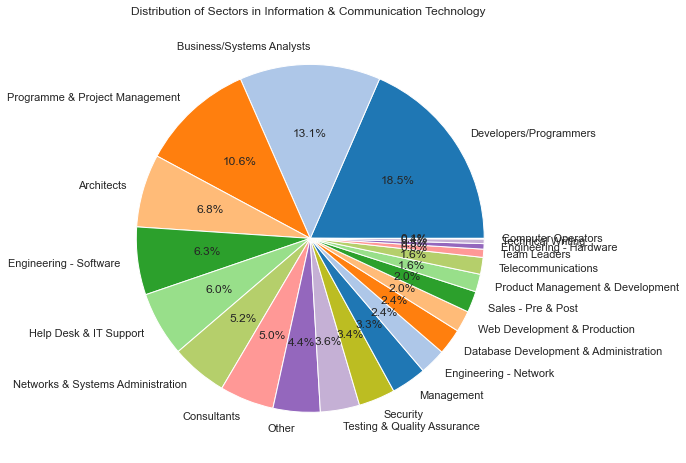

In [21]:
# Distribution of Sub-sectors in each sector

plt.figure(figsize=(8,8))
plt.title("Distribution of Sectors in Information & Communication Technology ")
plt.pie(
    ict_sectors["Count"],
    labels=ict_sectors["SubClassification"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()



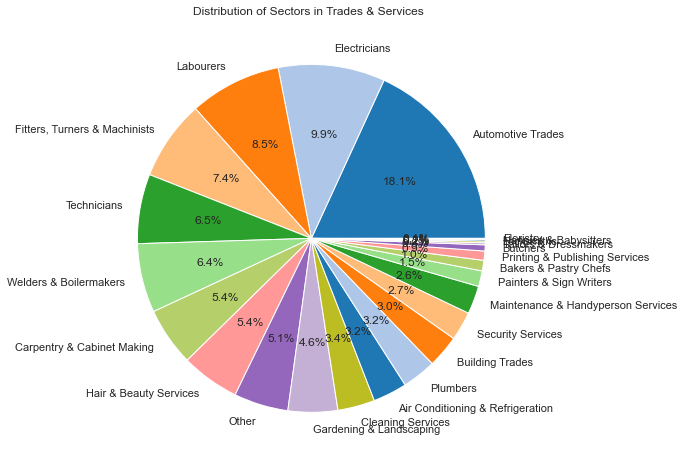

In [22]:
plt.figure(figsize=(8,8))
plt.title("Distribution of Sectors in Trades & Services  ")
plt.pie(
    ts_sectors["Count"],
    labels=ts_sectors["SubClassification"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()



# trades_S = trades_S[~trades_S['SubClassification'].isnull()]
# ts_sectors = trades_S.groupby('SubClassification').count()
# ts_sectors['SubClassification'] = ts_sectors.index
# ts_sectors['Count'] = ts_sectors["Id"]
# #count_null = trades_S[trades_S['Count'].isnull()].count()
# ts_sectors['Not Specified'] = trades_S[~trades_S['SubClassification'].isnull()].count()
# ts_sectors.sort_values("Count",ascending=False,inplace=True)

# #count_null
# ts_sectors

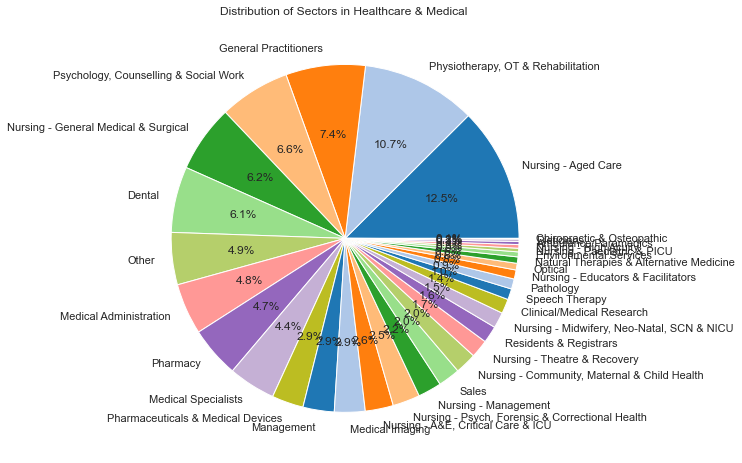

In [23]:
plt.figure(figsize=(8,8))
plt.title("Distribution of Sectors in Healthcare & Medical ")
plt.pie(
    hm_sectors["Count"],
    labels=hm_sectors["SubClassification"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

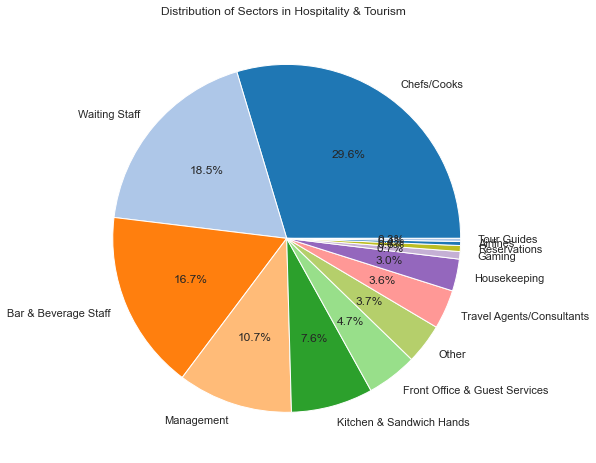

In [24]:
plt.figure(figsize=(8,8))
plt.title("Distribution of Sectors in Hospitality & Tourism  ")
plt.pie(
    ht_sectors["Count"],
    labels=ht_sectors["SubClassification"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

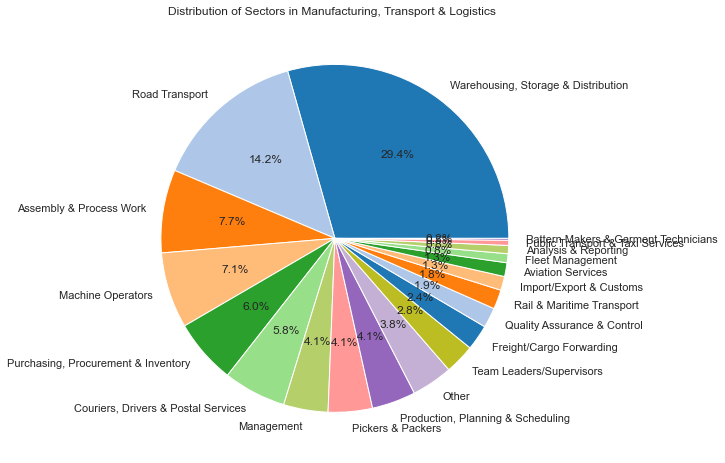

In [25]:
plt.figure(figsize=(8,8))
plt.title("Distribution of Sectors in Manufacturing, Transport & Logistics  ")
plt.pie(
    mtt_sectors["Count"],
    labels=mtt_sectors["SubClassification"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

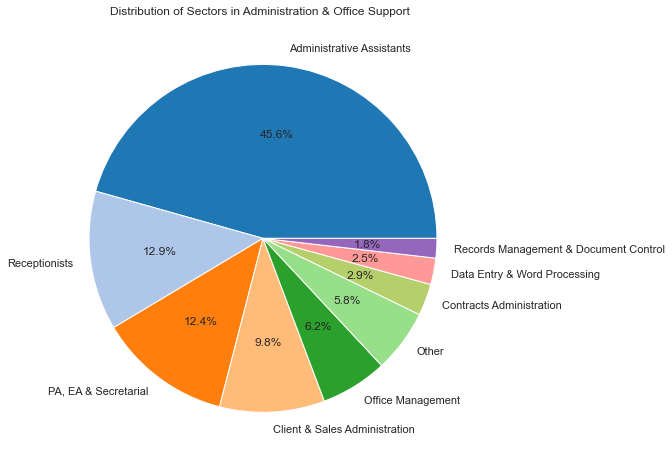

In [26]:
plt.figure(figsize=(8,8))
plt.title("Distribution of Sectors in Administration & Office Support  ")
plt.pie(
    bAdmin_sectors["Count"],
    labels=bAdmin_sectors["SubClassification"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

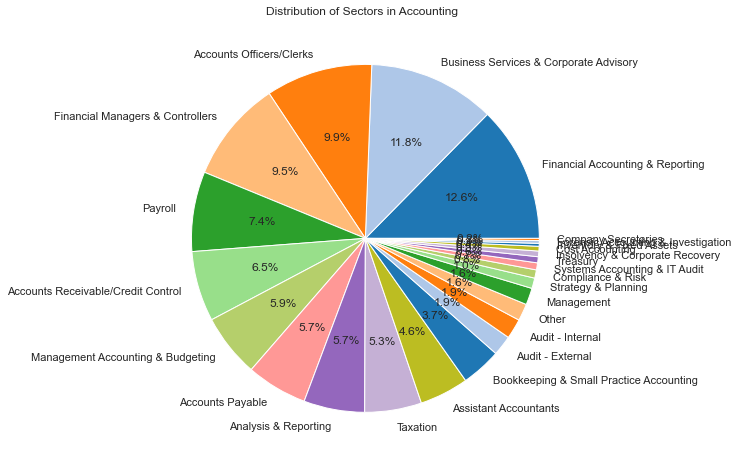

In [27]:
plt.figure(figsize=(8,8))
plt.title("Distribution of Sectors in Accounting  ")
plt.pie(
    acc_sectors["Count"],
    labels=acc_sectors["SubClassification"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

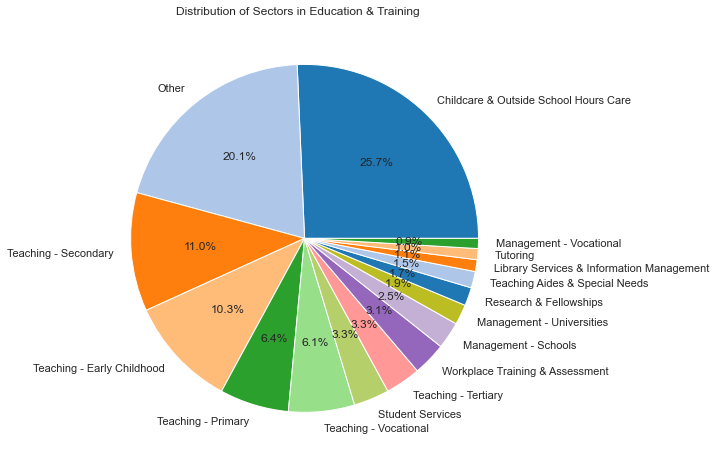

In [28]:
plt.figure(figsize=(8,8))
plt.title("Distribution of Sectors in Education & Training    ")
plt.pie(
    edu_sectors["Count"],
    labels=edu_sectors["SubClassification"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

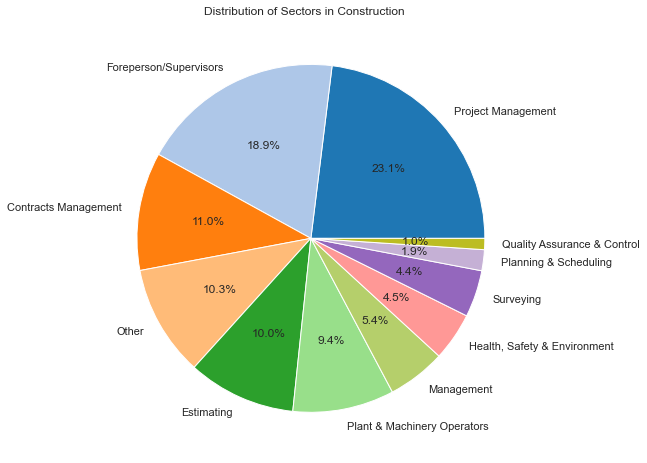

In [29]:
plt.figure(figsize=(8,8))
plt.title("Distribution of Sectors in Construction    ")
plt.pie(
    con_sectors["Count"],
    labels=con_sectors["SubClassification"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

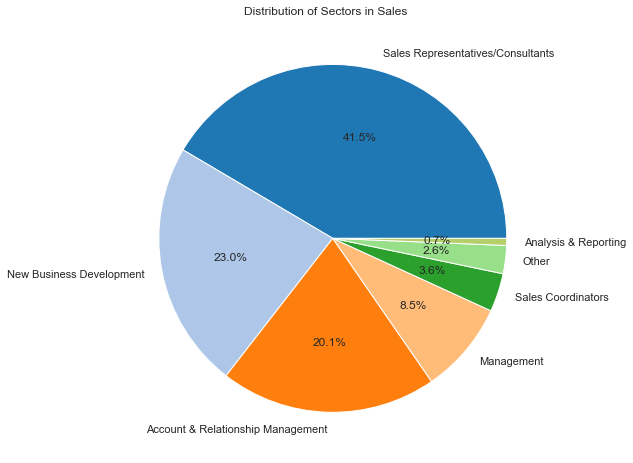

In [30]:
plt.figure(figsize=(8,8))
plt.title("Distribution of Sectors in Sales    ")
plt.pie(
    sales_sectors["Count"],
    labels=sales_sectors["SubClassification"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

In [31]:
ts_sectors.index
ts_top_5 = ['Automotive Trades', 'Electricians', 'Labourers','Fitters, Turners & Machinists','Technicians']
tsTop = df[df['SubClassification'].isin(ts_top_5)]

In [32]:
ict_top_5 = ['Developers/Programmers', 'Business/Systems Analysts','Programme & Project Management', 'Architects','Engineering - Software']
ictTop = df[df['SubClassification'].isin(ict_top_5)]


In [33]:
hm_sectors.index
hm_top_5 = ['Nursing - Aged Care', 'Physiotherapy, OT & Rehabilitation','General Practitioners', 'Psychology, Counselling & Social Work','Nursing - General Medical & Surgical']
hmTop = df[df['SubClassification'].isin(hm_top_5)]

In [34]:
ht_sectors.index
ht_top_5 = ['Chefs/Cooks', 'Waiting Staff', 'Bar & Beverage Staff', 'Management','Kitchen & Sandwich Hands']
htTop = df[df['SubClassification'].isin(ht_top_5)]

In [35]:
mtt_sectors.index
mtt_top_5 = ['Warehousing, Storage & Distribution', 'Road Transport','Assembly & Process Work', 'Machine Operators','Purchasing, Procurement & Inventory']
mttTop = df[df['SubClassification'].isin(mtt_top_5)]

In [36]:
bAdmin_sectors.index
ba_top_5 = ['Administrative Assistants', 'Receptionists', 'PA, EA & Secretarial','Client & Sales Administration', 'Office Management']
baTop = df[df['SubClassification'].isin(ba_top_5)]

In [37]:
acc_sectors.index
acc_top_5 = ['Financial Accounting & Reporting','Business Services & Corporate Advisory', 'Accounts Officers/Clerks','Financial Managers & Controllers', 'Payroll']
accTop = df[df['SubClassification'].isin(acc_top_5)]

In [38]:
edu_sectors.index
edu_top_5 = ['Childcare & Outside School Hours Care', 'Other','Teaching - Secondary', 'Teaching - Early Childhood','Teaching - Primary']
eduTop = df[df['SubClassification'].isin(edu_top_5)]

In [39]:
con_sectors.index
con_top_5 = ['Project Management', 'Foreperson/Supervisors', 'Contracts Management','Other', 'Estimating']
conTop = df[df['SubClassification'].isin(con_top_5)]

In [40]:
sales_sectors.index
sale_top_5 = ['Sales Representatives/Consultants', 'New Business Development','Account & Relationship Management', 'Management', 'Sales Coordinators']
saleTop = df[df['SubClassification'].isin(sale_top_5)]

In [41]:
def moving_average(df, k, to_period,col1,col2):
    moving_average_df = pd.DataFrame(columns=[col1,col2]) # ['Period','Sales']
    for m in range(0,to_period):  ###--- 
        if m < k:
            prediction = float("nan")
        else:
            history = df[col2][m-k:m] # 'Sales'
            prediction = history.mean()
        moving_average_df.loc[m]= [m+1,prediction] ###---
    return moving_average_df

# postByDay = (pd.to_datetime(df['Date'])
#        .dt.floor('d')
#        .value_counts()
#        .rename_axis('date')
#        .reset_index(name='count'))

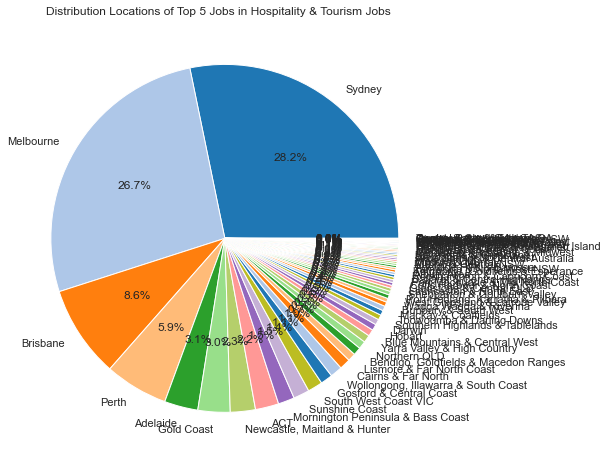

In [42]:
## Locations of top 5 Hospitality & Tourism Jobs

top_ht_locations = htTop.groupby('Location').count()
top_ht_locations['Location'] = top_ht_locations.index
top_ht_locations['Count'] = top_ht_locations["Id"]
top_ht_locations['Not Specified'] = htTop[~htTop['Location'].isnull()].count()
top_ht_locations.sort_values("Count",ascending=False,inplace=True)
top_ht_locations

plt.figure(figsize=(8,8))
plt.title("Distribution Locations of Top 5 Jobs in Hospitality & Tourism Jobs    ")
plt.pie(
    top_ht_locations["Count"],
    labels=top_ht_locations["Location"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()


In [2]:
## Distribution of Hospitality & Tourism Jobs

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(ht_top_5)]
ict_loc_dist.head()

sns.catplot(x="Location",
            y="AverageSalary",
            hue="SubClassification",
            data=ict_loc_dist,kind="strip",
            jitter=False,
            dodge=True,
            height=8.27,
            aspect=11.7/8.27
).set(title='Average salaries by location --  Hospitality & Tourism Jobs')

NameError: name 'df' is not defined

/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  w

<AxesSubplot:xlabel='date', ylabel='count'>

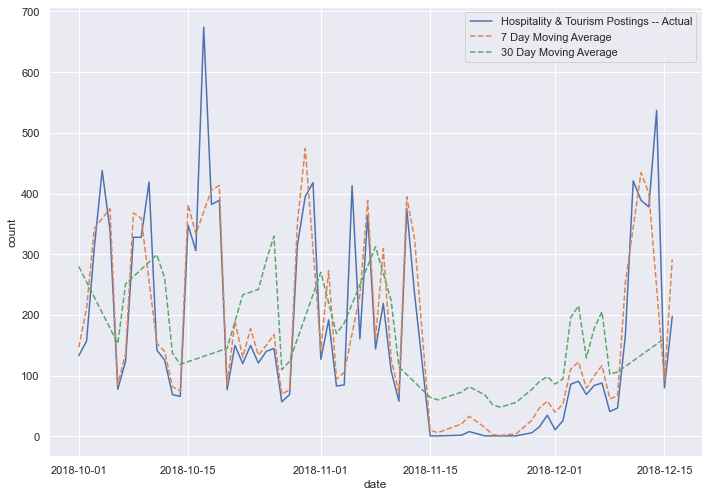

In [44]:
## Distribution of Hospitality & Tourism Jobs

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(ht_top_5)]
ict_loc_dist.head()

ict_loc_dist = (pd.to_datetime(ict_loc_dist['Date'])
       .dt.floor('d')
       .value_counts()
       .rename_axis('date')
       .reset_index(name='count'))

period = (len(ict_loc_dist['date']))

sns.set(rc={'figure.figsize':(11.7,8.27)})
f, ax = plt.subplots(1, 1)
ma_df_7 = moving_average(ict_loc_dist, 7, period,'date','count')
ma_df_30 = moving_average(ict_loc_dist, 30, period,'date','count')

sns.lineplot(ict_loc_dist['date'],ict_loc_dist['count'], label='Hospitality & Tourism Postings -- Actual')
sns.lineplot(ict_loc_dist['date'],ma_df_7['count'],linestyle='--', label='7 Day Moving Average')
sns.lineplot(ict_loc_dist['date'],ma_df_30['count'],linestyle='--', label='30 Day Moving Average')

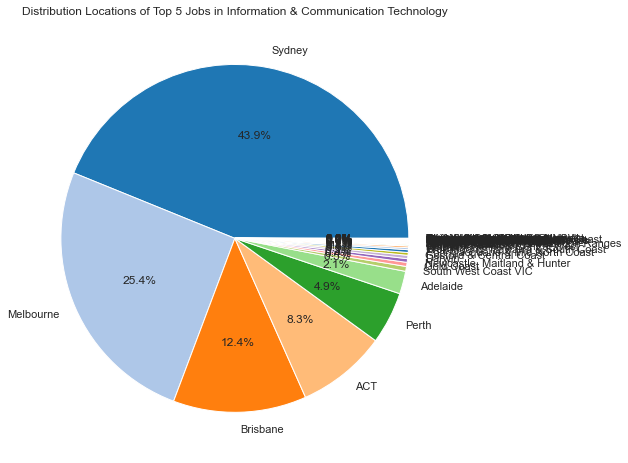

In [45]:
## Locations of top 5 Information & Communication Technology Jobs

top_ict_locations = ictTop.groupby('Location').count()
top_ict_locations['Location'] = top_ict_locations.index
top_ict_locations['Count'] = top_ict_locations["Id"]
top_ict_locations['Not Specified'] = ictTop[~ictTop['Location'].isnull()].count()
top_ict_locations.sort_values("Count",ascending=False,inplace=True)
top_ict_locations

plt.figure(figsize=(8,8))
plt.title("Distribution Locations of Top 5 Jobs in Information & Communication Technology")
plt.pie(
    top_ict_locations["Count"],
    labels=top_ict_locations["Location"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

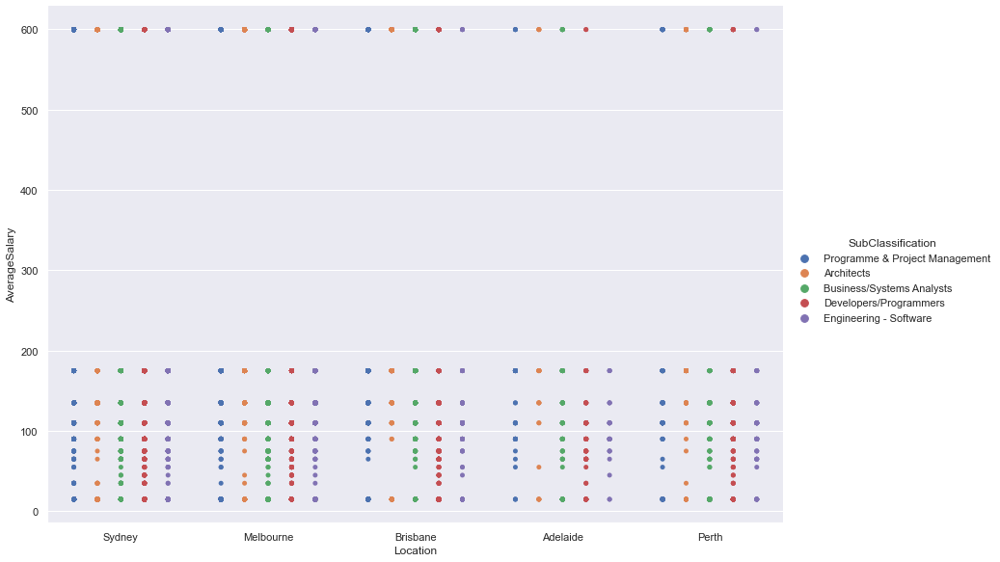

In [46]:
## Distribution of ICT Jobs

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(ict_top_5)]
ict_loc_dist.head()

sns.catplot(x="Location",
            y="AverageSalary",
            hue="SubClassification",
            data=ict_loc_dist,kind="strip",
            jitter=False,
            dodge=True,
            height=8.27,
            aspect=11.7/8.27
)

/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  w

<AxesSubplot:xlabel='date', ylabel='count'>

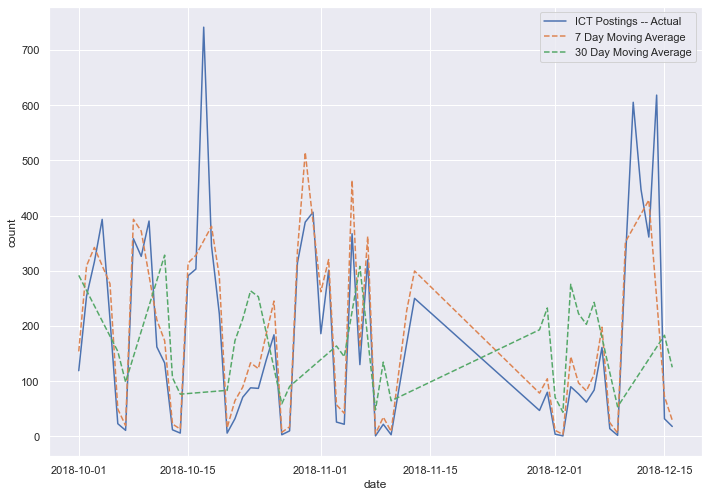

In [47]:
## Distribution of ICT Jobs

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(ict_top_5)]
ict_loc_dist.head()

ict_loc_dist = (pd.to_datetime(ict_loc_dist['Date'])
       .dt.floor('d')
       .value_counts()
       .rename_axis('date')
       .reset_index(name='count'))

period = (len(ict_loc_dist['date']))

sns.set(rc={'figure.figsize':(11.7,8.27)})
f, ax = plt.subplots(1, 1)
ma_df_7 = moving_average(ict_loc_dist, 7, period,'date','count')
ma_df_30 = moving_average(ict_loc_dist, 30, period,'date','count')

sns.lineplot(ict_loc_dist['date'],ict_loc_dist['count'], label='ICT Postings -- Actual')
sns.lineplot(ict_loc_dist['date'],ma_df_7['count'],linestyle='--', label='7 Day Moving Average')
sns.lineplot(ict_loc_dist['date'],ma_df_30['count'],linestyle='--', label='30 Day Moving Average')

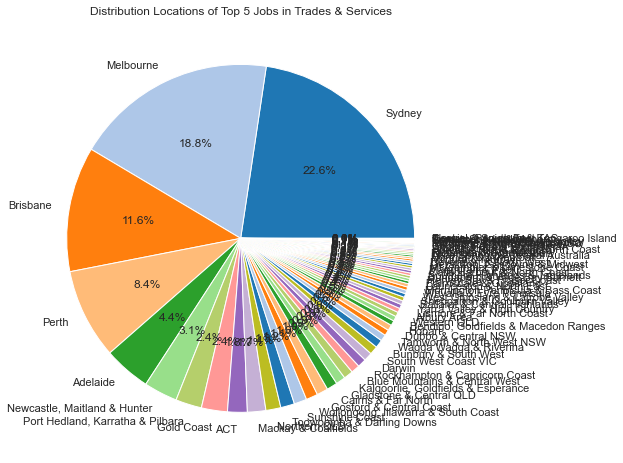

In [48]:
## Locations of top 5 Trades & Services Jobs

top_ts_locations = tsTop.groupby('Location').count()
top_ts_locations['Location'] = top_ts_locations.index
top_ts_locations['Count'] = top_ts_locations["Id"]
top_ts_locations['Not Specified'] = tsTop[~tsTop['Location'].isnull()].count()
top_ts_locations.sort_values("Count",ascending=False,inplace=True)
top_ts_locations

plt.figure(figsize=(8,8))
plt.title("Distribution Locations of Top 5 Jobs in Trades & Services")
plt.pie(
    top_ts_locations["Count"],
    labels=top_ts_locations["Location"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

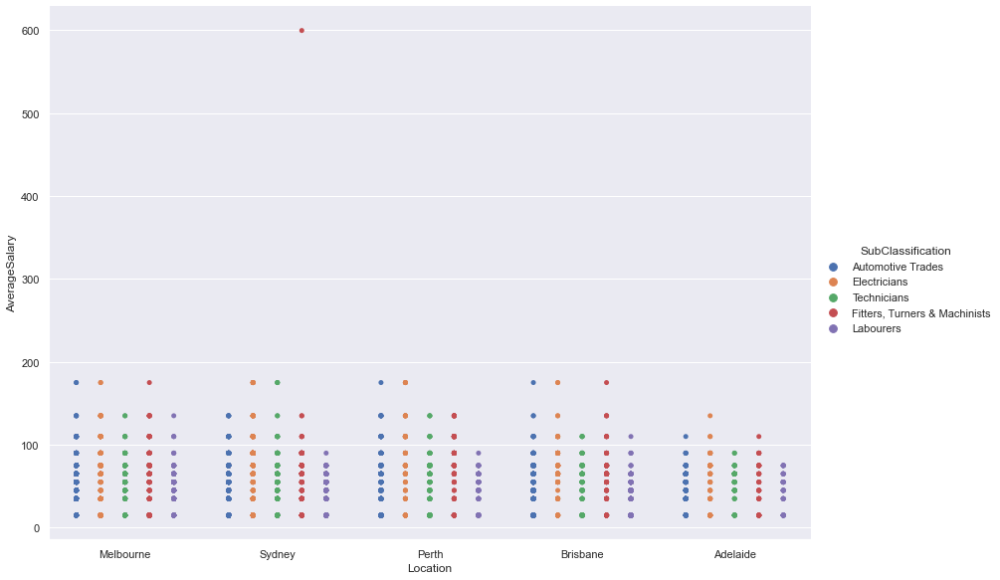

In [49]:
## Distribution of Trade and services Jobs

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(ts_top_5)]
ict_loc_dist.head()

sns.catplot(x="Location",
            y="AverageSalary",
            hue="SubClassification",
            data=ict_loc_dist,kind="strip",
            jitter=False,
            dodge=True,
            height=8.27,
            aspect=11.7/8.27
)

/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  w

<AxesSubplot:xlabel='date', ylabel='count'>

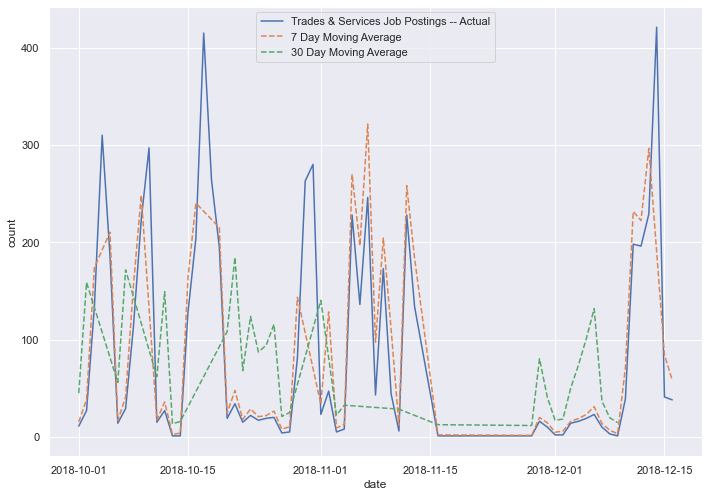

In [50]:
## Distribution of Trades & Services Jobs

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(ts_top_5)]
ict_loc_dist.head()

ict_loc_dist = (pd.to_datetime(ict_loc_dist['Date'])
       .dt.floor('d')
       .value_counts()
       .rename_axis('date')
       .reset_index(name='count'))

period = (len(ict_loc_dist['date']))

sns.set(rc={'figure.figsize':(11.7,8.27)})
f, ax = plt.subplots(1, 1)
ma_df_7 = moving_average(ict_loc_dist, 7, period,'date','count')
ma_df_30 = moving_average(ict_loc_dist, 30, period,'date','count')

sns.lineplot(ict_loc_dist['date'],ict_loc_dist['count'], label='Trades & Services Job Postings -- Actual')
sns.lineplot(ict_loc_dist['date'],ma_df_7['count'],linestyle='--', label='7 Day Moving Average')
sns.lineplot(ict_loc_dist['date'],ma_df_30['count'],linestyle='--', label='30 Day Moving Average')

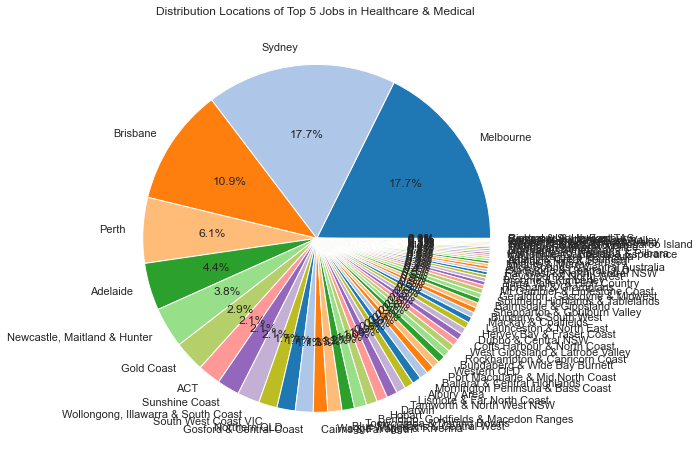

In [51]:
## Locations of top 5 Healthcare & Medical 

top_hm_locations = hmTop.groupby('Location').count()
top_hm_locations['Location'] = top_hm_locations.index
top_hm_locations['Count'] = top_hm_locations["Id"]
top_hm_locations['Not Specified'] = hmTop[~hmTop['Location'].isnull()].count()
top_hm_locations.sort_values("Count",ascending=False,inplace=True)
top_hm_locations

plt.figure(figsize=(8,8))
plt.title("Distribution Locations of Top 5 Jobs in Healthcare & Medical ")
plt.pie(
    top_hm_locations["Count"],
    labels=top_hm_locations["Location"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

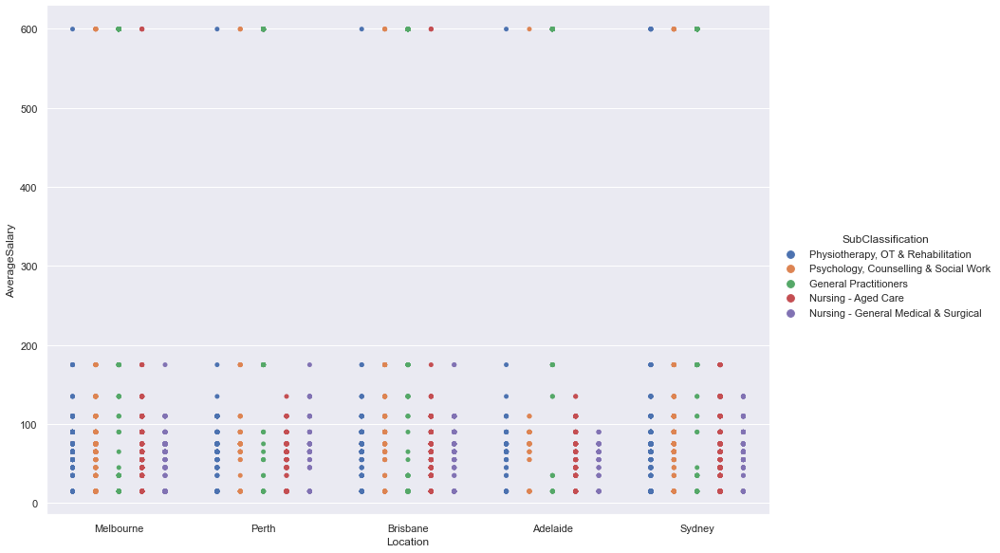

In [52]:
## Distribution of Healthcare & Medical  Jobs

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(hm_top_5)]
ict_loc_dist.head()

sns.catplot(x="Location",
            y="AverageSalary",
            hue="SubClassification",
            data=ict_loc_dist,kind="strip",
            jitter=False,
            dodge=True,
            height=8.27,
            aspect=11.7/8.27
)

/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  w

<AxesSubplot:xlabel='date', ylabel='count'>

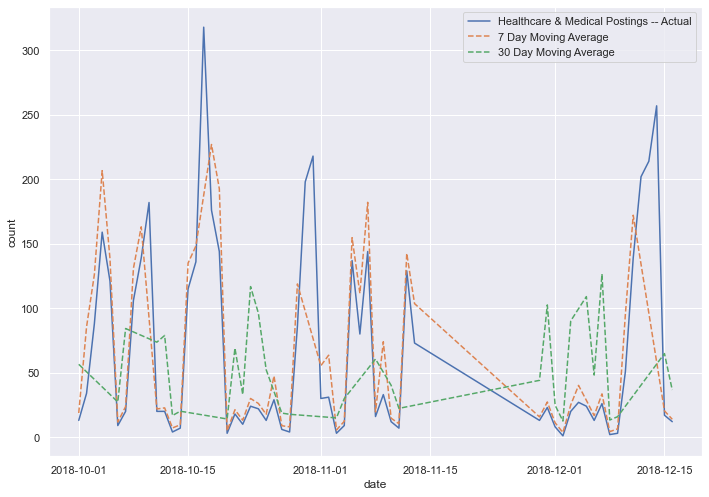

In [53]:
## Distribution of Healthcare & Medical Jobs

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(hm_top_5)]
ict_loc_dist.head()

ict_loc_dist = (pd.to_datetime(ict_loc_dist['Date'])
       .dt.floor('d')
       .value_counts()
       .rename_axis('date')
       .reset_index(name='count'))

period = (len(ict_loc_dist['date']))

sns.set(rc={'figure.figsize':(11.7,8.27)})
f, ax = plt.subplots(1, 1)
ma_df_7 = moving_average(ict_loc_dist, 7, period,'date','count')
ma_df_30 = moving_average(ict_loc_dist, 30, period,'date','count')

sns.lineplot(ict_loc_dist['date'],ict_loc_dist['count'], label='Healthcare & Medical Postings -- Actual')
sns.lineplot(ict_loc_dist['date'],ma_df_7['count'],linestyle='--', label='7 Day Moving Average')
sns.lineplot(ict_loc_dist['date'],ma_df_30['count'],linestyle='--', label='30 Day Moving Average')

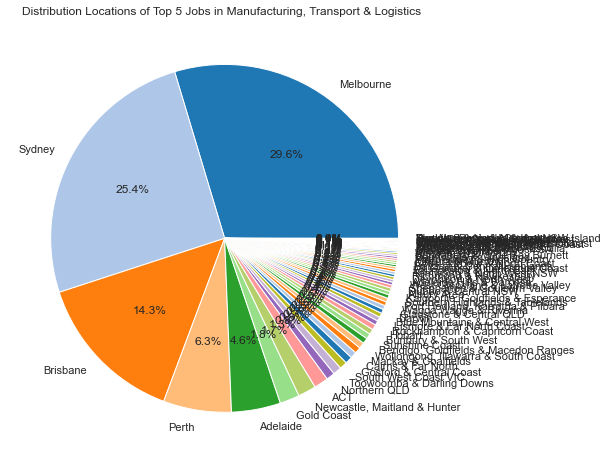

In [54]:
## Locations of top 5 Manufacturing, Transport & Logistics  

top_mtl_locations = mttTop.groupby('Location').count()
top_mtl_locations['Location'] = top_mtl_locations.index
top_mtl_locations['Count'] = top_mtl_locations["Id"]
top_mtl_locations['Not Specified'] = mttTop[~mttTop['Location'].isnull()].count()
top_mtl_locations.sort_values("Count",ascending=False,inplace=True)
top_mtl_locations

plt.figure(figsize=(8,8))
plt.title("Distribution Locations of Top 5 Jobs in Manufacturing, Transport & Logistics  ")
plt.pie(
    top_mtl_locations["Count"],
    labels=top_mtl_locations["Location"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

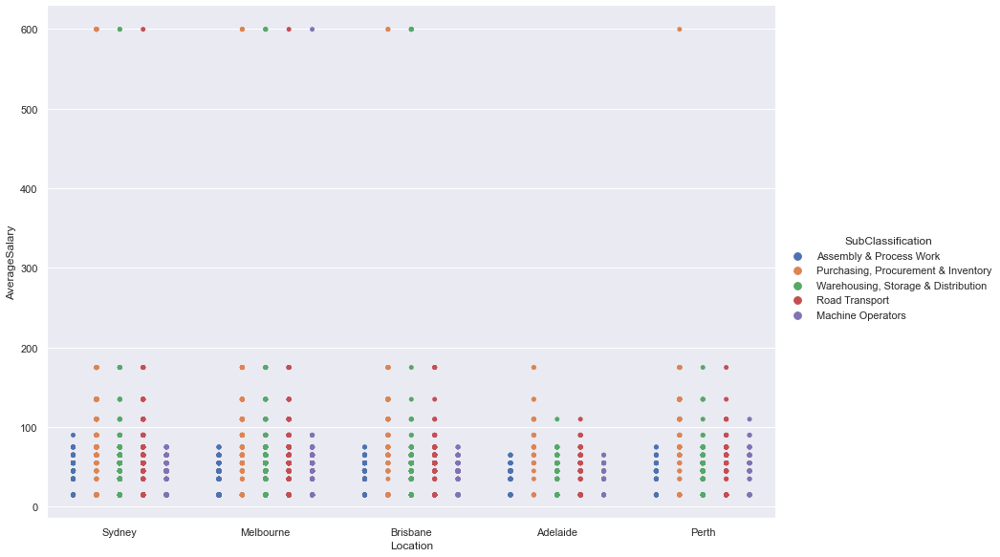

In [55]:
## Distribution of Manufacturing, Transport & Logistics Jobs

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(mtt_top_5)]
ict_loc_dist.head()

sns.catplot(x="Location",
            y="AverageSalary",
            hue="SubClassification",
            data=ict_loc_dist,kind="strip",
            jitter=False,
            dodge=True,
            height=8.27,
            aspect=11.7/8.27
)

/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  w

<AxesSubplot:xlabel='date', ylabel='count'>

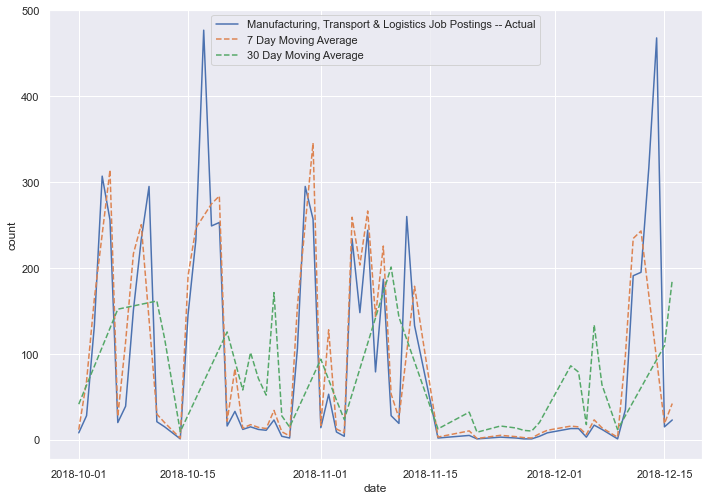

In [56]:
## Distribution of Manufacturing, Transport & Logistics Jobs

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(mtt_top_5)]
ict_loc_dist.head()

ict_loc_dist = (pd.to_datetime(ict_loc_dist['Date'])
       .dt.floor('d')
       .value_counts()
       .rename_axis('date')
       .reset_index(name='count'))

period = (len(ict_loc_dist['date']))

sns.set(rc={'figure.figsize':(11.7,8.27)})
f, ax = plt.subplots(1, 1)
ma_df_7 = moving_average(ict_loc_dist, 7, period,'date','count')
ma_df_30 = moving_average(ict_loc_dist, 30, period,'date','count')

sns.lineplot(ict_loc_dist['date'],ict_loc_dist['count'], label='Manufacturing, Transport & Logistics Job Postings -- Actual')
sns.lineplot(ict_loc_dist['date'],ma_df_7['count'],linestyle='--', label='7 Day Moving Average')
sns.lineplot(ict_loc_dist['date'],ma_df_30['count'],linestyle='--', label='30 Day Moving Average')

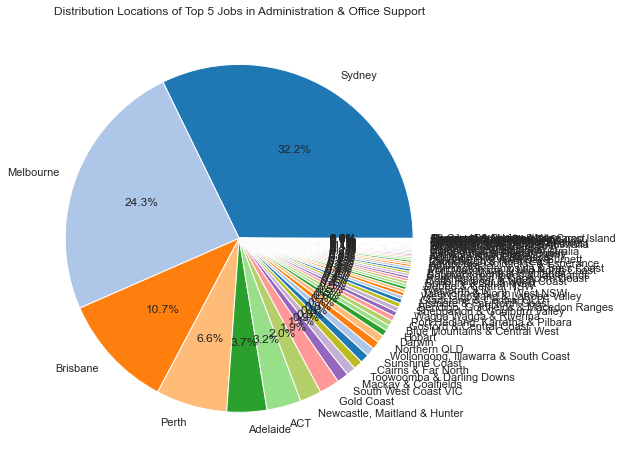

In [57]:
## Locations of top 5 Administration & Office Support   

top_ba_locations = baTop.groupby('Location').count()
top_ba_locations['Location'] = top_ba_locations.index
top_ba_locations['Count'] = top_ba_locations["Id"]
top_ba_locations['Not Specified'] = baTop[~baTop['Location'].isnull()].count()
top_ba_locations.sort_values("Count",ascending=False,inplace=True)
top_ba_locations

plt.figure(figsize=(8,8))
plt.title("Distribution Locations of Top 5 Jobs in Administration & Office Support")
plt.pie(
    top_ba_locations["Count"],
    labels=top_ba_locations["Location"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

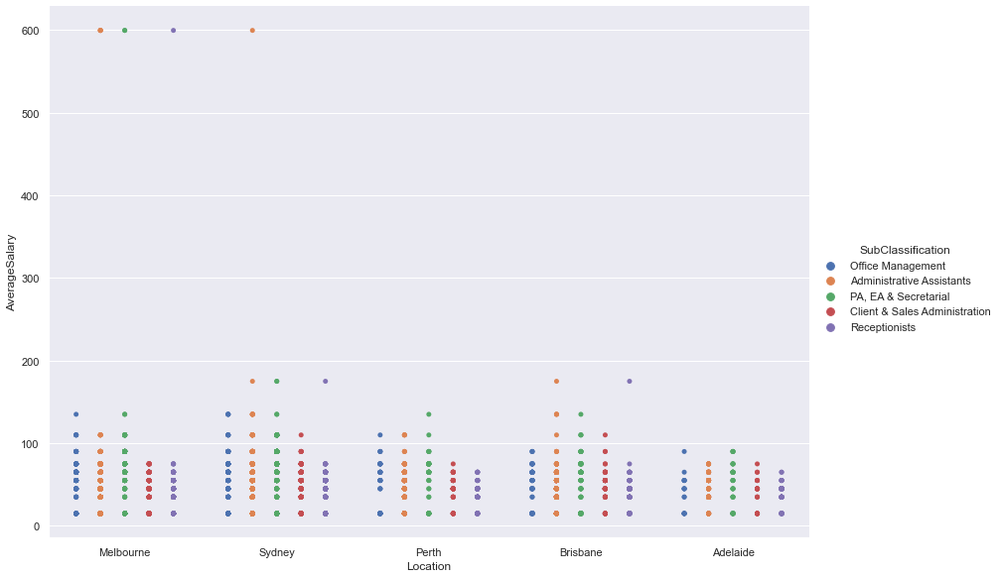

In [58]:
## Distribution of Administration & Office Support 

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(ba_top_5)]
ict_loc_dist.head()

sns.catplot(x="Location",
            y="AverageSalary",
            hue="SubClassification",
            data=ict_loc_dist,kind="strip",
            jitter=False,
            dodge=True,
            height=8.27,
            aspect=11.7/8.27
)

/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  w

<AxesSubplot:xlabel='date', ylabel='count'>

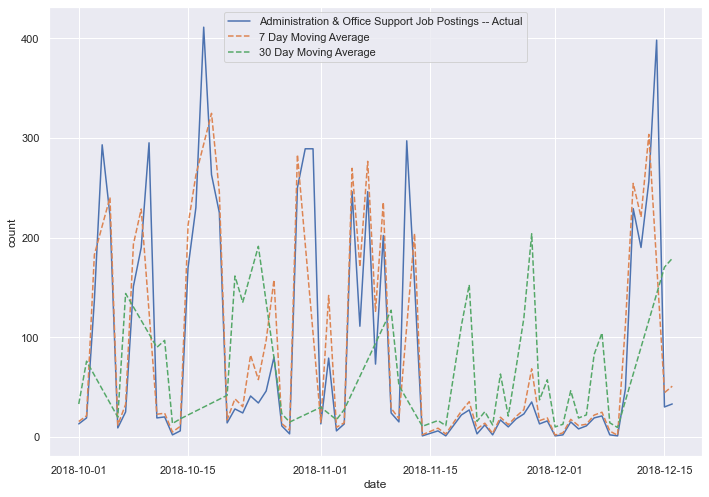

In [59]:
## Distribution of Manufacturing, Administration & Office Support Jobs

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(ba_top_5)]
ict_loc_dist.head()

ict_loc_dist = (pd.to_datetime(ict_loc_dist['Date'])
       .dt.floor('d')
       .value_counts()
       .rename_axis('date')
       .reset_index(name='count'))

period = (len(ict_loc_dist['date']))

sns.set(rc={'figure.figsize':(11.7,8.27)})
f, ax = plt.subplots(1, 1)
ma_df_7 = moving_average(ict_loc_dist, 7, period,'date','count')
ma_df_30 = moving_average(ict_loc_dist, 30, period,'date','count')

sns.lineplot(ict_loc_dist['date'],ict_loc_dist['count'], label='Administration & Office Support Job Postings -- Actual')
sns.lineplot(ict_loc_dist['date'],ma_df_7['count'],linestyle='--', label='7 Day Moving Average')
sns.lineplot(ict_loc_dist['date'],ma_df_30['count'],linestyle='--', label='30 Day Moving Average')

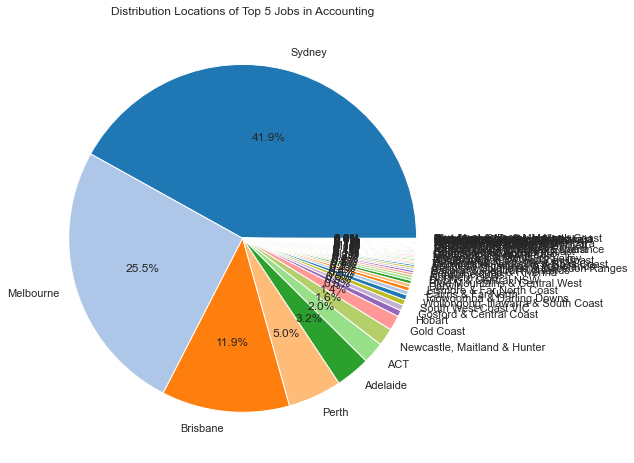

In [60]:
## Locations of top 5 Accounting Jobs

top_cca_locations = accTop.groupby('Location').count()
top_cca_locations['Location'] = top_cca_locations.index
top_cca_locations['Count'] = top_cca_locations["Id"]
top_cca_locations['Not Specified'] = accTop[~accTop['Location'].isnull()].count()
top_cca_locations.sort_values("Count",ascending=False,inplace=True)
top_cca_locations

plt.figure(figsize=(8,8))
plt.title("Distribution Locations of Top 5 Jobs in Accounting")
plt.pie(
    top_cca_locations["Count"],
    labels=top_cca_locations["Location"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

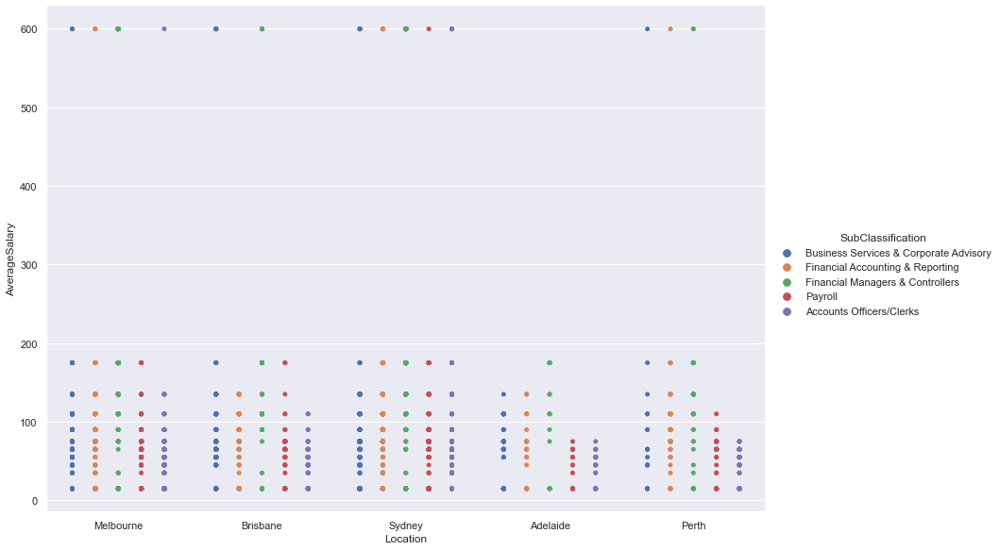

In [61]:
## Distribution of Accounting Jobs in major cities

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(acc_top_5)]
ict_loc_dist.head()

sns.catplot(x="Location",
            y="AverageSalary",
            hue="SubClassification",
            data=ict_loc_dist,kind="strip",
            jitter=False,
            dodge=True,
            height=8.27,
            aspect=11.7/8.27
)

/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  w

<AxesSubplot:xlabel='date', ylabel='count'>

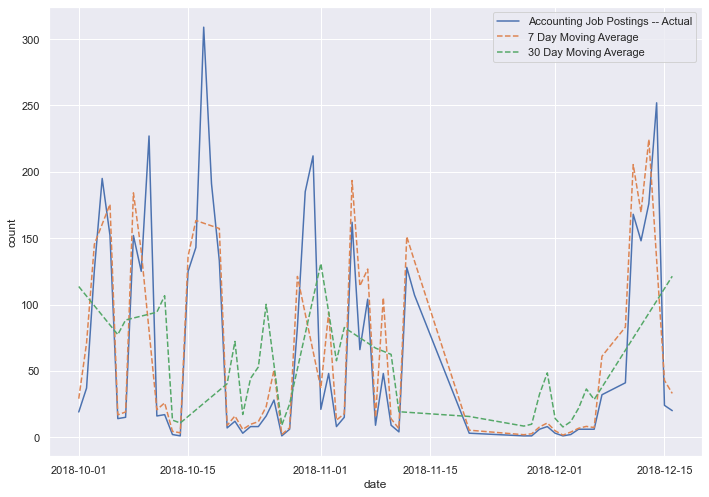

In [62]:
## Distribution of Accounting Jobs

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(acc_top_5)]
ict_loc_dist.head()

ict_loc_dist = (pd.to_datetime(ict_loc_dist['Date'])
       .dt.floor('d')
       .value_counts()
       .rename_axis('date')
       .reset_index(name='count'))

period = (len(ict_loc_dist['date']))

sns.set(rc={'figure.figsize':(11.7,8.27)})
f, ax = plt.subplots(1, 1)
ma_df_7 = moving_average(ict_loc_dist, 7, period,'date','count')
ma_df_30 = moving_average(ict_loc_dist, 30, period,'date','count')

sns.lineplot(ict_loc_dist['date'],ict_loc_dist['count'], label='Accounting Job Postings -- Actual')
sns.lineplot(ict_loc_dist['date'],ma_df_7['count'],linestyle='--', label='7 Day Moving Average')
sns.lineplot(ict_loc_dist['date'],ma_df_30['count'],linestyle='--', label='30 Day Moving Average')

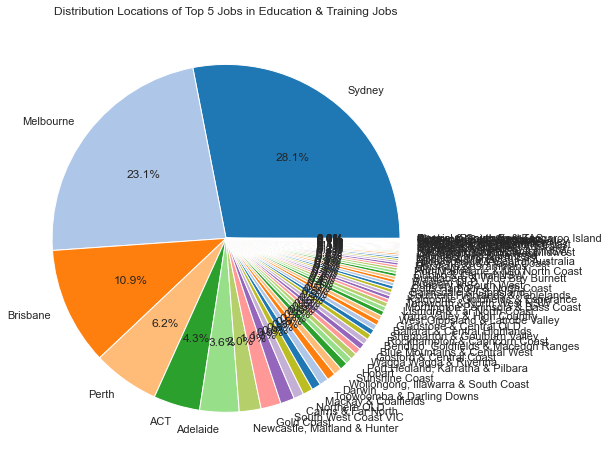

In [63]:
## Locations of top 5 Education & Training Jobs

top_edu_locations = eduTop.groupby('Location').count()
top_edu_locations['Location'] = top_edu_locations.index
top_edu_locations['Count'] = top_edu_locations["Id"]
top_edu_locations['Not Specified'] = eduTop[~eduTop['Location'].isnull()].count()
top_edu_locations.sort_values("Count",ascending=False,inplace=True)
top_edu_locations

plt.figure(figsize=(8,8))
plt.title("Distribution Locations of Top 5 Jobs in Education & Training Jobs")
plt.pie(
    top_edu_locations["Count"],
    labels=top_edu_locations["Location"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

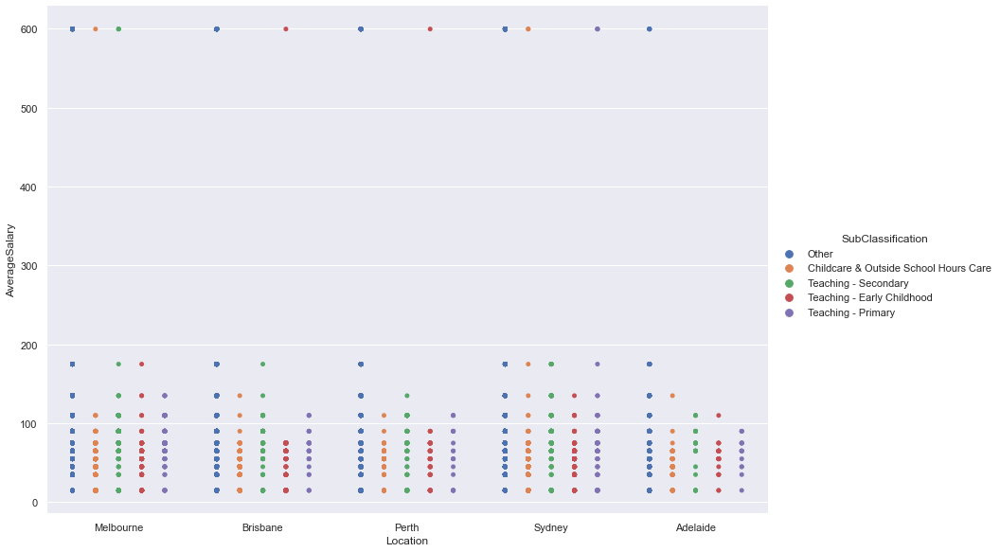

In [64]:
## Distribution of Education & Training Jobs in major cities

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(edu_top_5)]
ict_loc_dist.head()

sns.catplot(x="Location",
            y="AverageSalary",
            hue="SubClassification",
            data=ict_loc_dist,kind="strip",
            jitter=False,
            dodge=True,
            height=8.27,
            aspect=11.7/8.27
)

/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  w

<AxesSubplot:xlabel='date', ylabel='count'>

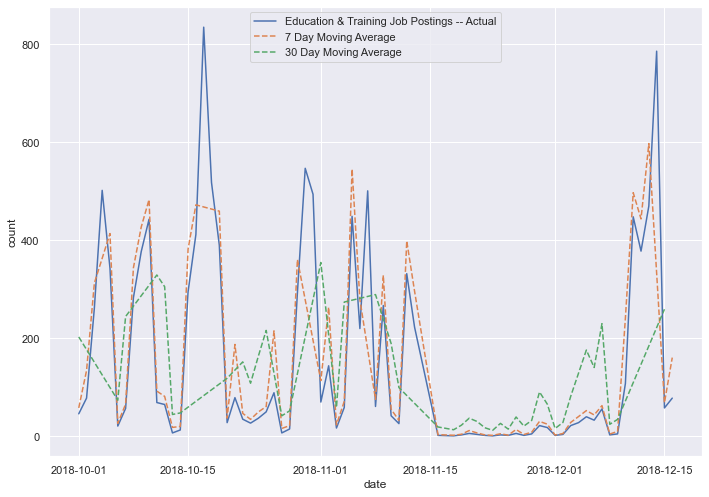

In [65]:
## Distribution of Education & Training Jobs

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(edu_top_5)]
ict_loc_dist.head()

ict_loc_dist = (pd.to_datetime(ict_loc_dist['Date'])
       .dt.floor('d')
       .value_counts()
       .rename_axis('date')
       .reset_index(name='count'))

period = (len(ict_loc_dist['date']))

sns.set(rc={'figure.figsize':(11.7,8.27)})
f, ax = plt.subplots(1, 1)
ma_df_7 = moving_average(ict_loc_dist, 7, period,'date','count')
ma_df_30 = moving_average(ict_loc_dist, 30, period,'date','count')

sns.lineplot(ict_loc_dist['date'],ict_loc_dist['count'], label='Education & Training Job Postings -- Actual')
sns.lineplot(ict_loc_dist['date'],ma_df_7['count'],linestyle='--', label='7 Day Moving Average')
sns.lineplot(ict_loc_dist['date'],ma_df_30['count'],linestyle='--', label='30 Day Moving Average')

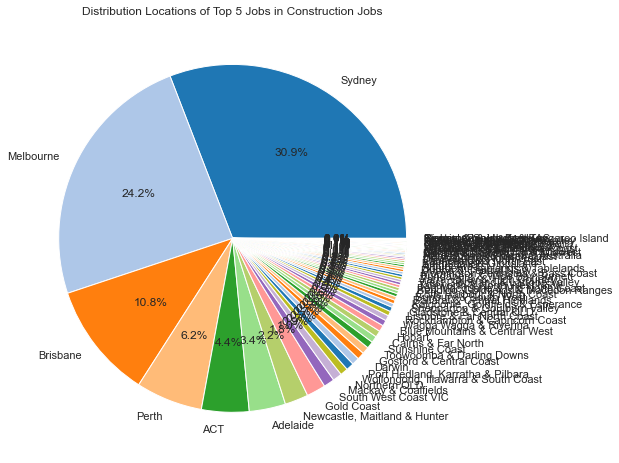

In [66]:
## Locations of top 5 Construction Jobs

top_con_locations = conTop.groupby('Location').count()
top_con_locations['Location'] = top_con_locations.index
top_con_locations['Count'] = top_con_locations["Id"]
top_con_locations['Not Specified'] = conTop[~conTop['Location'].isnull()].count()
top_con_locations.sort_values("Count",ascending=False,inplace=True)
top_con_locations

plt.figure(figsize=(8,8))
plt.title("Distribution Locations of Top 5 Jobs in Construction Jobs")
plt.pie(
    top_con_locations["Count"],
    labels=top_con_locations["Location"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

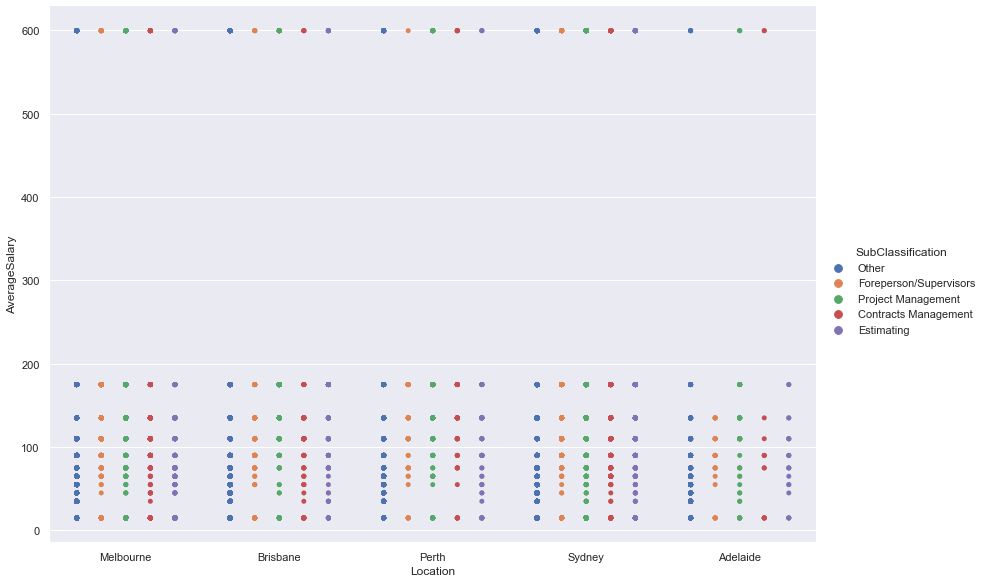

In [67]:
## Distribution of Construction Jobs in major cities

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(con_top_5)]
ict_loc_dist.head()

sns.catplot(x="Location",
            y="AverageSalary",
            hue="SubClassification",
            data=ict_loc_dist,kind="strip",
            jitter=False,
            dodge=True,
            height=8.27,
            aspect=11.7/8.27
)

/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  w

<AxesSubplot:xlabel='date', ylabel='count'>

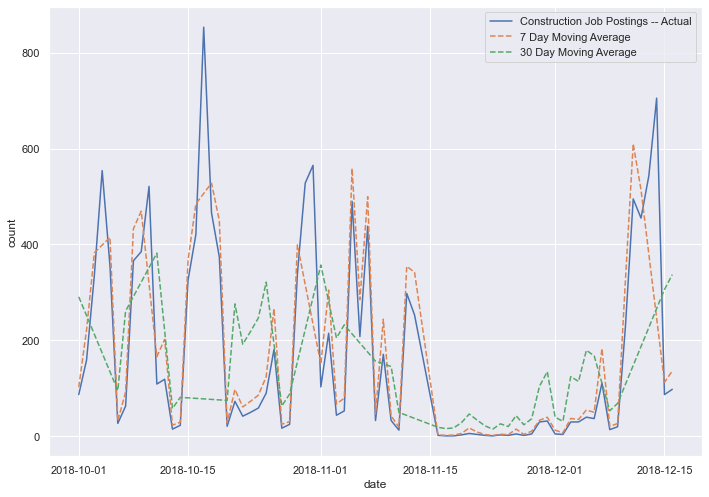

In [68]:
## Distribution of Construction Jobs

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(con_top_5)]
ict_loc_dist.head()

ict_loc_dist = (pd.to_datetime(ict_loc_dist['Date'])
       .dt.floor('d')
       .value_counts()
       .rename_axis('date')
       .reset_index(name='count'))

period = (len(ict_loc_dist['date']))

sns.set(rc={'figure.figsize':(11.7,8.27)})
f, ax = plt.subplots(1, 1)
ma_df_7 = moving_average(ict_loc_dist, 7, period,'date','count')
ma_df_30 = moving_average(ict_loc_dist, 30, period,'date','count')

sns.lineplot(ict_loc_dist['date'],ict_loc_dist['count'], label='Construction Job Postings -- Actual')
sns.lineplot(ict_loc_dist['date'],ma_df_7['count'],linestyle='--', label='7 Day Moving Average')
sns.lineplot(ict_loc_dist['date'],ma_df_30['count'],linestyle='--', label='30 Day Moving Average')

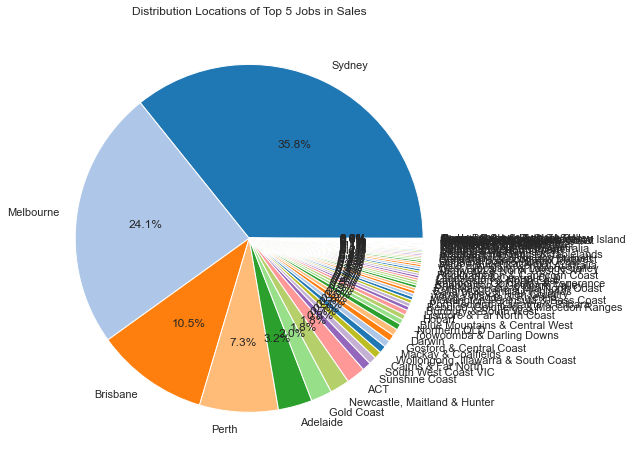

In [69]:
## Locations of top 5 Sales Jobs

top_sale_locations = saleTop.groupby('Location').count()
top_sale_locations['Location'] = top_sale_locations.index
top_sale_locations['Count'] = top_sale_locations["Id"]
top_sale_locations['Not Specified'] = saleTop[~saleTop['Location'].isnull()].count()
top_sale_locations.sort_values("Count",ascending=False,inplace=True)
top_sale_locations

plt.figure(figsize=(8,8))
plt.title("Distribution Locations of Top 5 Jobs in Sales")
plt.pie(
    top_sale_locations["Count"],
    labels=top_sale_locations["Location"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

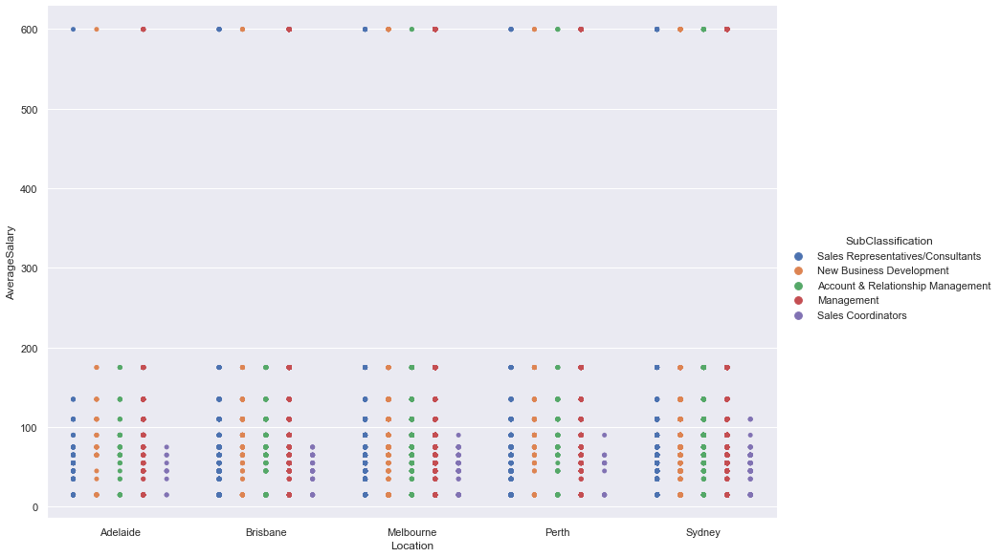

In [70]:
## Distribution of Sales Jobs in major cities

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(sale_top_5)]
ict_loc_dist.head()

sns.catplot(x="Location",
            y="AverageSalary",
            hue="SubClassification",
            data=ict_loc_dist,kind="strip",
            jitter=False,
            dodge=True,
            height=8.27,
            aspect=11.7/8.27
)

/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
/Users/yasin/opt/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  w

<AxesSubplot:xlabel='date', ylabel='count'>

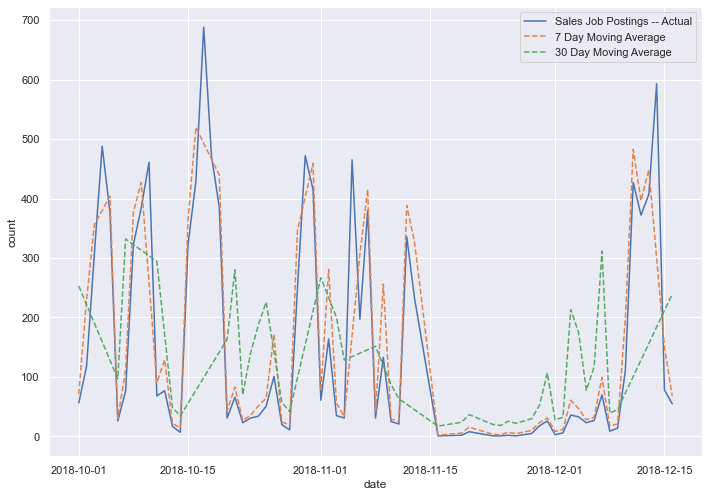

In [71]:
## Distribution of Sales Jobs

ict_loc_dist = df[df['Location'].isin(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'])]
ict_loc_dist = ict_loc_dist[ict_loc_dist['SubClassification'].isin(sale_top_5)]
ict_loc_dist.head()

ict_loc_dist = (pd.to_datetime(ict_loc_dist['Date'])
       .dt.floor('d')
       .value_counts()
       .rename_axis('date')
       .reset_index(name='count'))

period = (len(ict_loc_dist['date']))

sns.set(rc={'figure.figsize':(11.7,8.27)})
f, ax = plt.subplots(1, 1)
ma_df_7 = moving_average(ict_loc_dist, 7, period,'date','count')
ma_df_30 = moving_average(ict_loc_dist, 30, period,'date','count')

sns.lineplot(ict_loc_dist['date'],ict_loc_dist['count'], label='Sales Job Postings -- Actual')
sns.lineplot(ict_loc_dist['date'],ma_df_7['count'],linestyle='--', label='7 Day Moving Average')
sns.lineplot(ict_loc_dist['date'],ma_df_30['count'],linestyle='--', label='30 Day Moving Average')

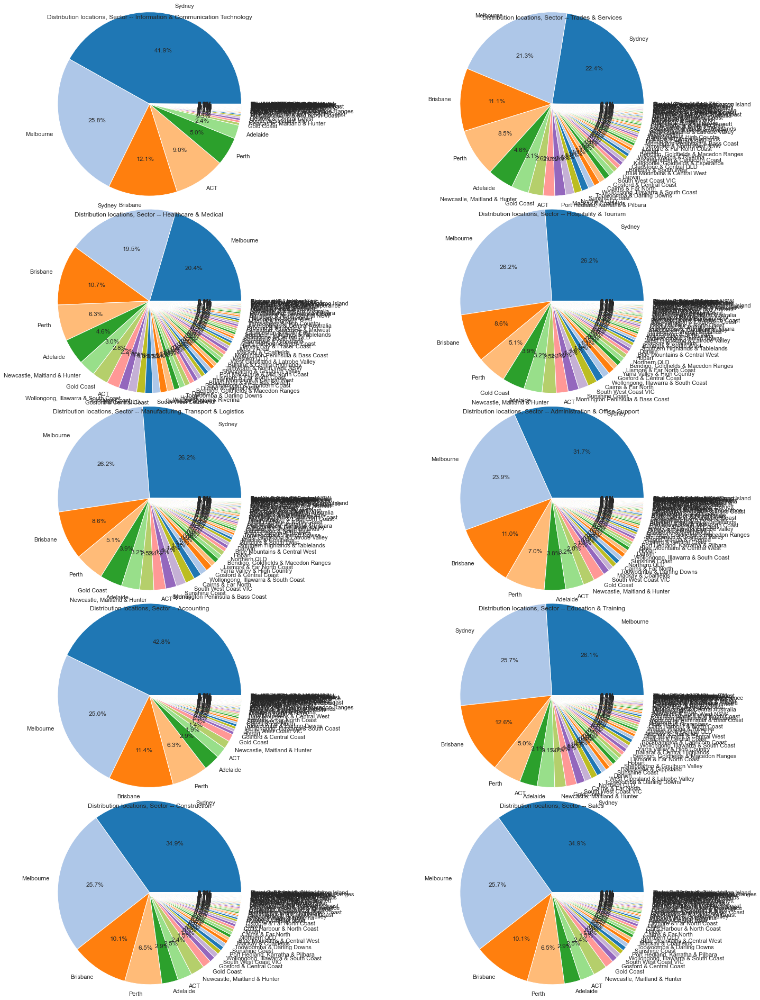

In [100]:
# ['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide']

fig = plt.figure(figsize=(25,25))
fig.savefig('full_figure.png')
left  = 0.125  # the left side of the subplots of the figure
right = 0.9    # the right side of the subplots of the figure
bottom = 2   # the bottom of the subplots of the figure
top = 3  
plt.subplots_adjust(left=left, bottom=bottom, right=right, top=top, wspace=None, hspace=None)

#----------------------------------
ax1 = plt.subplot2grid((5,2),(0,0))
#----------------------------------

# Information & Communication Technology

# data prep
ht = df[df['Classification']=="Information & Communication Technology"]
ht_locations = ht.groupby('Location').count()
ht_locations['Location'] = ht_locations.index
ht_locations['Count'] = ht_locations["Id"]
ht_locations['Not Specified'] = ht[~ht['Location'].isnull()].count()
ht_locations.sort_values("Count",ascending=False,inplace=True)


plt.pie(
    ht_locations["Count"],
    labels=ht_locations["Location"],
    colors=colors,
    radius = 1.4,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

p = plt.gcf()
#p.gca().add_artist(my_circle)
p.gca().set_title('Distribution locations, Sector -- Information & Communication Technology')

#----------------------------------
ax1 = plt.subplot2grid((5,2),(0,1))
#----------------------------------

# Trades & Services

# data prep
ts = df[df['Classification']=="Trades & Services"]
ts_locations = ts.groupby('Location').count()
ts_locations['Location'] = ts_locations.index
ts_locations['Count'] = ts_locations["Id"]
ts_locations['Not Specified'] = ts[~ts['Location'].isnull()].count()
ts_locations.sort_values("Count",ascending=False,inplace=True)

plt.pie(
    ts_locations["Count"],
    labels=ts_locations["Location"],
    colors=colors,
    radius = 1.4,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

p = plt.gcf()
#p.gca().add_artist(my_circle)
p.gca().set_title('Distribution locations, Sector -- Trades & Services')




# #----------------------------------
ax1 = plt.subplot2grid((5,2), (1,0))
# #----------------------------------


# Healthcare & Medical 

# data prep
hm = df[df['Classification']=="Healthcare & Medical"]
hm_locations = hm.groupby('Location').count()
hm_locations['Location'] = hm_locations.index
hm_locations['Count'] = hm_locations["Id"]
hm_locations['Not Specified'] = hm[~hm['Location'].isnull()].count()
hm_locations.sort_values("Count",ascending=False,inplace=True)

plt.pie(
    hm_locations["Count"],
    labels=hm_locations["Location"],
    colors=colors,
    radius = 1.4,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

p = plt.gcf()
#p.gca().add_artist(my_circle)
p.gca().set_title('Distribution locations, Sector -- Healthcare & Medical ')




# #----------------------------------
ax1 = plt.subplot2grid((5,2), (1,1))
# #----------------------------------

# Hospitality & Tourism

# data prep
ht = df[df['Classification']=="Hospitality & Tourism"]
ht_locations = ht.groupby('Location').count()
ht_locations['Location'] = ht_locations.index
ht_locations['Count'] = ht_locations["Id"]
ht_locations['Not Specified'] = ht[~ht['Location'].isnull()].count()
ht_locations.sort_values("Count",ascending=False,inplace=True)


plt.pie(
    ht_locations["Count"],
    labels=ht_locations["Location"],
    colors=colors,
    radius = 1.4,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

p = plt.gcf()
#p.gca().add_artist(my_circle)
p.gca().set_title('Distribution locations, Sector -- Hospitality & Tourism')




# #----------------------------------
ax1 = plt.subplot2grid((5,2), (2,0))
# #----------------------------------

# Manufacturing, Transport & Logistics 

# data prep
mtl = df[df['Classification']=="Manufacturing, Transport & Logistics"]
mtl_locations = ht.groupby('Location').count()
mtl_locations['Location'] = mtl_locations.index
mtl_locations['Count'] = mtl_locations["Id"]
mtl_locations['Not Specified'] = mtl[~mtl['Location'].isnull()].count()
mtl_locations.sort_values("Count",ascending=False,inplace=True)

plt.pie(
    mtl_locations["Count"],
    labels=mtl_locations["Location"],
    colors=colors,
    radius = 1.4,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

p = plt.gcf()
#p.gca().add_artist(my_circle)
p.gca().set_title('Distribution locations, Sector -- Manufacturing, Transport & Logistics ')



# # #----------------------------------
ax1 = plt.subplot2grid((5,2),(2,1))
# # #----------------------------------


# Administration & Office Support 

# data prep
ba = df[df['Classification']=="Administration & Office Support"]
ba_locations = ba.groupby('Location').count()
ba_locations['Location'] = ba_locations.index
ba_locations['Count'] = ba_locations["Id"]
ba_locations['Not Specified'] = ba[~ba['Location'].isnull()].count()
ba_locations.sort_values("Count",ascending=False,inplace=True)

plt.pie(
    ba_locations["Count"],
    labels=ba_locations["Location"],
    colors=colors,
    radius = 1.4,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

p = plt.gcf()
#p.gca().add_artist(my_circle)
p.gca().set_title('Distribution locations, Sector -- Administration & Office Support ')



# #----------------------------------
ax1 = plt.subplot2grid((5,2), (3,0))
# #----------------------------------

# Accounting

# data prep
acc = df[df['Classification']=="Accounting"]
acc_locations = acc.groupby('Location').count()
acc_locations['Location'] = acc_locations.index
acc_locations['Count'] = acc_locations["Id"]
acc_locations['Not Specified'] = acc[~acc['Location'].isnull()].count()
acc_locations.sort_values("Count",ascending=False,inplace=True)

plt.pie(
    acc_locations["Count"],
    labels=acc_locations["Location"],
    colors=colors,
    radius = 1.4,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

p = plt.gcf()
#p.gca().add_artist(my_circle)
p.gca().set_title('Distribution locations, Sector -- Accounting')





# #----------------------------------
ax1 = plt.subplot2grid((5,2), (3,1))
# #----------------------------------

# Education & Training

# data prep
edu = df[df['Classification']=="Education & Training"]
edu_locations = edu.groupby('Location').count()
edu_locations['Location'] = edu_locations.index
edu_locations['Count'] = edu_locations["Id"]
edu_locations['Not Specified'] = edu[~edu['Location'].isnull()].count()
edu_locations.sort_values("Count",ascending=False,inplace=True)

plt.pie(
    edu_locations["Count"],
    labels=edu_locations["Location"],
    colors=colors,
    radius = 1.4,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

p = plt.gcf()
#p.gca().add_artist(my_circle)
p.gca().set_title('Distribution locations, Sector -- Education & Training')




# #----------------------------------
ax1 = plt.subplot2grid((5,2), (4,0))
# #----------------------------------

# Construction

# data prep
con = df[df['Classification']=="Construction"]
con_locations = con.groupby('Location').count()
con_locations['Location'] = con_locations.index
con_locations['Count'] = con_locations["Id"]
con_locations['Not Specified'] = con[~con['Location'].isnull()].count()
con_locations.sort_values("Count",ascending=False,inplace=True)

plt.pie(
    con_locations["Count"],
    labels=con_locations["Location"],
    colors=colors,
    radius = 1.4,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

p = plt.gcf()
#p.gca().add_artist(my_circle)
p.gca().set_title('Distribution locations, Sector -- Construction')



# # #----------------------------------
ax1 = plt.subplot2grid((5,2),(4,1))
# # #----------------------------------

# Sales

# data prep
sales = df[df['Classification']=="Sales"]
sales_locations = con.groupby('Location').count()
sales_locations['Location'] = sales_locations.index
sales_locations['Count'] = sales_locations["Id"]
sales_locations['Not Specified'] = sales[~sales['Location'].isnull()].count()
sales_locations.sort_values("Count",ascending=False,inplace=True)

plt.pie(
    sales_locations["Count"],
    labels=sales_locations["Location"],
    colors=colors,
    radius = 1.4,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

p = plt.gcf()
#p.gca().add_artist(my_circle)
p.gca().set_title('Distribution locations, Sector -- Sales')




# # #----------------------------------
# fig.savefig('ax2_figure_expanded.png', bbox_inches=extent.expanded(1.1, 1.2))
fig.savefig('full_figure.png')

In [72]:
# Salary ranges of top 10 sectors

In [73]:
#Information & Communication Technology
ict_top_5

['Developers/Programmers',
 'Business/Systems Analysts',
 'Programme & Project Management',
 'Architects',
 'Engineering - Software']

In [74]:
# ictTop
ictTop_bySalary = ictTop.groupby('LowestSalary')
ictTop_bySalary_stats = ictTop_bySalary.count()
ictTop_bySalary_stats['Count'] = ictTop_bySalary_stats['Id']
ictTop_bySalary_stats['Count']

LowestSalary
0      1980
30       86
40       42
50       55
60      156
70      287
80      694
100    1491
120    2040
150    3454
200    2310
Name: Count, dtype: int64

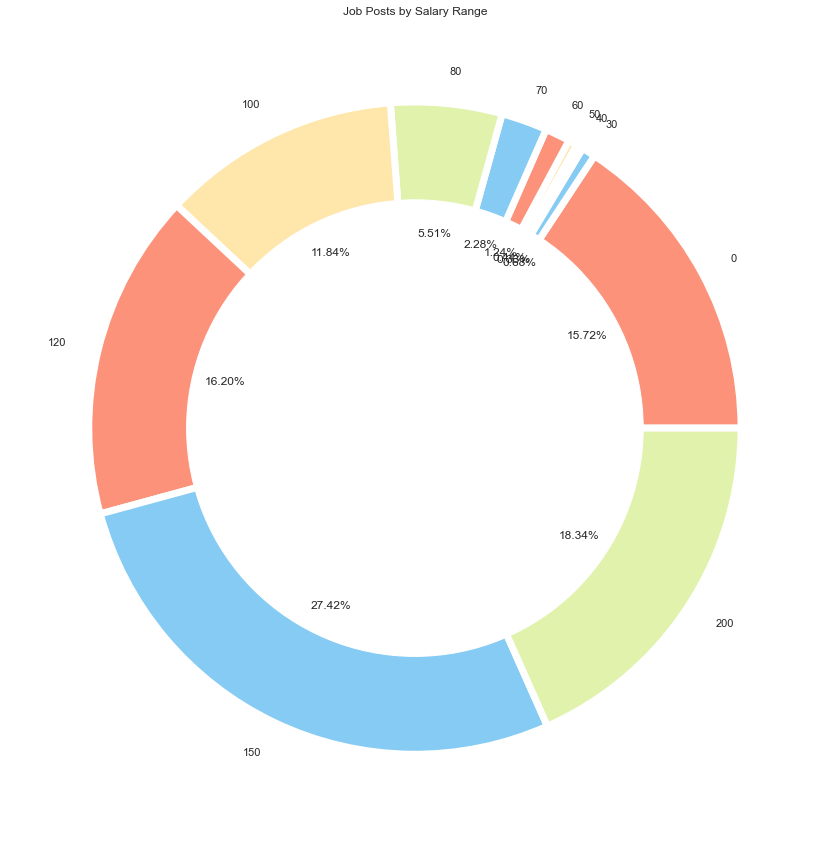

In [75]:
#salary ranges plot



# create data
names = ictTop_bySalary_stats.index
size = ictTop_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

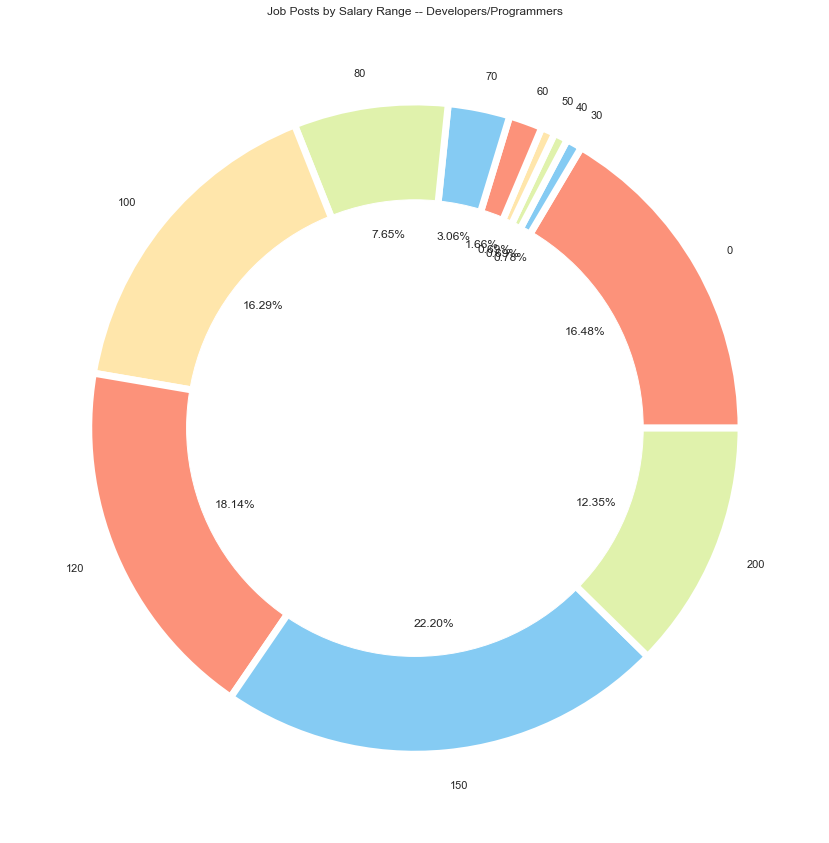

In [76]:
# 'Developers/Programmers'


Developers_Programmers = ictTop[ictTop['SubClassification']=="Developers/Programmers"]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot|
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range -- Developers/Programmers')
# Show the graph
plt.show()

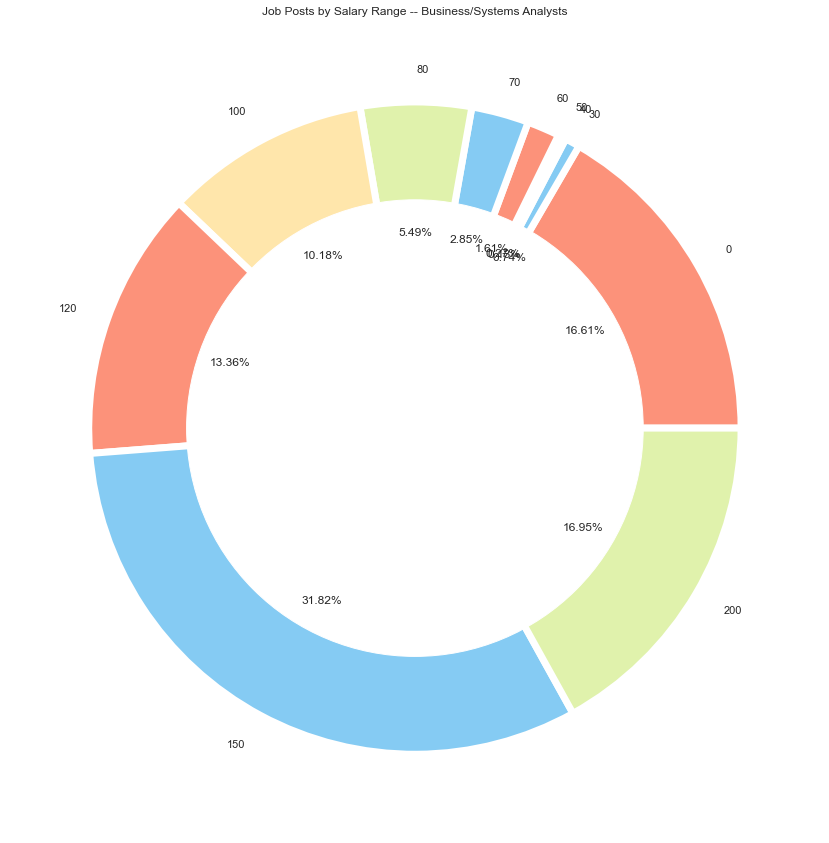

In [77]:
# # 'Business/Systems Analysts',


Developers_Programmers = ictTop[ictTop['SubClassification']=="Business/Systems Analysts"]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range -- Business/Systems Analysts')
# Show the graph
plt.show()

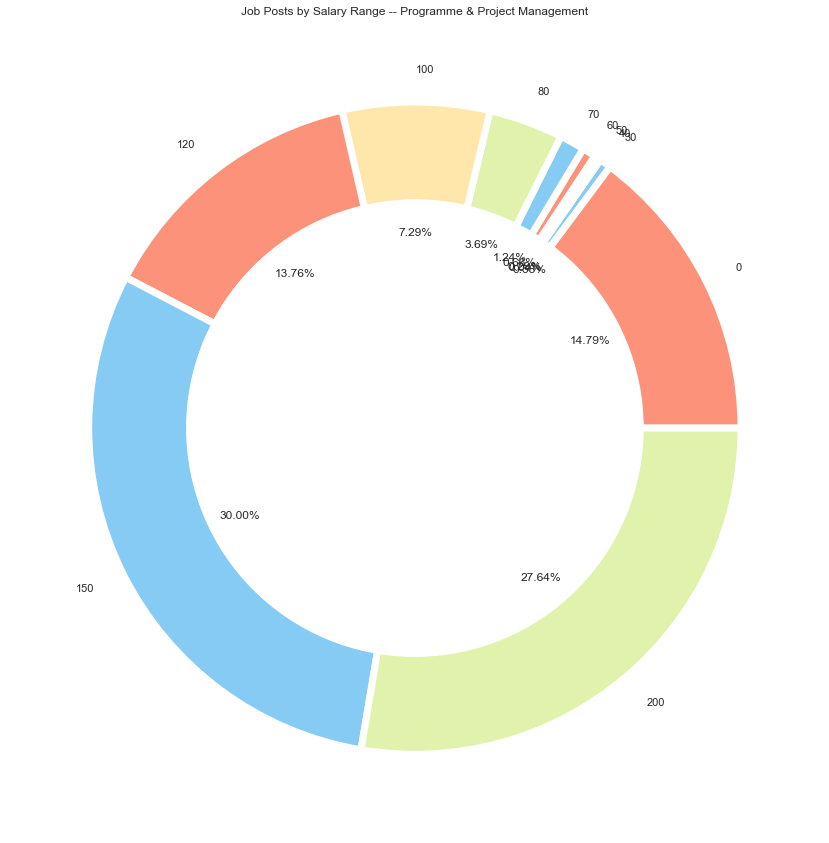

In [78]:
##  'Programme & Project Management',
#  'Architects',
#  'Engineering - Software']

Developers_Programmers = ictTop[ictTop['SubClassification']=="Programme & Project Management"]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range -- Programme & Project Management')
# Show the graph
plt.show()

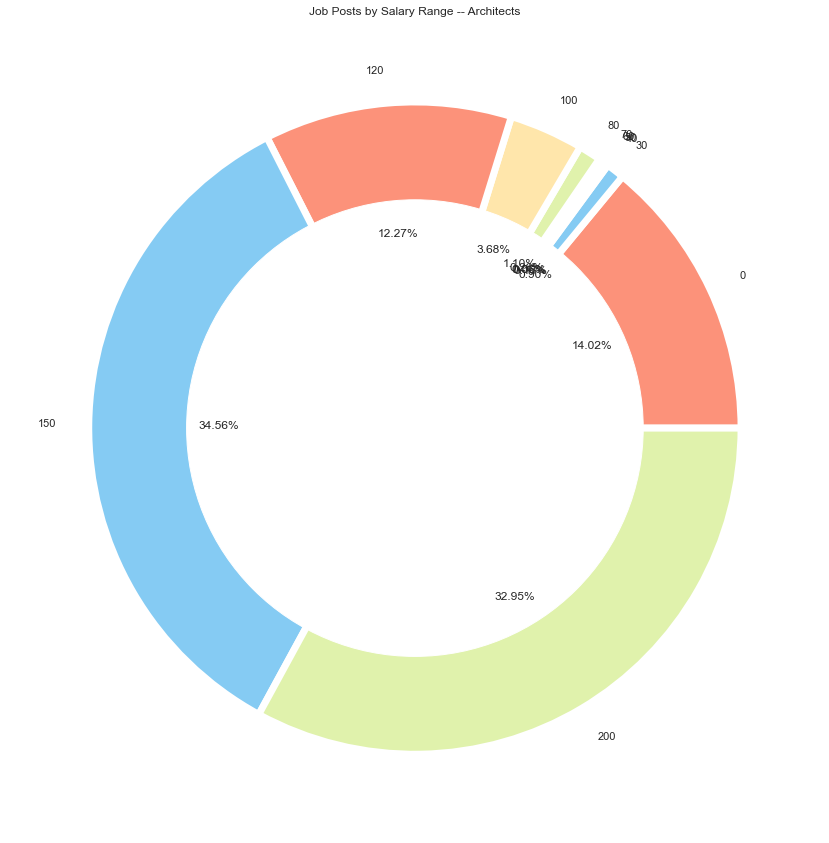

In [79]:
#  'Architects',


Developers_Programmers = ictTop[ictTop['SubClassification']=="Architects"]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range -- Architects')
# Show the graph
plt.show()

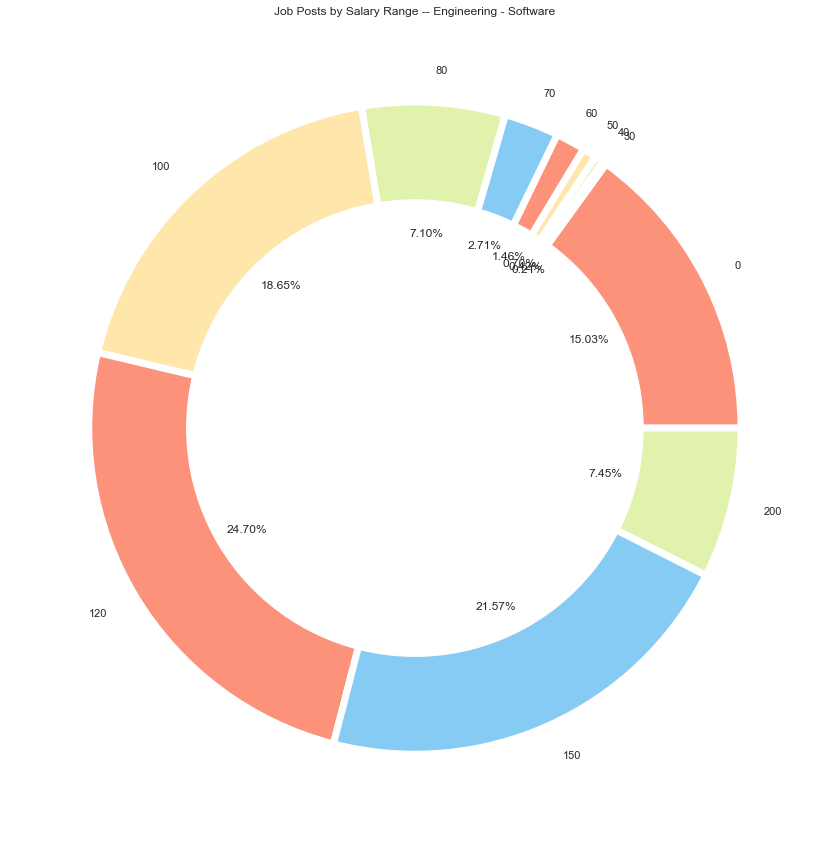

In [80]:
#  'Engineering - Software'

Developers_Programmers = ictTop[ictTop['SubClassification']=="Engineering - Software"]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range -- Engineering - Software')
# Show the graph
plt.show()

Text(0.5, 1.0, 'Salary Range for Engineering - Software')

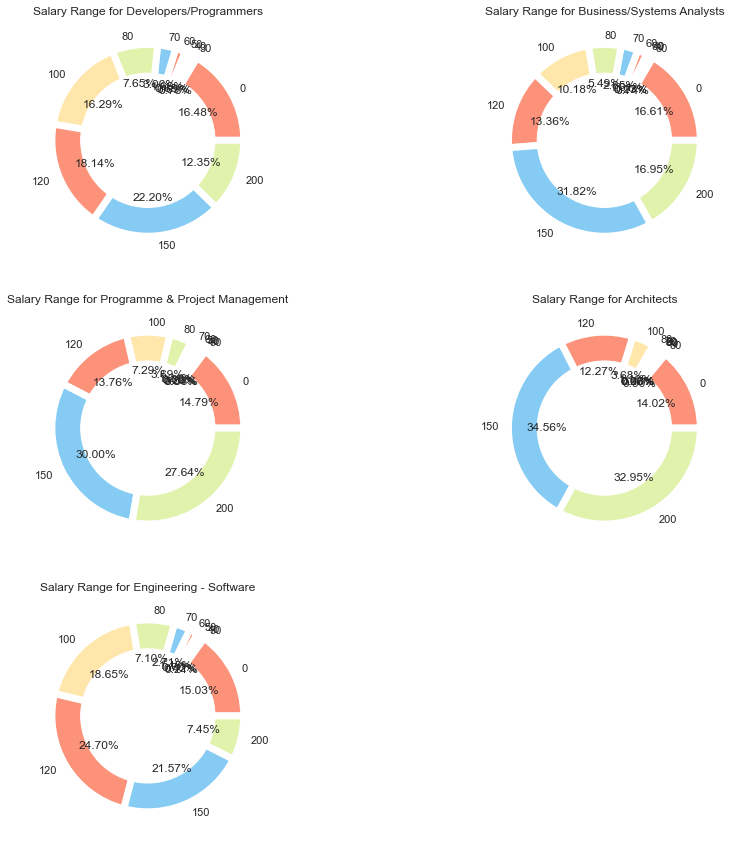

In [81]:
fig = plt.figure(figsize=(15,15))

ax1 = plt.subplot2grid((3,2),(0,0))
#----------------------------------

# 'Developers/Programmers',


Developers_Programmers = ictTop[ictTop['SubClassification']==ict_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Developers/Programmers')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (0, 1))
#----------------------------------

# 'Business/Systems Analysts',


Developers_Programmers = ictTop[ictTop['SubClassification']==ict_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Business/Systems Analysts')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 0))
#----------------------------------

# 'Programme & Project Management',

    
Developers_Programmers = ictTop[ictTop['SubClassification']==ict_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Programme & Project Management')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 1))
#----------------------------------

# 'Architects',

    
Developers_Programmers = ictTop[ictTop['SubClassification']==ict_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Architects')
# Show the graph


# #----------------------------------
ax1 = plt.subplot2grid((3,2),(2,0))
# #----------------------------------

 #'Engineering - Software'
    
Developers_Programmers = ictTop[ictTop['SubClassification']==ict_top_5[4]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Engineering - Software')


# #----------------------------------

In [82]:
# Trades & Services  
ts_top_5

['Automotive Trades',
 'Electricians',
 'Labourers',
 'Fitters, Turners & Machinists',
 'Technicians']

In [83]:
tsTop

ictTop_bySalary = tsTop.groupby('LowestSalary')
ictTop_bySalary_stats = ictTop_bySalary.count()
ictTop_bySalary_stats['Count'] = ictTop_bySalary_stats['Id']
ictTop_bySalary_stats['Count']

LowestSalary
0      1964
30     1172
40      962
50     1000
60     1378
70     1255
80      642
100     444
120     181
150      65
200      13
Name: Count, dtype: int64

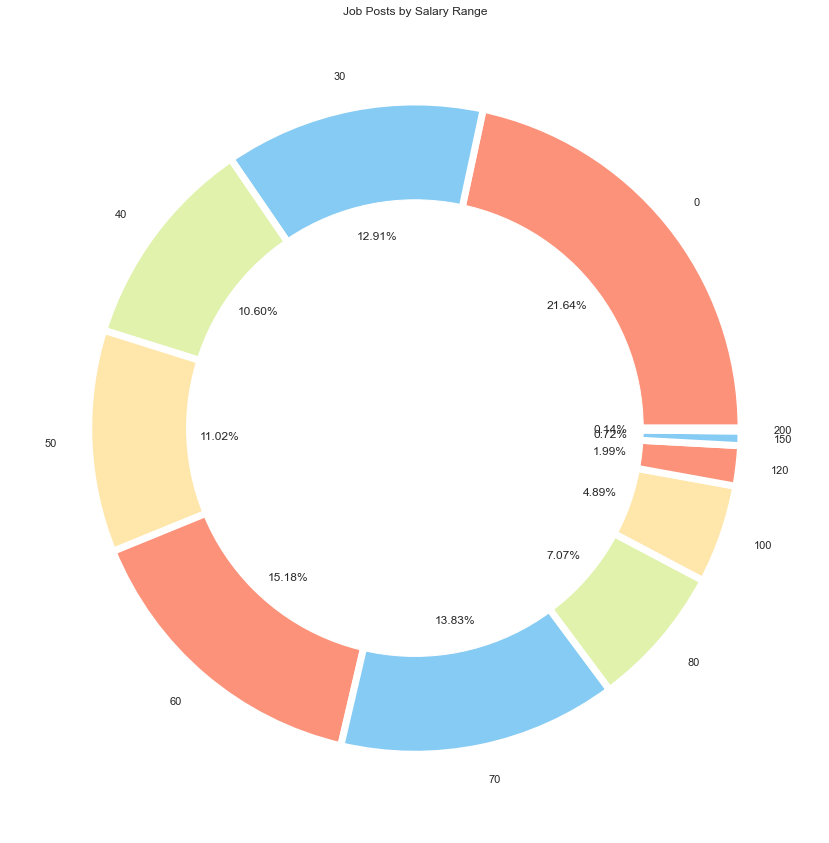

In [84]:
#salary ranges plot



# create data
names = ictTop_bySalary_stats.index
size = ictTop_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

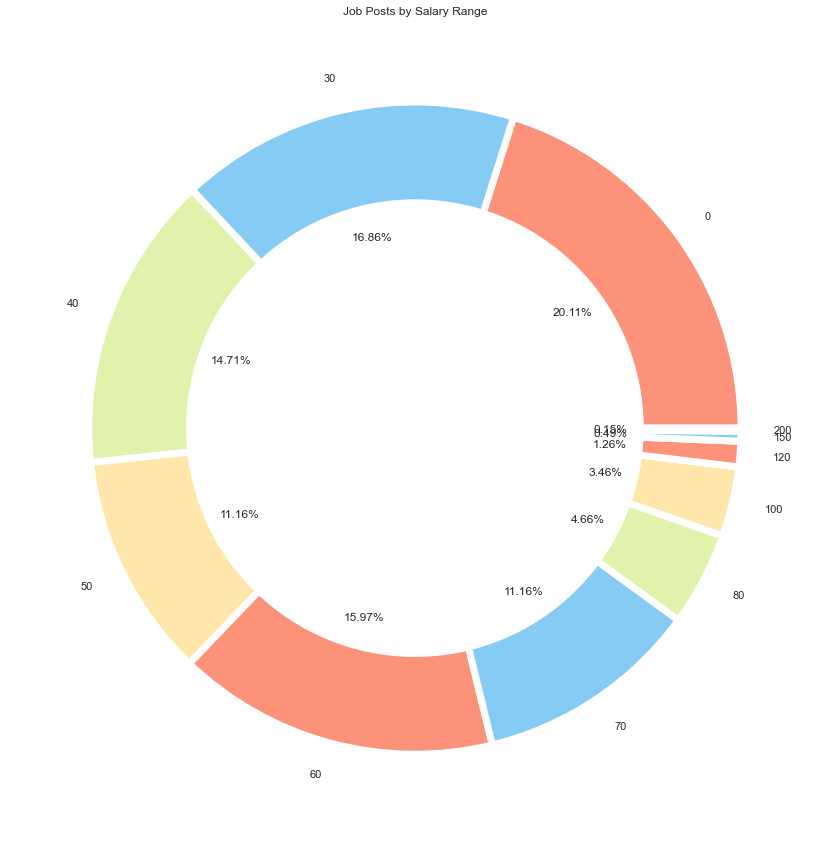

In [85]:
#'Automotive Trades',


Automotive_Trades = tsTop[tsTop['SubClassification']=="Automotive Trades"]
Automotive_Trades_bySalary = Automotive_Trades.groupby('LowestSalary')
Automotive_Trades_bySalary_stats = Automotive_Trades_bySalary.count()
Automotive_Trades_bySalary_stats['Count'] = Automotive_Trades_bySalary_stats['Id']
Automotive_Trades_bySalary_stats['Count']

# create data
names = Automotive_Trades_bySalary_stats.index
size = Automotive_Trades_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

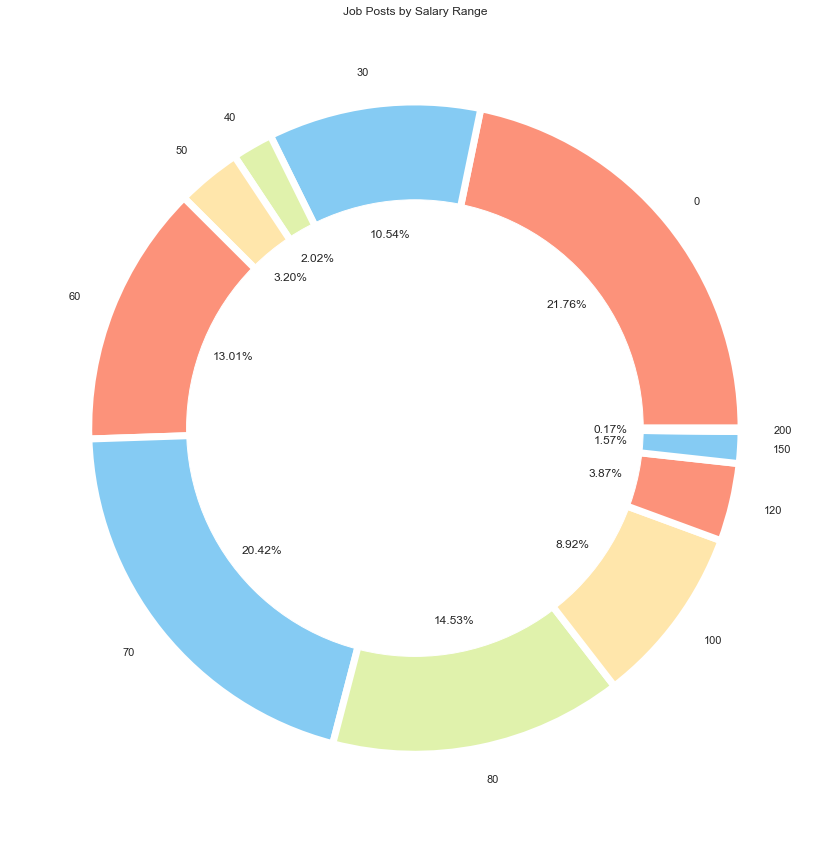

In [86]:
# 'Electricians',

ts_electricians = tsTop[tsTop['SubClassification']=="Electricians"]
ts_electricians_bySalary = ts_electricians.groupby('LowestSalary')
ts_electricians_bySalary_stats = ts_electricians_bySalary.count()
ts_electricians_bySalary_stats['Count'] = ts_electricians_bySalary_stats['Id']
ts_electricians_bySalary_stats['Count']

# create data
names = ts_electricians_bySalary_stats.index
size = ts_electricians_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

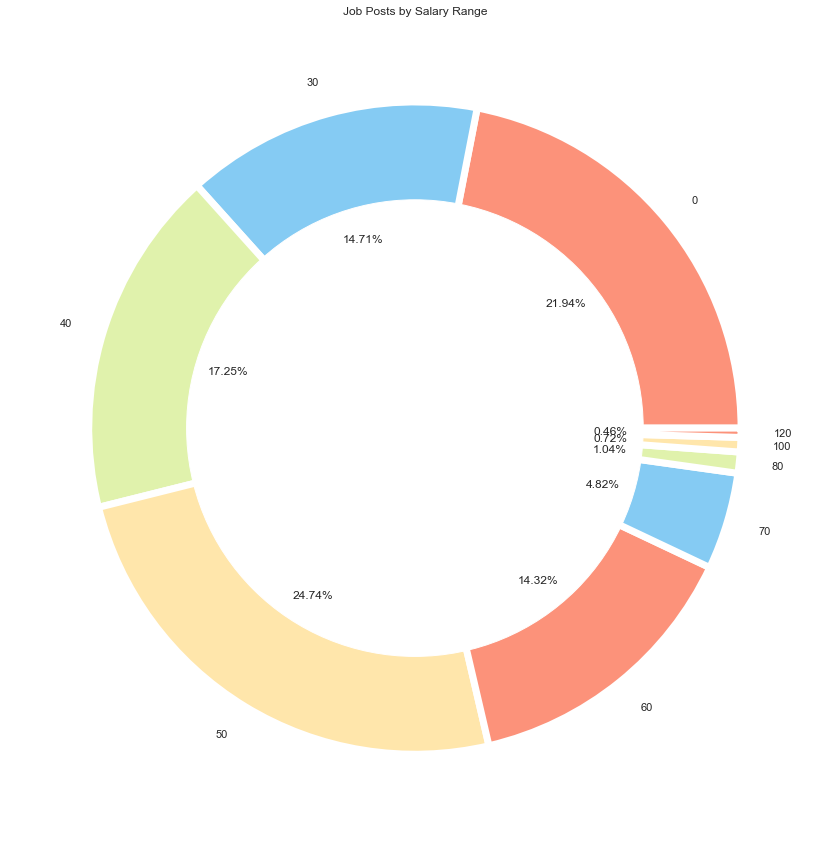

In [87]:
# 'Labourers',
    
ts_labourers = tsTop[tsTop['SubClassification']=="Labourers"]
ts_labourers_bySalary = ts_labourers.groupby('LowestSalary')
ts_labourers_bySalary_stats = ts_labourers_bySalary.count()
ts_labourers_bySalary_stats['Count'] = ts_labourers_bySalary_stats['Id']
ts_labourers_bySalary_stats['Count']

# create data
names = ts_labourers_bySalary_stats.index
size = ts_labourers_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()



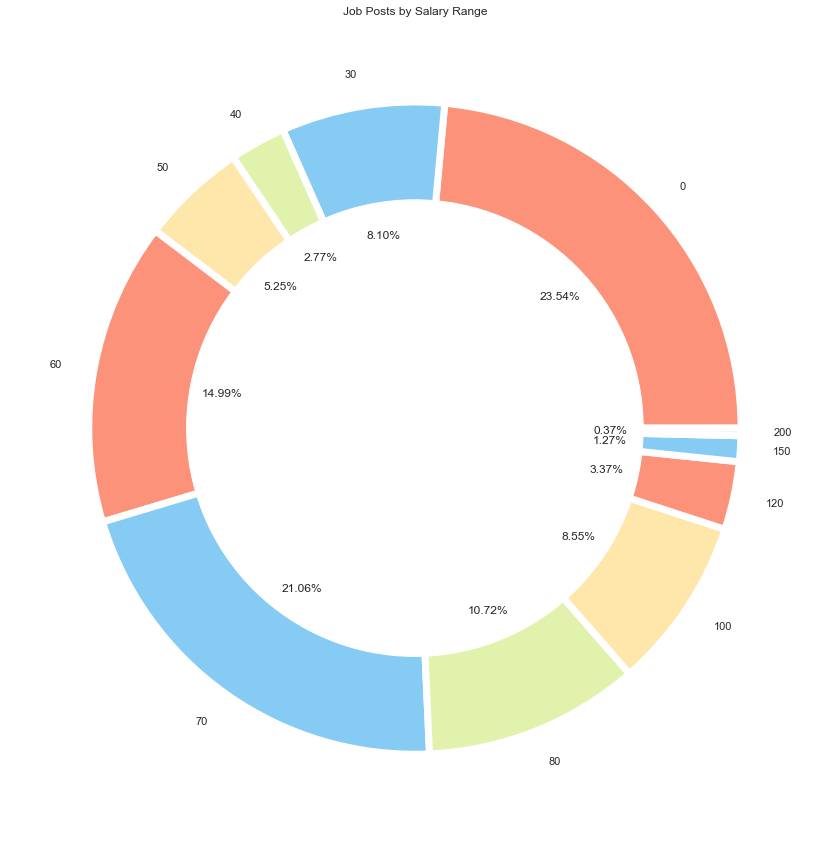

In [88]:
 #'Fitters, Turners & Machinists']
    
ts_fittersTurnersMachines = tsTop[tsTop['SubClassification']=="Fitters, Turners & Machinists"]
ts_fittersTurnersMachines_bySalary = ts_fittersTurnersMachines.groupby('LowestSalary')
ts_fittersTurnersMachines_bySalary_stats = ts_fittersTurnersMachines_bySalary.count()
ts_fittersTurnersMachines_bySalary_stats['Count'] = ts_fittersTurnersMachines_bySalary_stats['Id']
ts_fittersTurnersMachines_bySalary_stats['Count']

# create data
names = ts_fittersTurnersMachines_bySalary_stats.index
size = ts_fittersTurnersMachines_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

Text(0.5, 1.0, 'Job Posts by Salary Range -- Technicians')

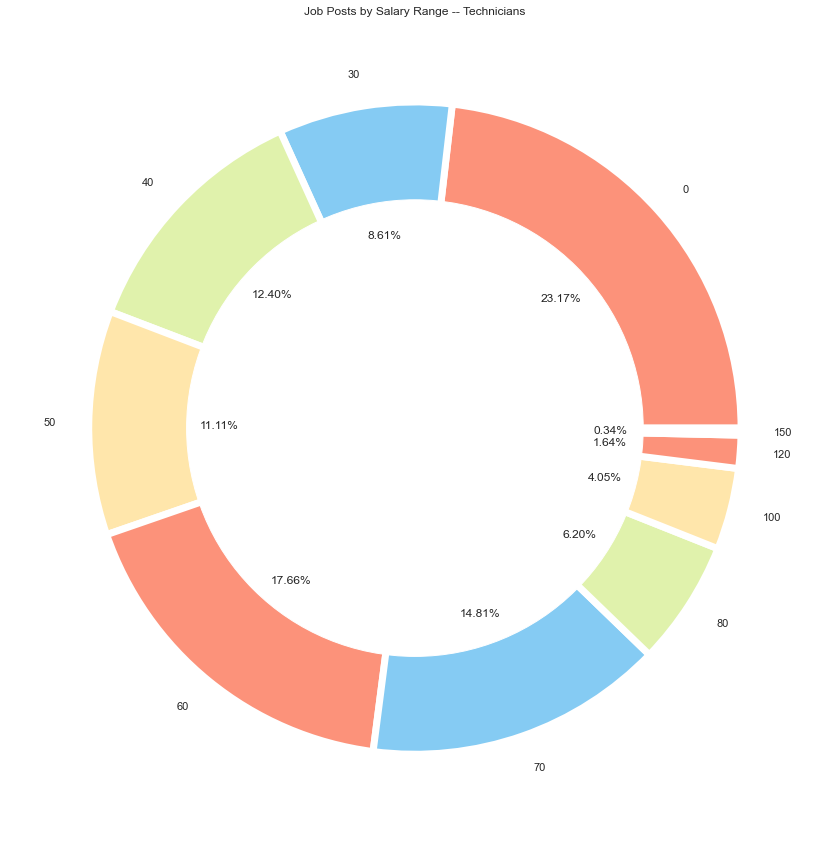

In [89]:
ts_technicians = tsTop[tsTop['SubClassification']=="Technicians"]
ts_technicians_bySalary = ts_technicians.groupby('LowestSalary')
ts_technicians_bySalary_stats = ts_technicians_bySalary.count()
ts_technicians_bySalary_stats['Count'] = ts_technicians_bySalary_stats['Id']
ts_technicians_bySalary_stats['Count']

# create data
names = ts_technicians_bySalary_stats.index
size = ts_technicians_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range -- Technicians')
# Show the graph
# plt.show()

Text(0.5, 1.0, 'Salary Range for Nursing - General Medical & Surgical')

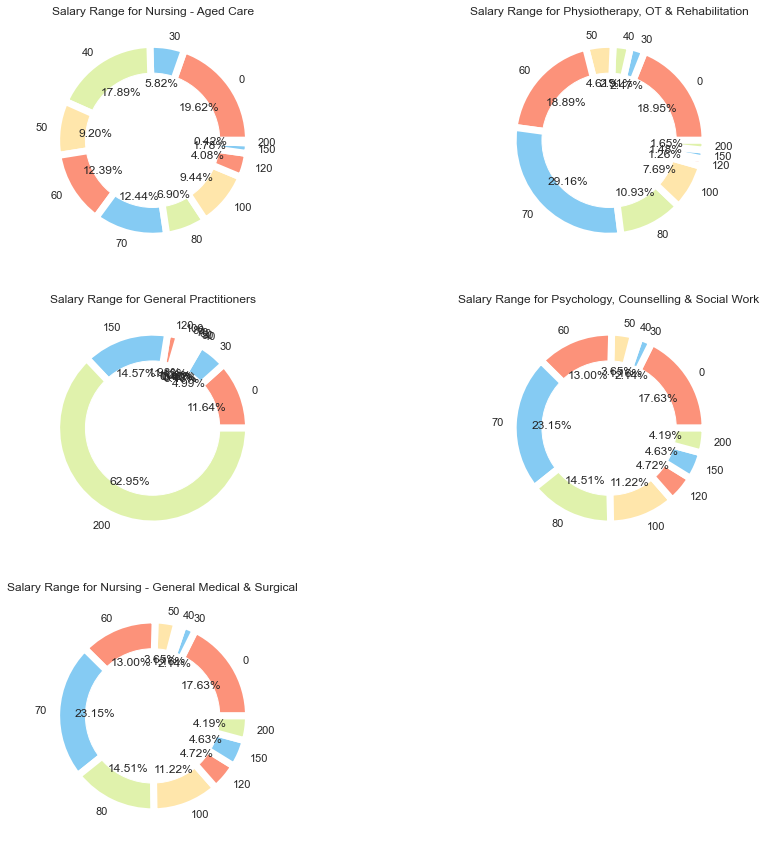

In [90]:
fig = plt.figure(figsize=(15,15))

ax1 = plt.subplot2grid((3,2),(0,0))
#----------------------------------

# 'Nursing - Aged Care',


Developers_Programmers = hmTop[hmTop['SubClassification']==hm_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Nursing - Aged Care')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (0, 1))
#----------------------------------

# 'Physiotherapy, OT & Rehabilitation',


Developers_Programmers = hmTop[hmTop['SubClassification']==hm_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Physiotherapy, OT & Rehabilitation')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 0))
#----------------------------------

# 'General Practitioners',

    
Developers_Programmers = hmTop[hmTop['SubClassification']==hm_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for General Practitioners')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 1))
#----------------------------------

# 'Psychology, Counselling & Social Work',

    
Developers_Programmers = hmTop[hmTop['SubClassification']==hm_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Psychology, Counselling & Social Work')
# Show the graph


# #----------------------------------
ax1 = plt.subplot2grid((3,2),(2,0))
# #----------------------------------

 #'Nursing - General Medical & Surgical'
    
Developers_Programmers = hmTop[hmTop['SubClassification']==hm_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Nursing - General Medical & Surgical')


# #----------------------------------

In [91]:
#Healthcare & Medical
hmTop
hm_top_5

['Nursing - Aged Care',
 'Physiotherapy, OT & Rehabilitation',
 'General Practitioners',
 'Psychology, Counselling & Social Work',
 'Nursing - General Medical & Surgical']

In [92]:
ictTop_bySalary = hmTop.groupby('LowestSalary')
ictTop_bySalary_stats = ictTop_bySalary.count()
ictTop_bySalary_stats['Count'] = ictTop_bySalary_stats['Id']
ictTop_bySalary_stats['Count']

LowestSalary
0      1337
30      280
40      504
50      398
60      958
70     1296
80      633
100     578
120     217
150     319
200     883
Name: Count, dtype: int64

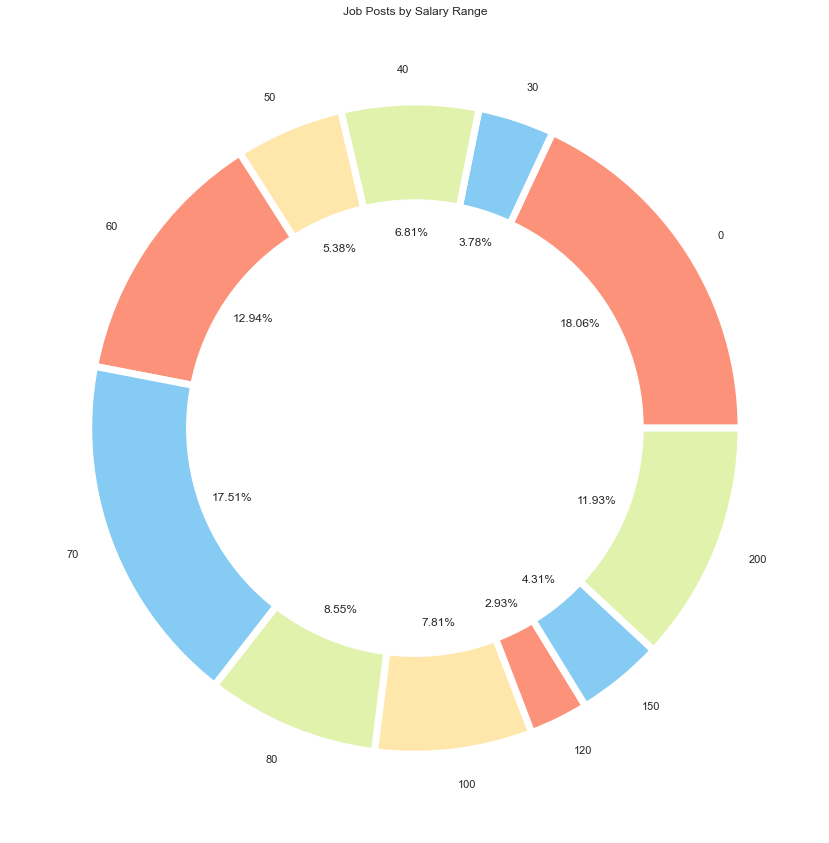

In [93]:
#salary ranges plot



# create data
names = ictTop_bySalary_stats.index
size = ictTop_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

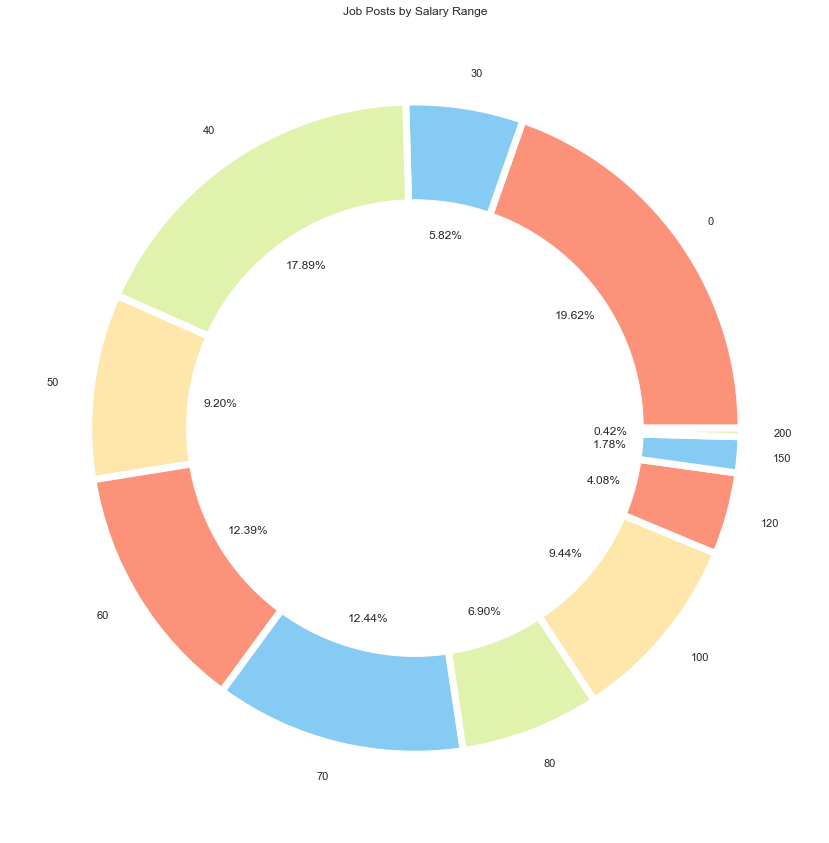

In [94]:
# 'Nursing - Aged Care',


Developers_Programmers = hmTop[hmTop['SubClassification']==hm_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

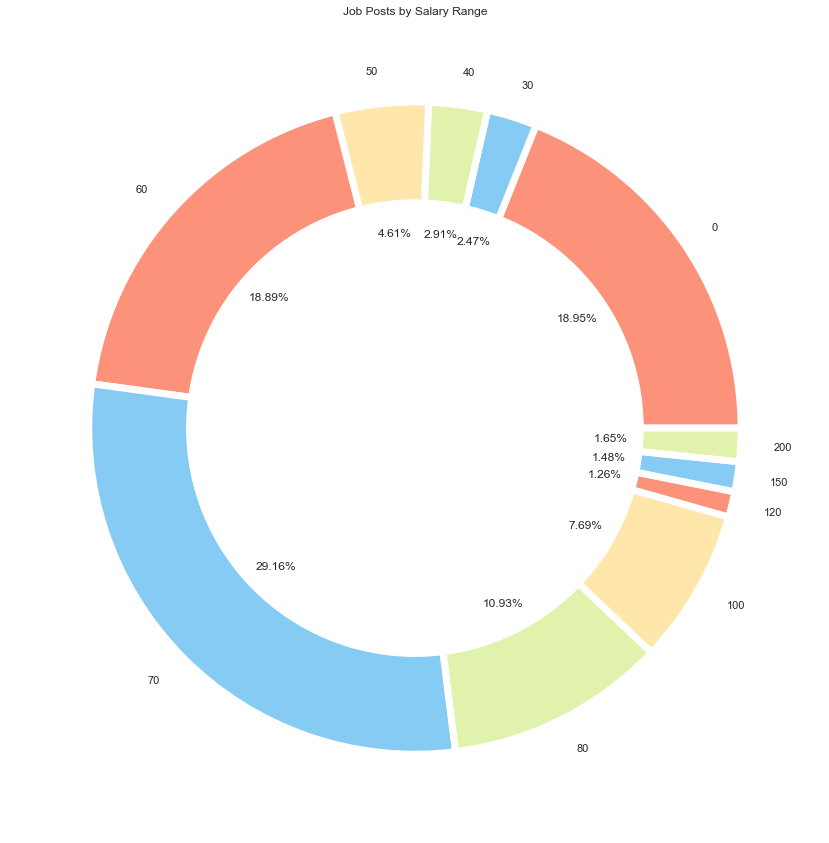

In [95]:
# 'Physiotherapy, OT & Rehabilitation',


Developers_Programmers = hmTop[hmTop['SubClassification']==hm_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

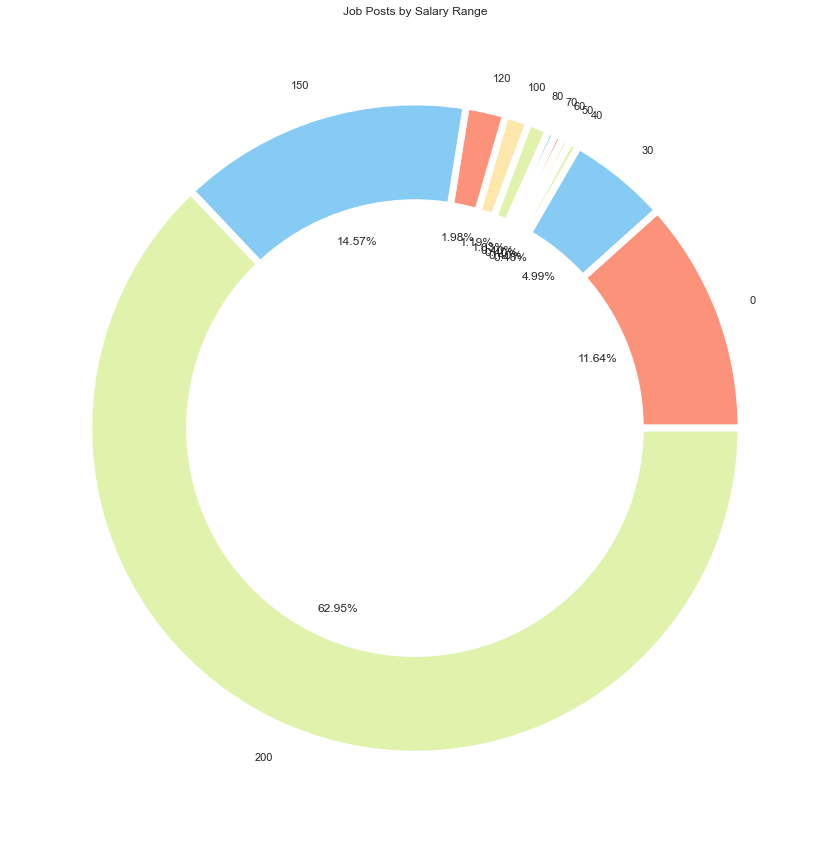

In [96]:
# 'General Practitioners',

    
Developers_Programmers = hmTop[hmTop['SubClassification']==hm_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

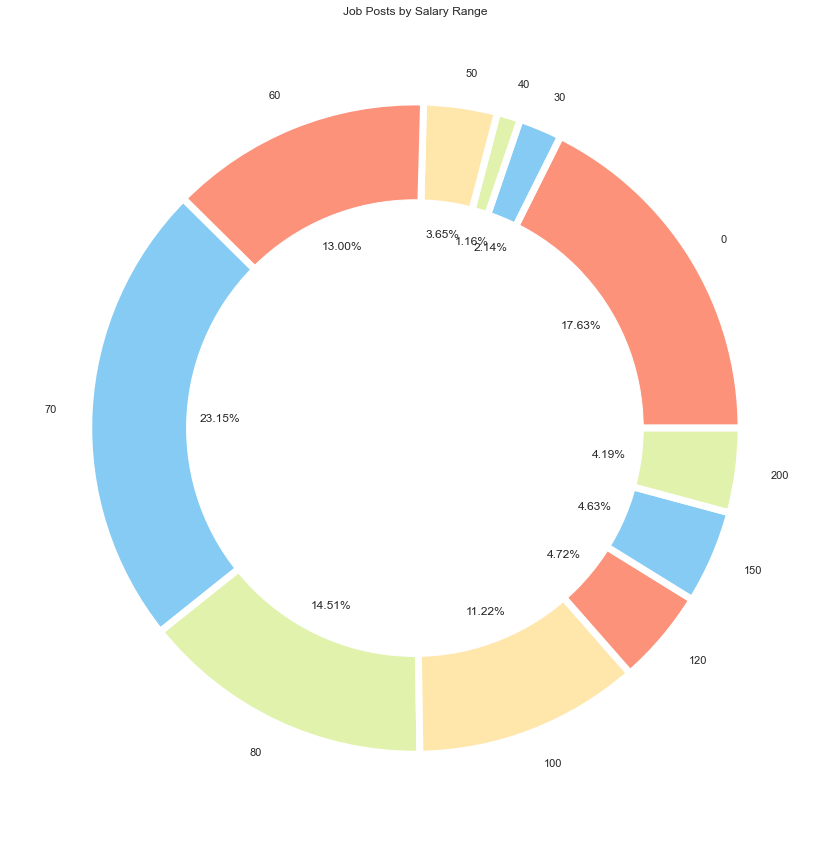

In [97]:
# 'Psychology, Counselling & Social Work',

    
Developers_Programmers = hmTop[hmTop['SubClassification']==hm_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

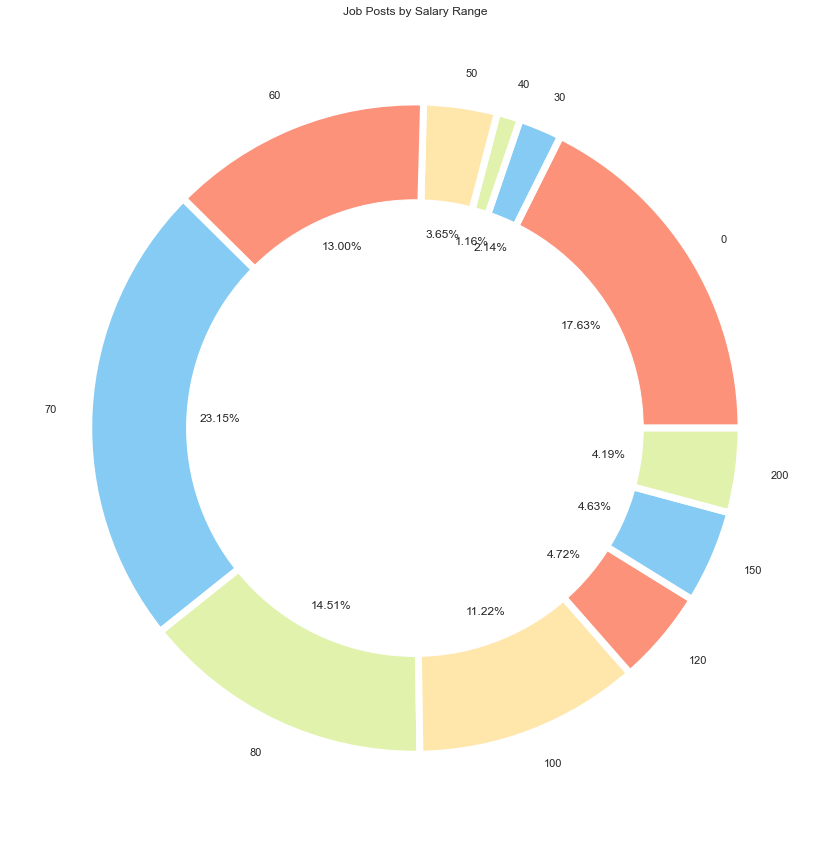

In [98]:
 #'Nursing - General Medical & Surgical'
    
Developers_Programmers = hmTop[hmTop['SubClassification']==hm_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

Text(0.5, 1.0, 'Job Posts by Salary Range -- Technicians')

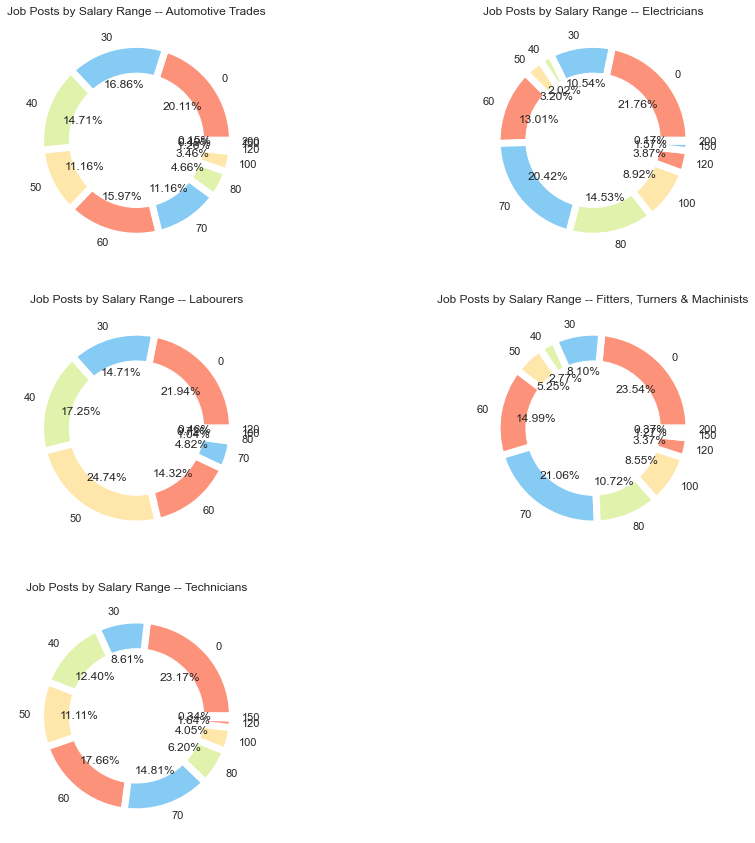

In [99]:
fig = plt.figure(figsize=(15,15))

ax1 = plt.subplot2grid((3,2),(0,0))
#----------------------------------

Automotive_Trades = tsTop[tsTop['SubClassification']=="Automotive Trades"]
Automotive_Trades_bySalary = Automotive_Trades.groupby('LowestSalary')
Automotive_Trades_bySalary_stats = Automotive_Trades_bySalary.count()
Automotive_Trades_bySalary_stats['Count'] = Automotive_Trades_bySalary_stats['Id']
Automotive_Trades_bySalary_stats['Count']

# create data
names = Automotive_Trades_bySalary_stats.index
size = Automotive_Trades_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range -- Automotive Trades')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (0, 1))
#----------------------------------

Automotive_Trades = tsTop[tsTop['SubClassification']=="Electricians"]
Automotive_Trades_bySalary = Automotive_Trades.groupby('LowestSalary')
Automotive_Trades_bySalary_stats = Automotive_Trades_bySalary.count()
Automotive_Trades_bySalary_stats['Count'] = Automotive_Trades_bySalary_stats['Id']
Automotive_Trades_bySalary_stats['Count']

# create data
names = Automotive_Trades_bySalary_stats.index
size = Automotive_Trades_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range -- Electricians')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 0))
#----------------------------------

Automotive_Trades = tsTop[tsTop['SubClassification']=="Labourers"]
Automotive_Trades_bySalary = Automotive_Trades.groupby('LowestSalary')
Automotive_Trades_bySalary_stats = Automotive_Trades_bySalary.count()
Automotive_Trades_bySalary_stats['Count'] = Automotive_Trades_bySalary_stats['Id']
Automotive_Trades_bySalary_stats['Count']

# create data
names = Automotive_Trades_bySalary_stats.index
size = Automotive_Trades_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range -- Labourers')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 1))
#----------------------------------

Automotive_Trades = tsTop[tsTop['SubClassification']=="Fitters, Turners & Machinists"]
Automotive_Trades_bySalary = Automotive_Trades.groupby('LowestSalary')
Automotive_Trades_bySalary_stats = Automotive_Trades_bySalary.count()
Automotive_Trades_bySalary_stats['Count'] = Automotive_Trades_bySalary_stats['Id']
Automotive_Trades_bySalary_stats['Count']

# create data
names = Automotive_Trades_bySalary_stats.index
size = Automotive_Trades_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range -- Fitters, Turners & Machinists')


# #----------------------------------
ax1 = plt.subplot2grid((3,2),(2,0))
# #----------------------------------

Automotive_Trades = tsTop[tsTop['SubClassification']=="Technicians"]
Automotive_Trades_bySalary = Automotive_Trades.groupby('LowestSalary')
Automotive_Trades_bySalary_stats = Automotive_Trades_bySalary.count()
Automotive_Trades_bySalary_stats['Count'] = Automotive_Trades_bySalary_stats['Id']
Automotive_Trades_bySalary_stats['Count']

# create data
names = Automotive_Trades_bySalary_stats.index
size = Automotive_Trades_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range -- Technicians')


# #----------------------------------

In [100]:
# Hospitality & Tourism 
htTop
ht_top_5

['Chefs/Cooks',
 'Waiting Staff',
 'Bar & Beverage Staff',
 'Management',
 'Kitchen & Sandwich Hands']

In [101]:
ictTop_bySalary = htTop.groupby('LowestSalary')
ictTop_bySalary_stats = ictTop_bySalary.count()
ictTop_bySalary_stats['Count'] = ictTop_bySalary_stats['Id']
ictTop_bySalary_stats['Count']

LowestSalary
0      3051
30     5798
40     2220
50     1270
60      935
70      597
80      446
100     692
120     865
150    1034
200     561
Name: Count, dtype: int64

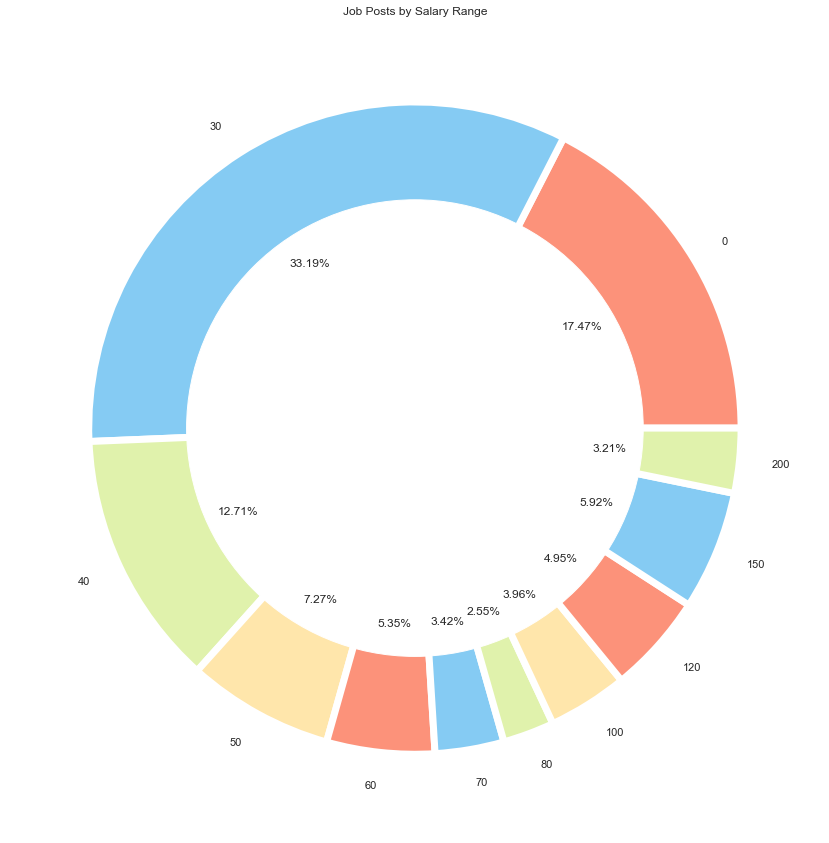

In [102]:
#salary ranges plot



# create data
names = ictTop_bySalary_stats.index
size = ictTop_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

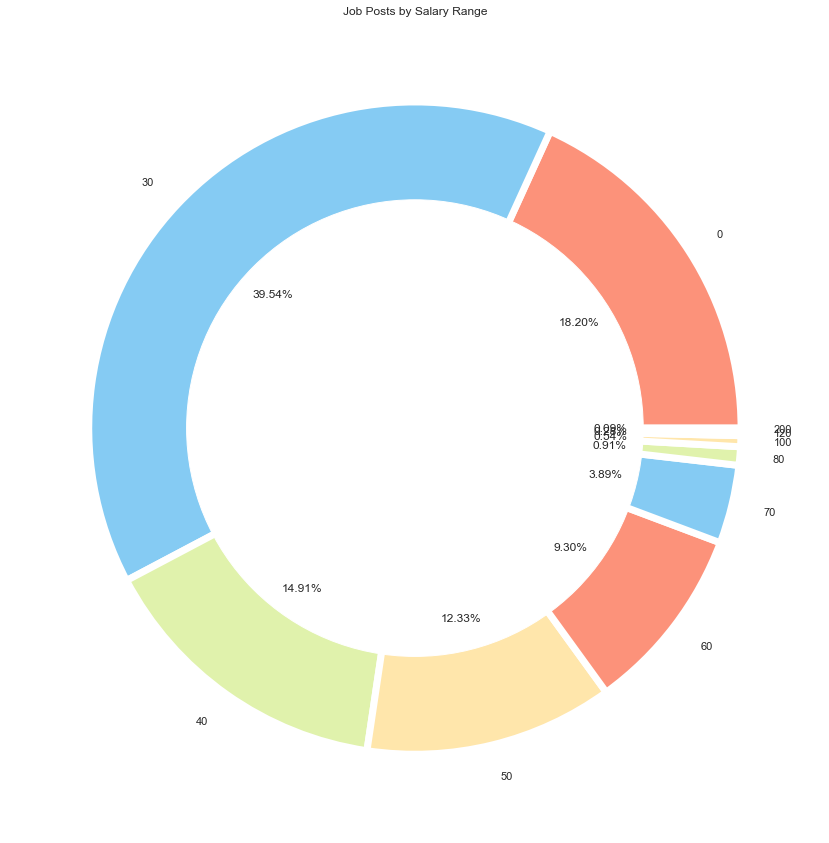

In [103]:
# 'Chefs/Cooks',


Developers_Programmers = htTop[htTop['SubClassification']==ht_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

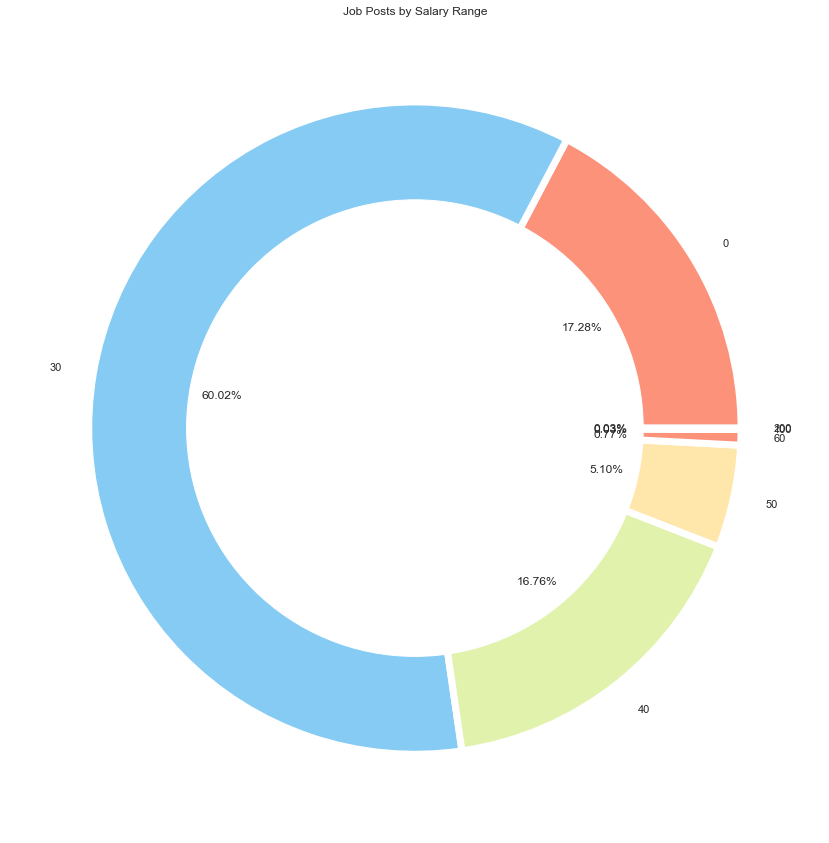

In [104]:
#  'Waiting Staff',

Developers_Programmers = htTop[htTop['SubClassification']==ht_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

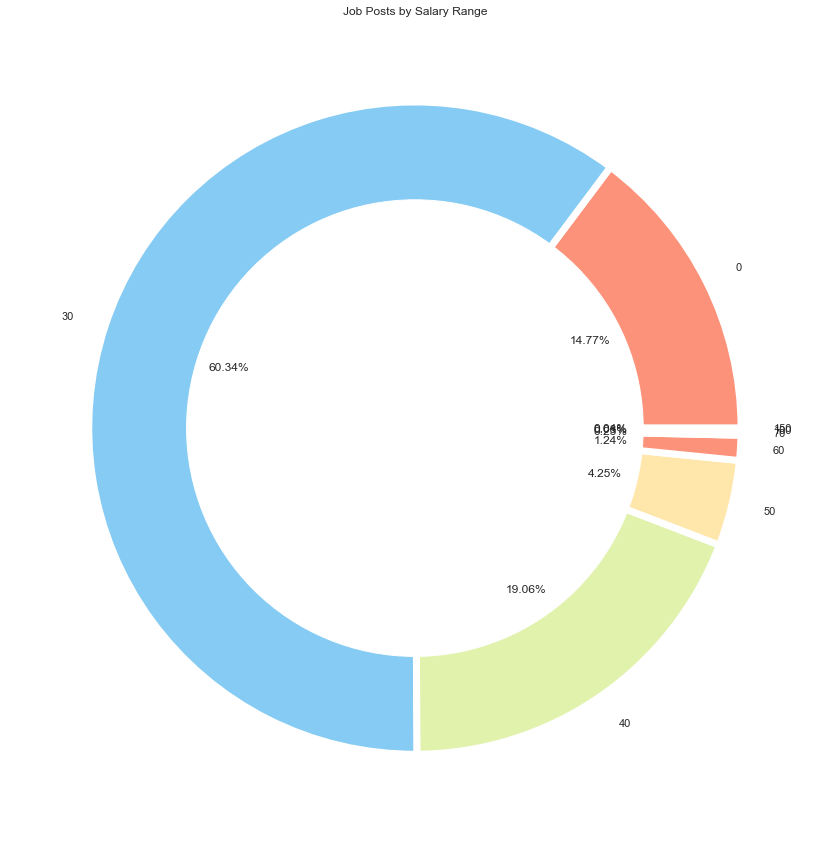

In [105]:
#  'Bar & Beverage Staff',


Developers_Programmers = htTop[htTop['SubClassification']==ht_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

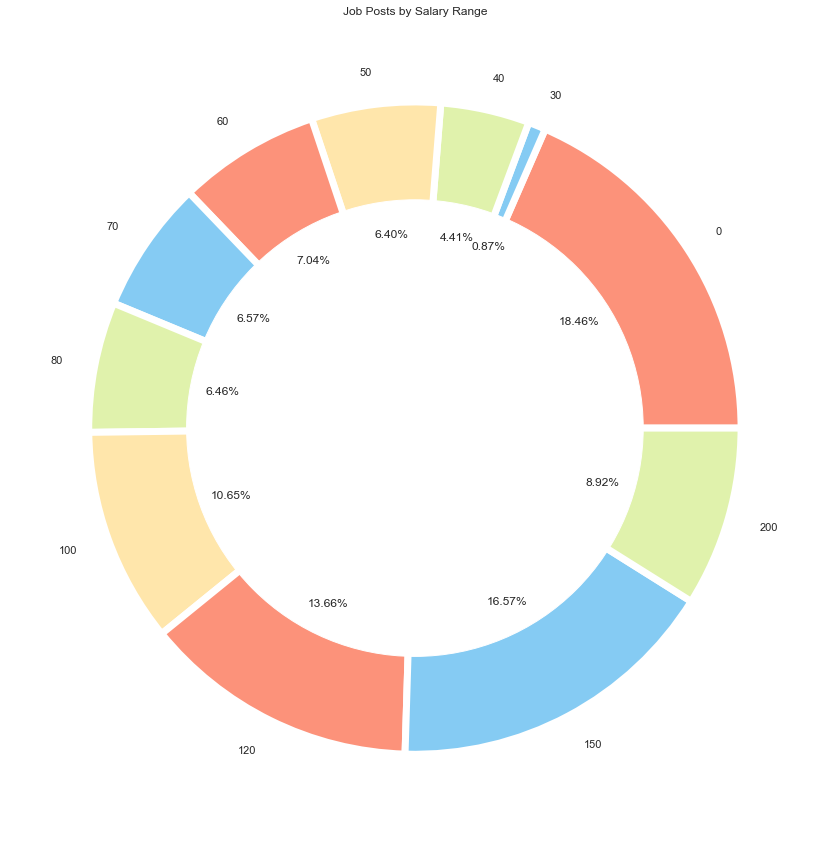

In [106]:
#  'Management',


Developers_Programmers = htTop[htTop['SubClassification']==ht_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

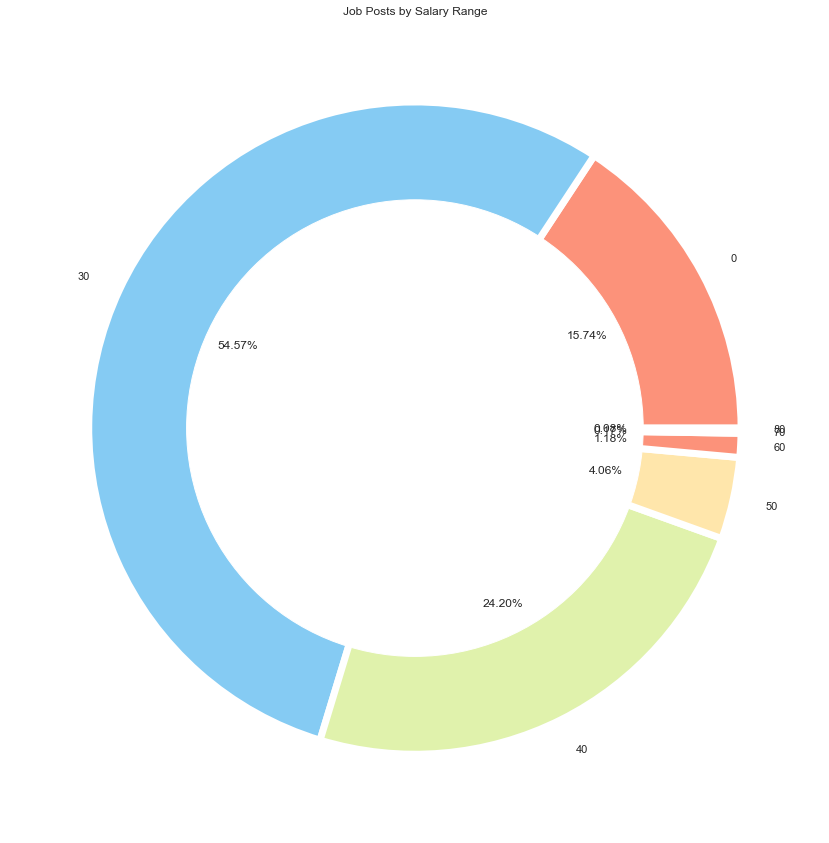

In [107]:
#  'Kitchen & Sandwich Hands'

Developers_Programmers = htTop[htTop['SubClassification']==ht_top_5[4]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

Text(0.5, 1.0, 'Salary Range for Kitchen & Sandwich Hands')

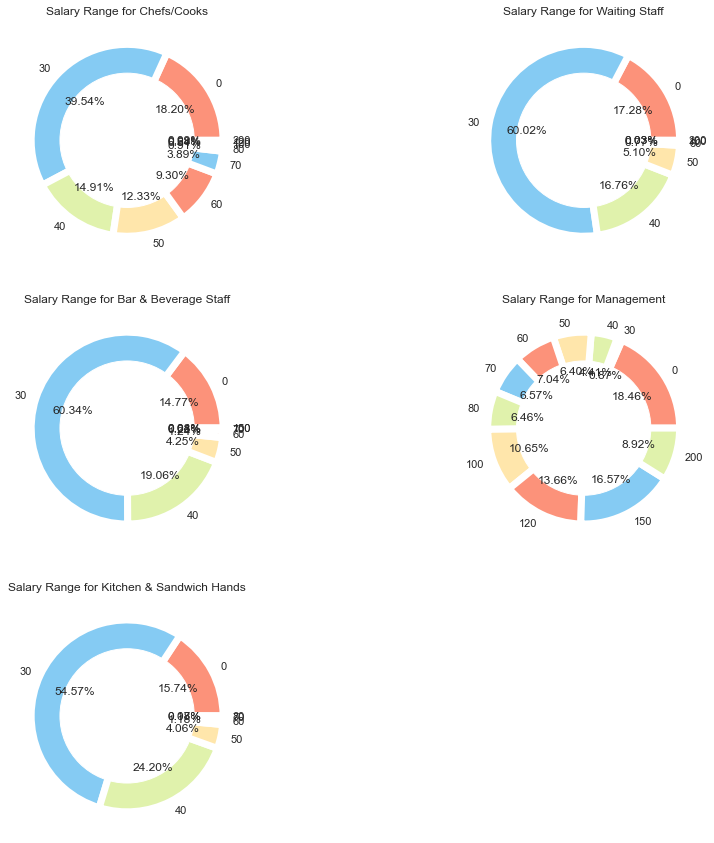

In [108]:
fig = plt.figure(figsize=(15,15))

ax1 = plt.subplot2grid((3,2),(0,0))
#----------------------------------

# 'Chefs/Cooks',


Developers_Programmers = htTop[htTop['SubClassification']==ht_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Chefs/Cooks')



#----------------------------------
ax1 = plt.subplot2grid((3,2), (0, 1))
#----------------------------------

#  'Waiting Staff',

Developers_Programmers = htTop[htTop['SubClassification']==ht_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Waiting Staff')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 0))
#----------------------------------

#  'Bar & Beverage Staff',


Developers_Programmers = htTop[htTop['SubClassification']==ht_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Bar & Beverage Staff')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 1))
#----------------------------------

#  'Management',


Developers_Programmers = htTop[htTop['SubClassification']==ht_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Management')


# #----------------------------------
ax1 = plt.subplot2grid((3,2),(2,0))
# #----------------------------------

#  'Kitchen & Sandwich Hands'

Developers_Programmers = htTop[htTop['SubClassification']==ht_top_5[4]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Kitchen & Sandwich Hands')


# #----------------------------------

In [109]:
#Manufacturing, Transport & Logistics 
mttTop
mtt_top_5

['Warehousing, Storage & Distribution',
 'Road Transport',
 'Assembly & Process Work',
 'Machine Operators',
 'Purchasing, Procurement & Inventory']

In [110]:
ictTop_bySalary = mttTop.groupby('LowestSalary')
ictTop_bySalary_stats = ictTop_bySalary.count()
ictTop_bySalary_stats['Count'] = ictTop_bySalary_stats['Id']
ictTop_bySalary_stats['Count']

LowestSalary
0      1711
30      574
40     2037
50     1554
60      996
70      461
80      183
100     164
120     150
150     106
200      36
Name: Count, dtype: int64

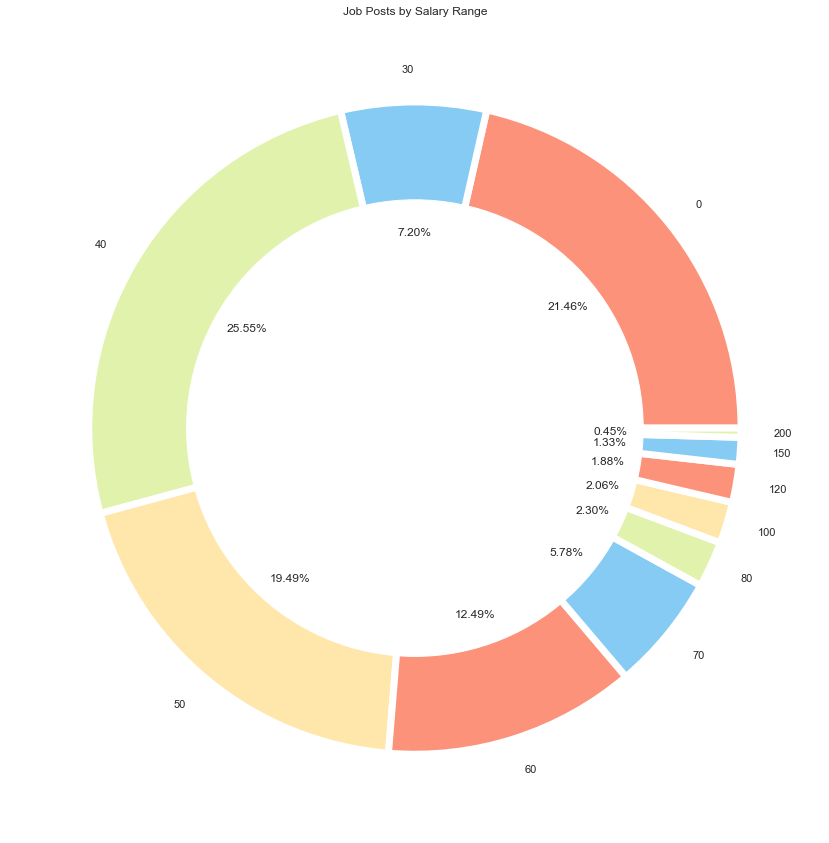

In [111]:
#salary ranges plot



# create data
names = ictTop_bySalary_stats.index
size = ictTop_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

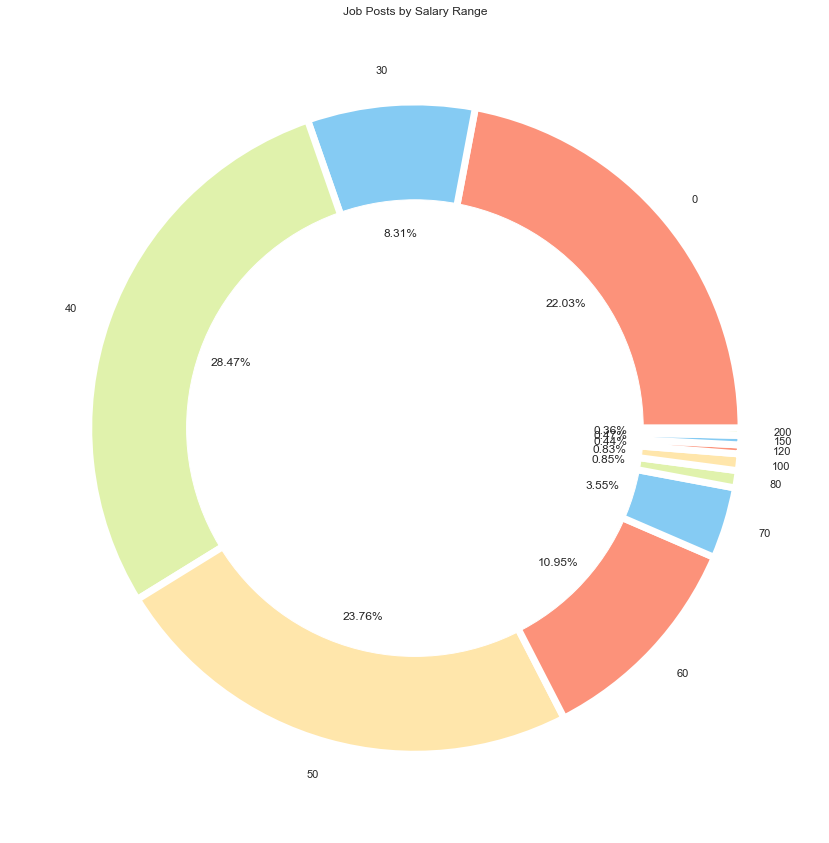

In [112]:
# 'Warehousing, Storage & Distribution',


Developers_Programmers = mttTop[mttTop['SubClassification']==mtt_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

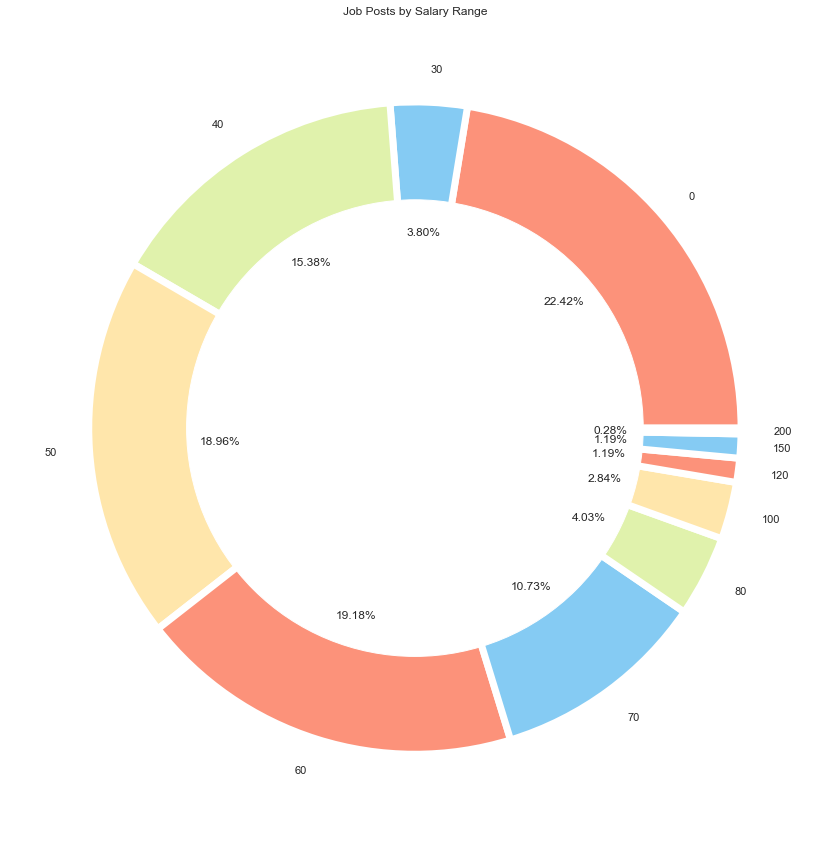

In [113]:
#  'Road Transport',

Developers_Programmers = mttTop[mttTop['SubClassification']==mtt_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

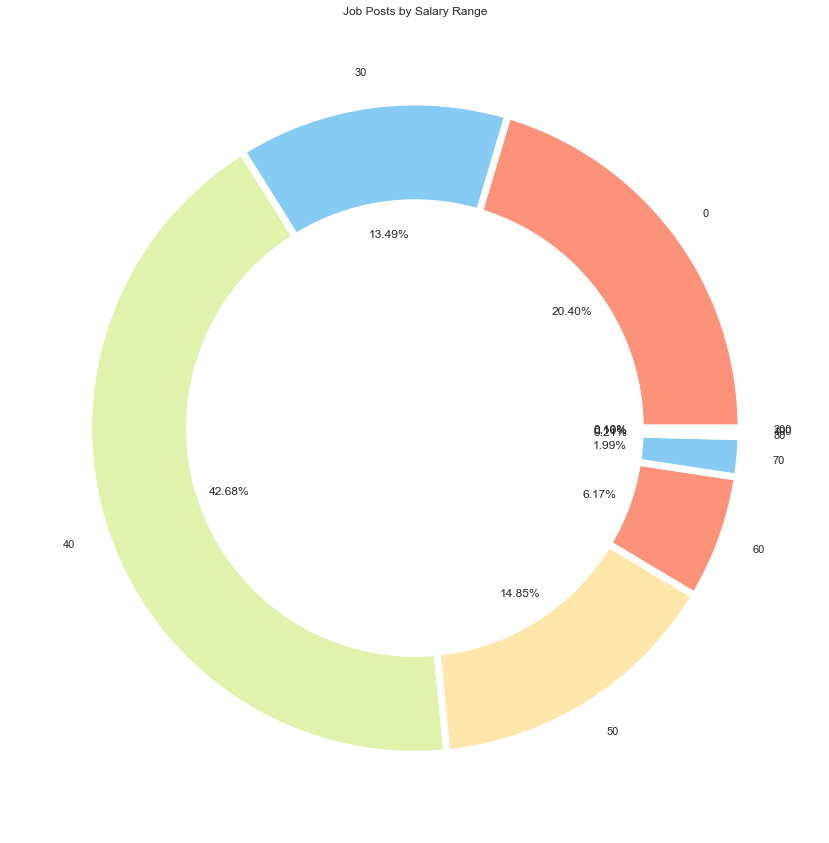

In [114]:
#  'Assembly & Process Work'

Developers_Programmers = mttTop[mttTop['SubClassification']==mtt_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

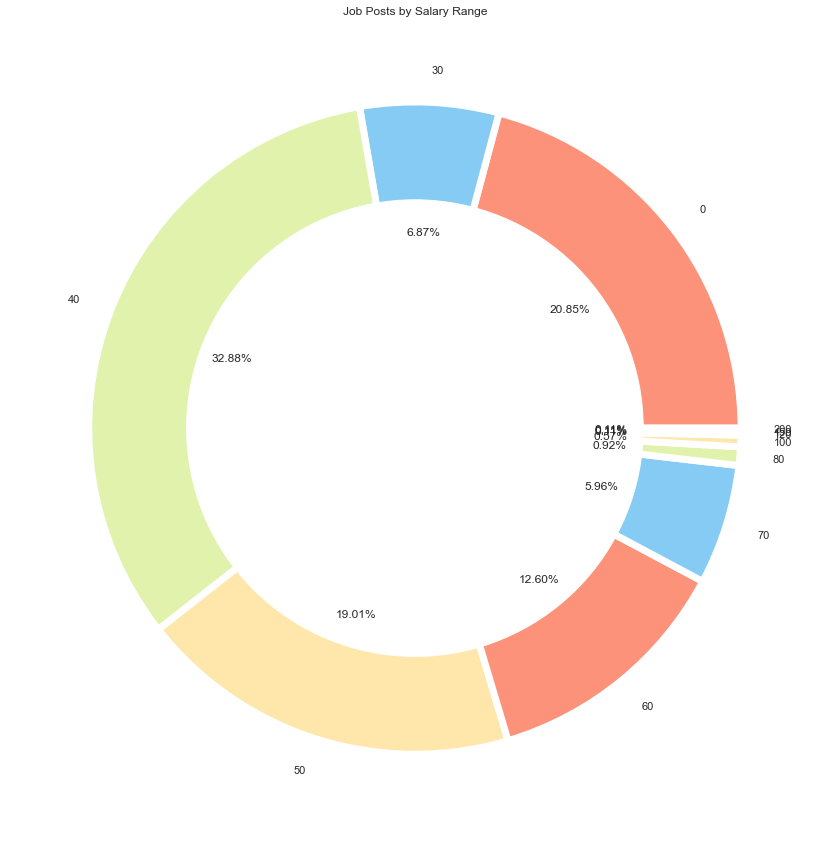

In [115]:
#  'Machine Operators'

Developers_Programmers = mttTop[mttTop['SubClassification']==mtt_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

Text(0.5, 1.0, 'Salary Range for Purchasing, Procurement & Inventory')

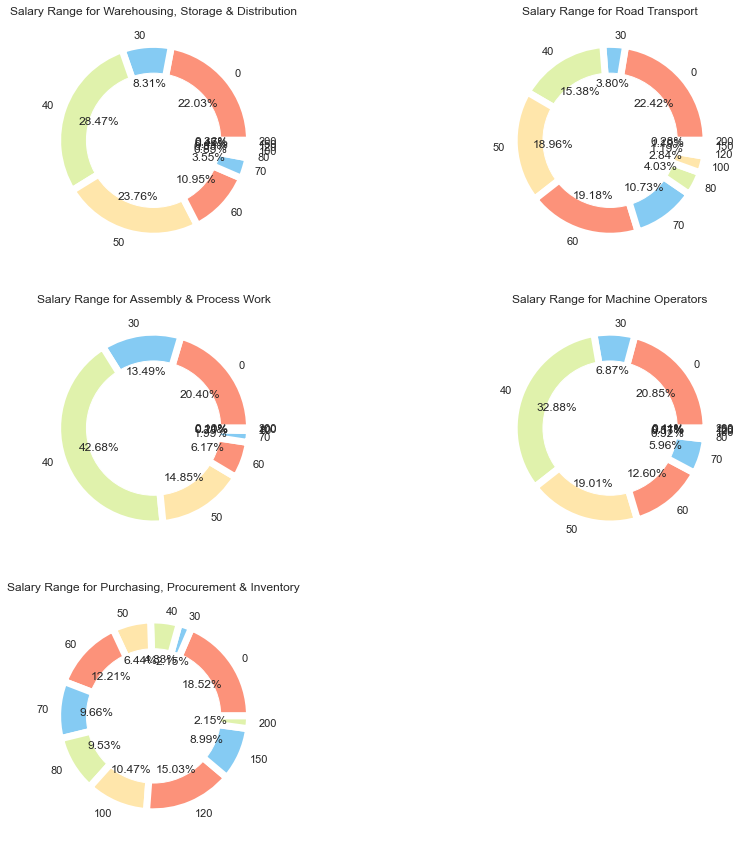

In [116]:
fig = plt.figure(figsize=(15,15))

ax1 = plt.subplot2grid((3,2),(0,0))
#----------------------------------

# 'Warehousing, Storage & Distribution',


Developers_Programmers = mttTop[mttTop['SubClassification']==mtt_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Warehousing, Storage & Distribution')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (0, 1))
#----------------------------------

# 'Road Transport',


Developers_Programmers = mttTop[mttTop['SubClassification']==mtt_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Road Transport')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 0))
#----------------------------------

# 'Assembly & Process Work',

    
Developers_Programmers = mttTop[mttTop['SubClassification']==mtt_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Assembly & Process Work')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 1))
#----------------------------------

# 'Machine Operators',

    
Developers_Programmers = mttTop[mttTop['SubClassification']==mtt_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Machine Operators')
# Show the graph


# #----------------------------------
ax1 = plt.subplot2grid((3,2),(2,0))
# #----------------------------------

 #'Purchasing, Procurement & Inventory'
    
Developers_Programmers = mttTop[mttTop['SubClassification']==mtt_top_5[4]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Purchasing, Procurement & Inventory')


# #----------------------------------

In [117]:
#Administration & Office Support  
baTop
ba_top_5

['Administrative Assistants',
 'Receptionists',
 'PA, EA & Secretarial',
 'Client & Sales Administration',
 'Office Management']

In [118]:
ictTop_bySalary = baTop.groupby('LowestSalary')
ictTop_bySalary_stats = ictTop_bySalary.count()
ictTop_bySalary_stats['Count'] = ictTop_bySalary_stats['Id']
ictTop_bySalary_stats['Count']

LowestSalary
0      2044
30     1059
40     1925
50     1359
60     1027
70      805
80      313
100     127
120      30
150      11
200      12
Name: Count, dtype: int64

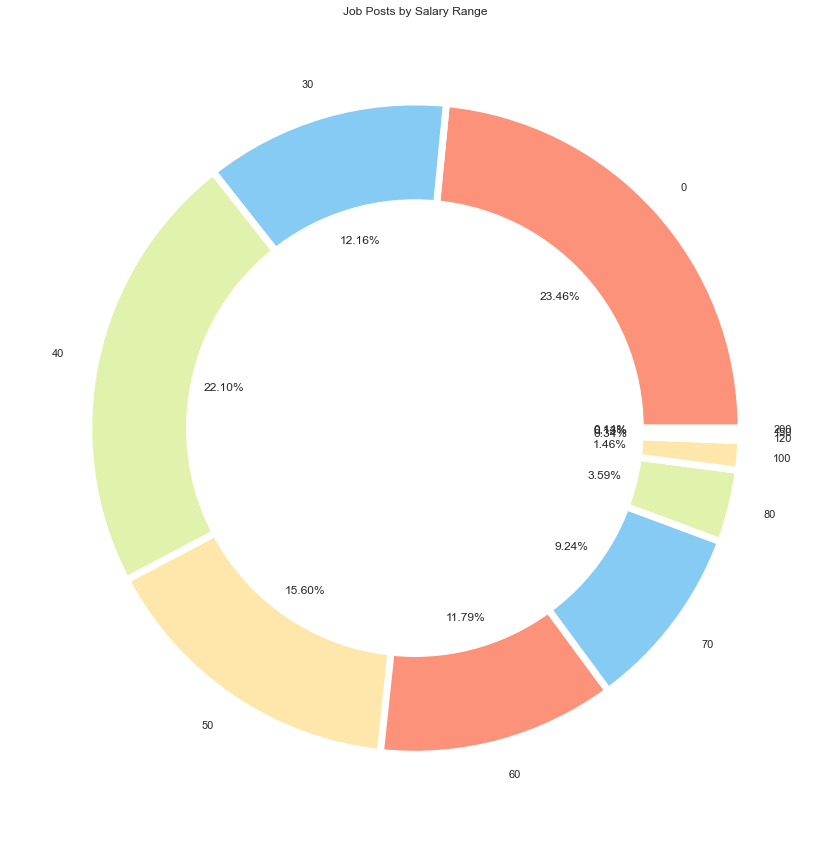

In [119]:
#salary ranges plot



# create data
names = ictTop_bySalary_stats.index
size = ictTop_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

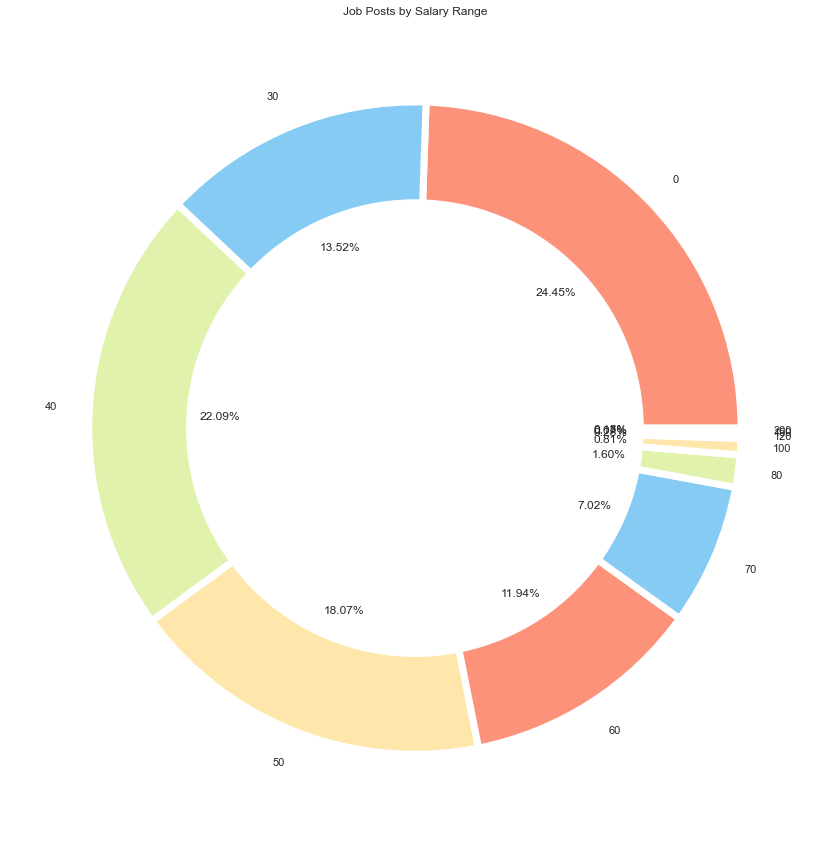

In [120]:
#'Administrative Assistants',


Developers_Programmers = baTop[baTop['SubClassification']==ba_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

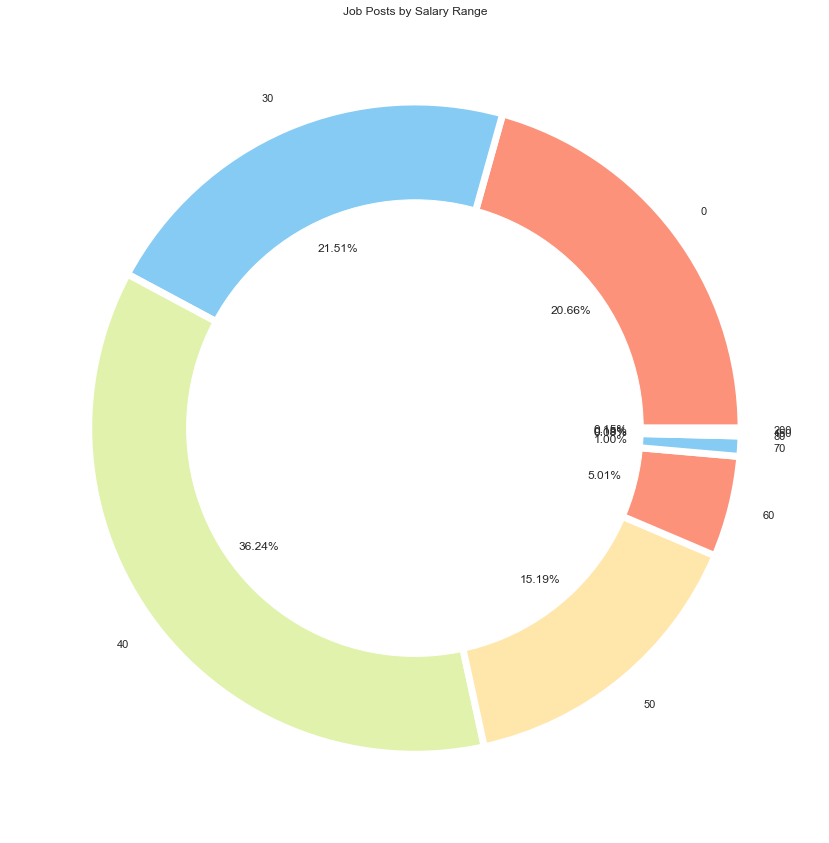

In [121]:
# 'Receptionists',


Developers_Programmers = baTop[baTop['SubClassification']==ba_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

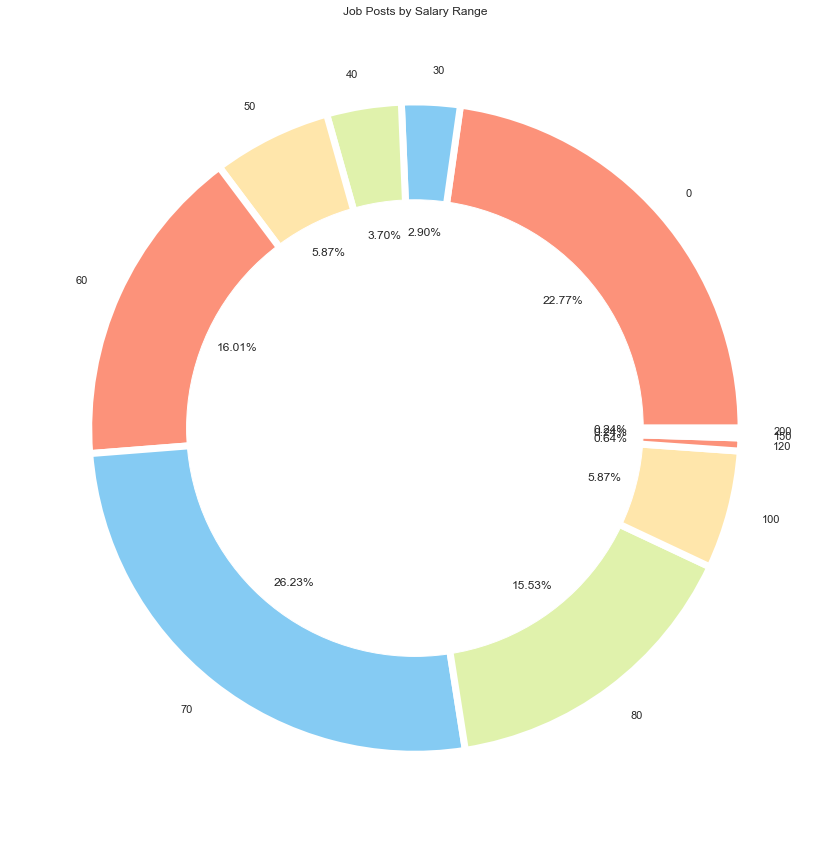

In [122]:
# 'PA, EA & Secretarial',


Developers_Programmers = baTop[baTop['SubClassification']==ba_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

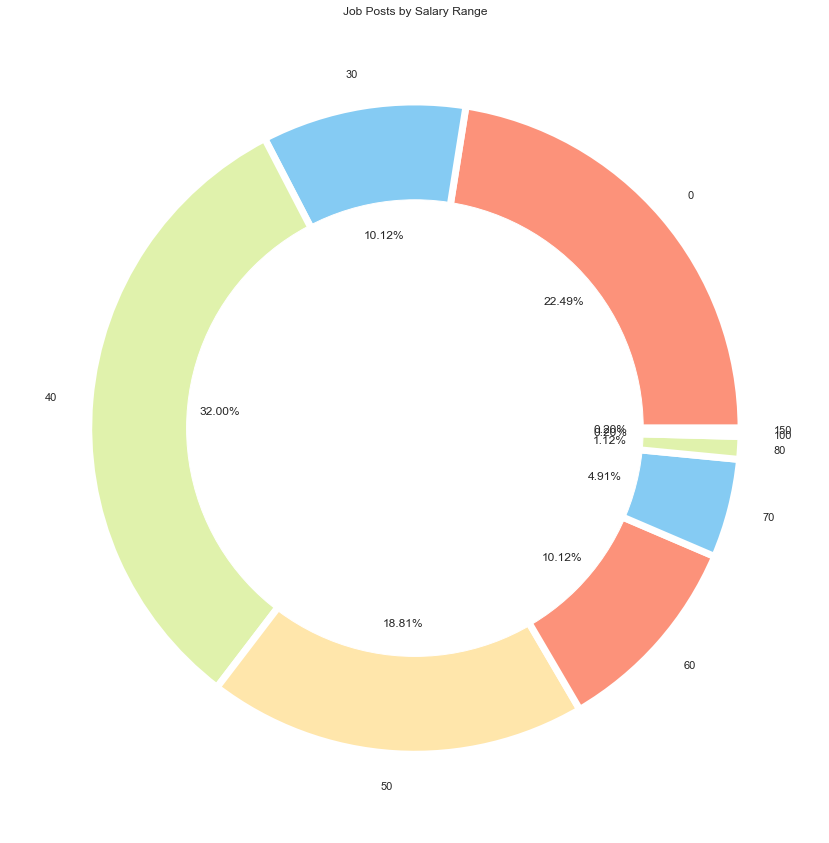

In [123]:
# 'Client & Sales Administration',


Developers_Programmers = baTop[baTop['SubClassification']==ba_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

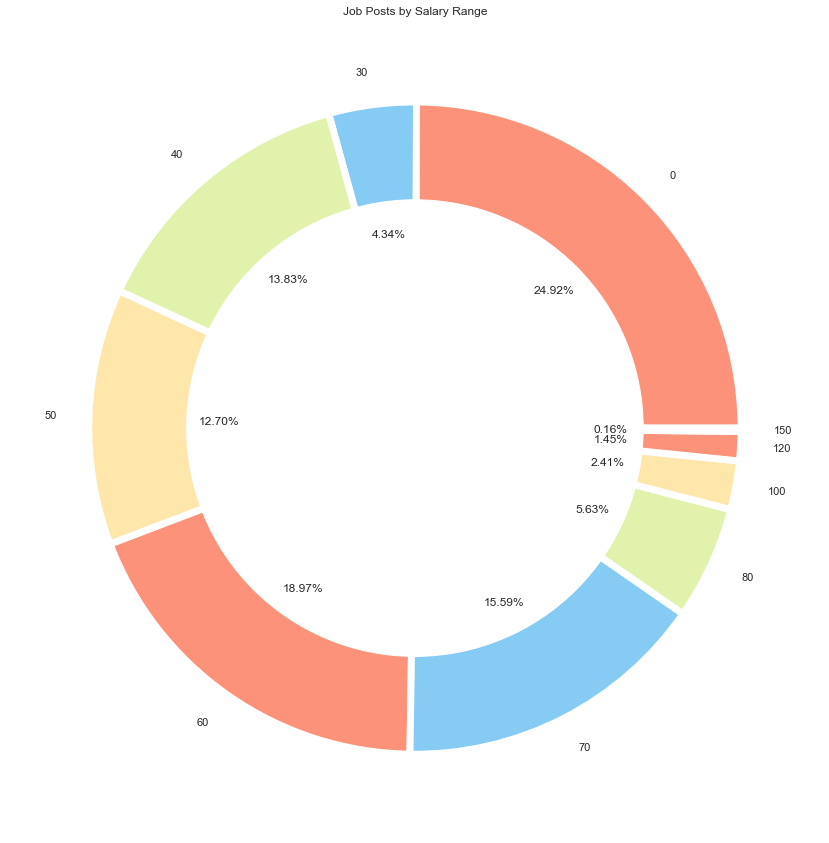

In [124]:
 # 'Office Management'

Developers_Programmers = baTop[baTop['SubClassification']==ba_top_5[4]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

Text(0.5, 1.0, 'Salary Range for Office Management')

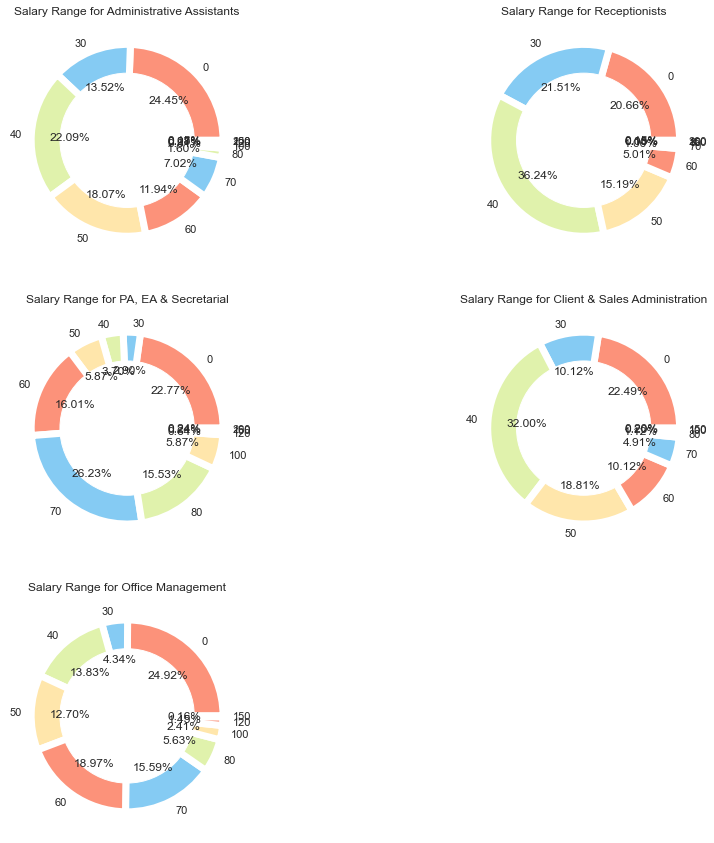

In [125]:
fig = plt.figure(figsize=(15,15))

ax1 = plt.subplot2grid((3,2),(0,0))
#----------------------------------

# 'Administrative Assistants'


Developers_Programmers = baTop[baTop['SubClassification']==ba_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Administrative Assistants')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (0, 1))
#----------------------------------

# 'Receptionists',


Developers_Programmers = baTop[baTop['SubClassification']==ba_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Receptionists')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 0))
#----------------------------------

# 'PA, EA & Secretarial',

    
Developers_Programmers = baTop[baTop['SubClassification']==ba_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for PA, EA & Secretarial')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 1))
#----------------------------------

# 'Client & Sales Administration',

    
Developers_Programmers = baTop[baTop['SubClassification']==ba_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Client & Sales Administration')
# Show the graph


# #----------------------------------
ax1 = plt.subplot2grid((3,2),(2,0))
# #----------------------------------

 #'Office Management'
    
Developers_Programmers = baTop[baTop['SubClassification']==ba_top_5[4]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Office Management')


# #----------------------------------

In [126]:
#Accounting 
accTop
acc_top_5

['Financial Accounting & Reporting',
 'Business Services & Corporate Advisory',
 'Accounts Officers/Clerks',
 'Financial Managers & Controllers',
 'Payroll']

In [127]:
ictTop_bySalary = accTop.groupby('LowestSalary')
ictTop_bySalary_stats = ictTop_bySalary.count()
ictTop_bySalary_stats['Count'] = ictTop_bySalary_stats['Id']
ictTop_bySalary_stats['Count']

LowestSalary
0      981
30      97
40     259
50     384
60     572
70     683
80     395
100    533
120    425
150    336
200    133
Name: Count, dtype: int64

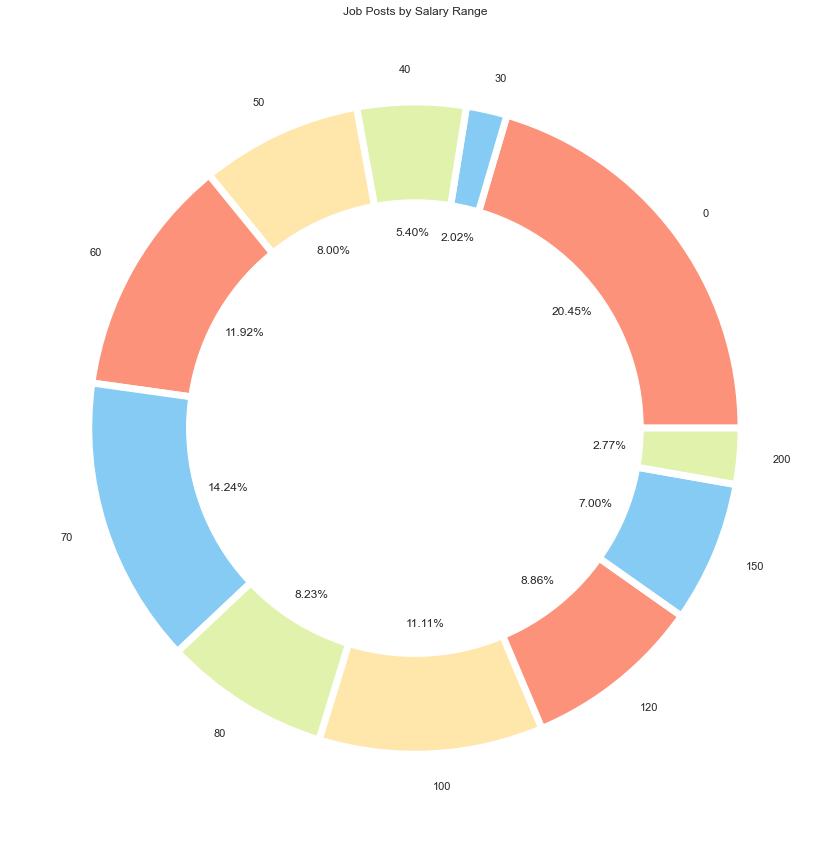

In [128]:
#salary ranges plot



# create data
names = ictTop_bySalary_stats.index
size = ictTop_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

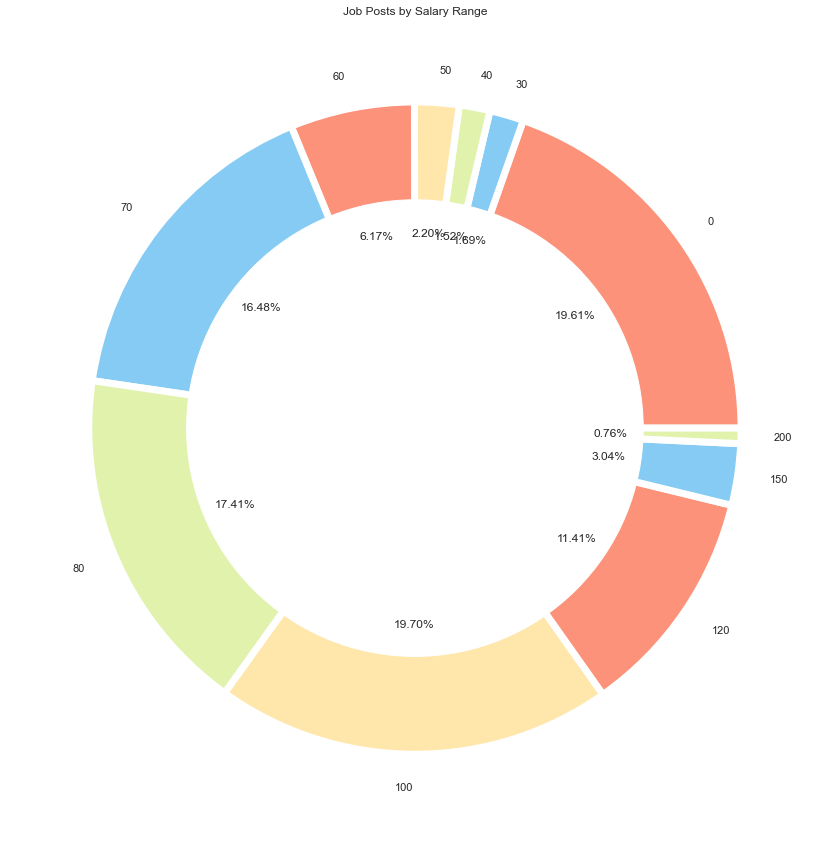

In [129]:
#  'Financial Accounting & Reporting',


Developers_Programmers = accTop[accTop['SubClassification']==acc_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

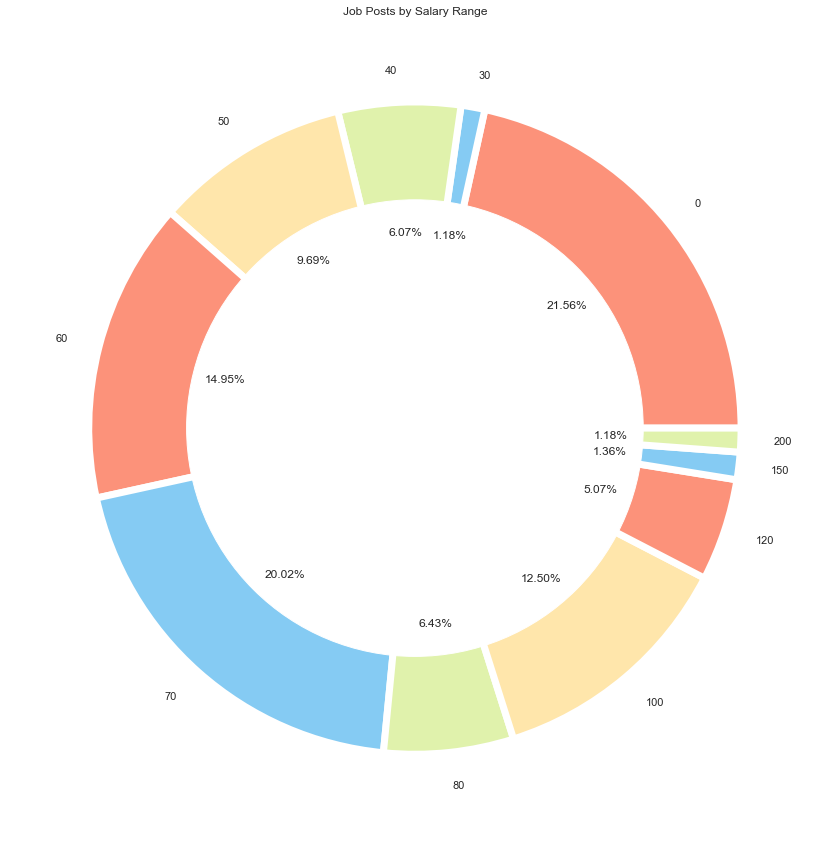

In [130]:
#  'Business Services & Corporate Advisory',


Developers_Programmers = accTop[accTop['SubClassification']==acc_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

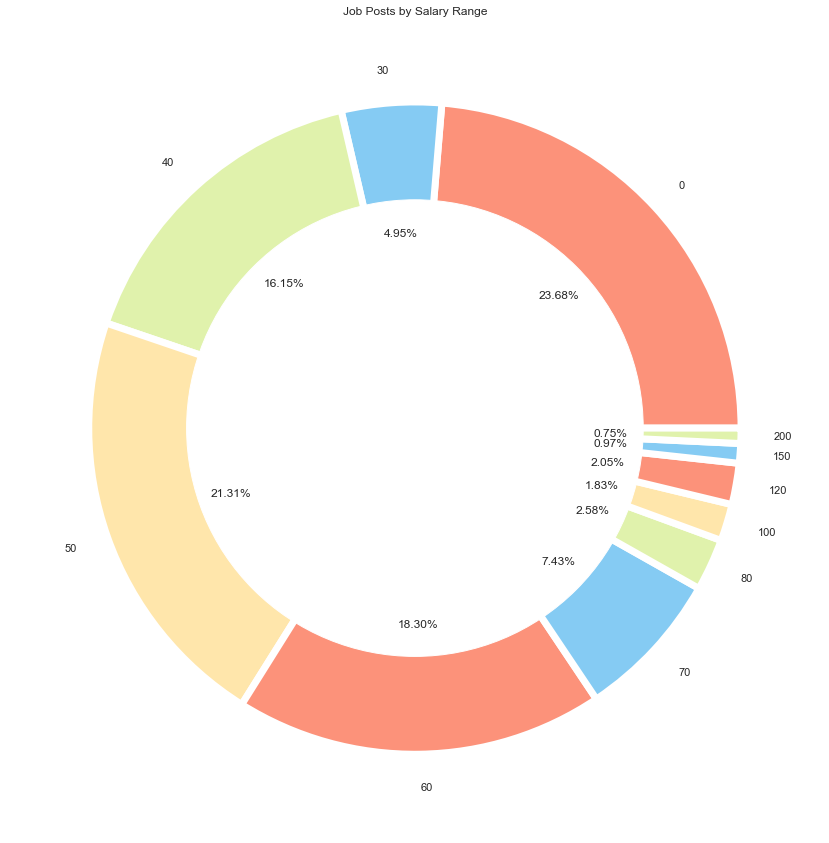

In [131]:
#  'Accounts Officers/Clerks',

Developers_Programmers = accTop[accTop['SubClassification']==acc_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

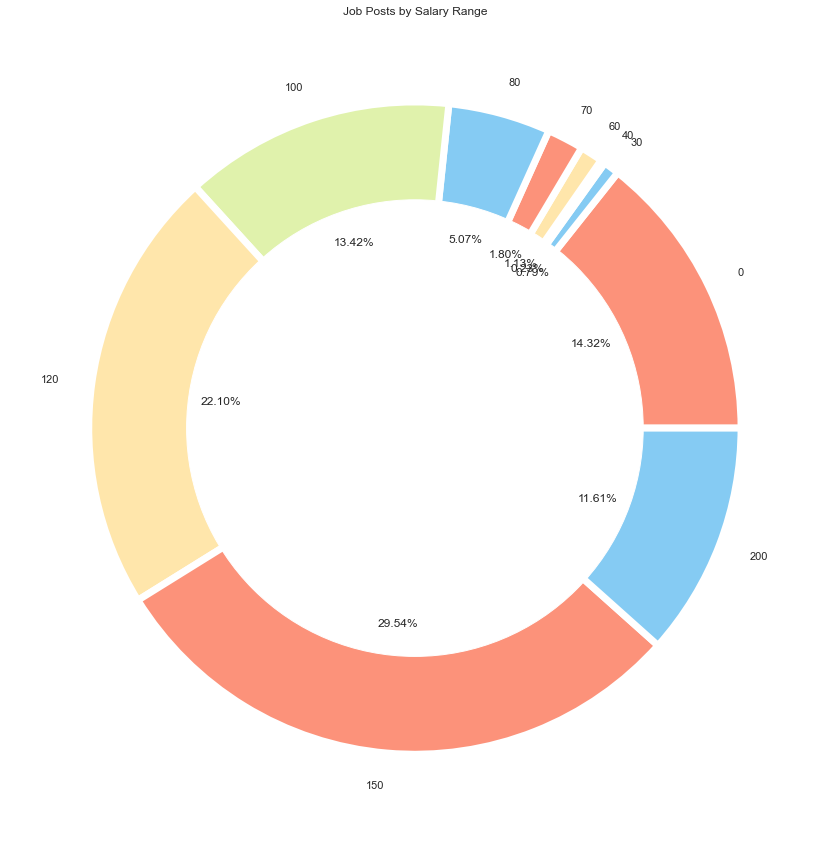

In [132]:
#  'Financial Managers & Controllers',

Developers_Programmers = accTop[accTop['SubClassification']==acc_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

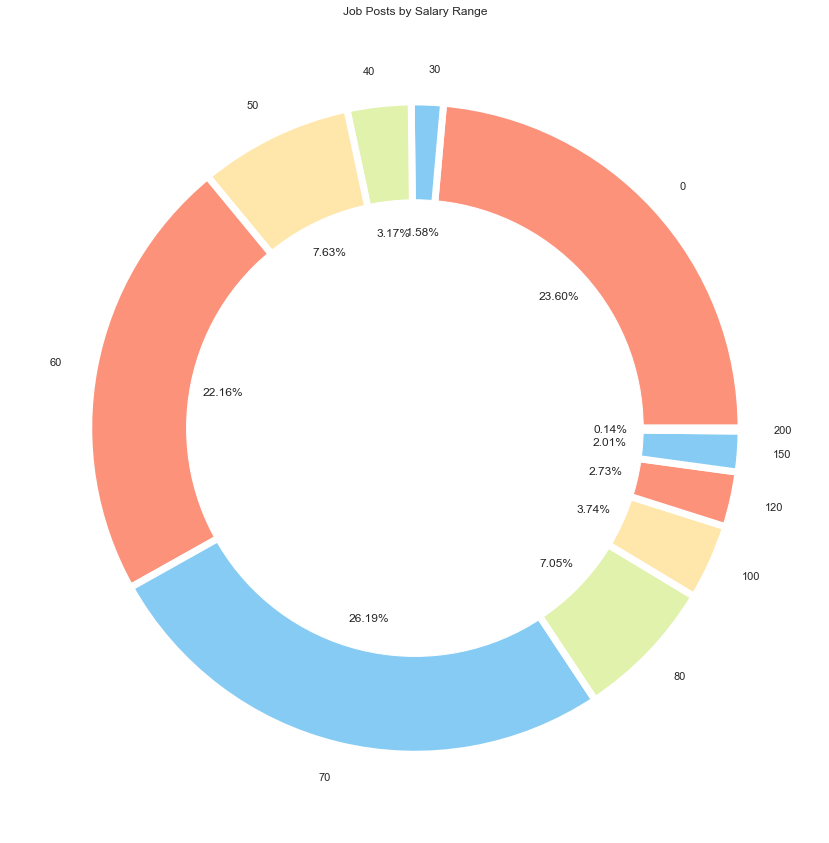

In [133]:
#  'Payroll'

Developers_Programmers = accTop[accTop['SubClassification']==acc_top_5[4]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

Text(0.5, 1.0, 'Salary Range for Payroll')

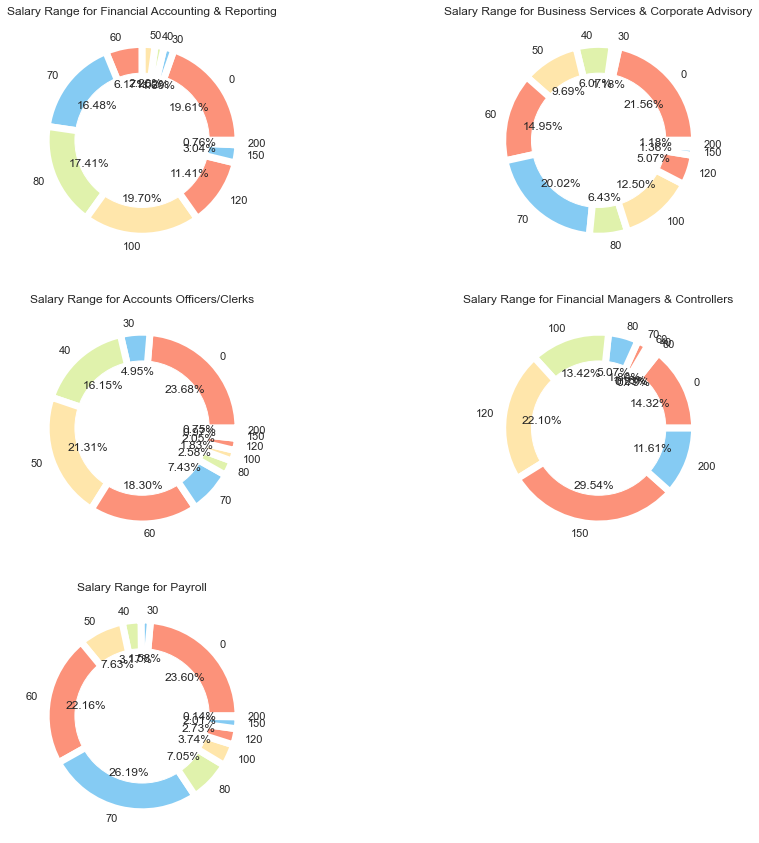

In [134]:
fig = plt.figure(figsize=(15,15))

ax1 = plt.subplot2grid((3,2),(0,0))
#----------------------------------

# 'Financial Accounting & Reporting',


Developers_Programmers = accTop[accTop['SubClassification']==acc_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Financial Accounting & Reporting')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (0, 1))
#----------------------------------

# 'Business Services & Corporate Advisory',


Developers_Programmers = accTop[accTop['SubClassification']==acc_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Business Services & Corporate Advisory')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 0))
#----------------------------------

# 'Accounts Officers/Clerks',

    
Developers_Programmers = accTop[accTop['SubClassification']==acc_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Accounts Officers/Clerks')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 1))
#----------------------------------

# 'Financial Managers & Controllers',

    
Developers_Programmers = accTop[accTop['SubClassification']==acc_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Financial Managers & Controllers')
# Show the graph


# #----------------------------------
ax1 = plt.subplot2grid((3,2),(2,0))
# #----------------------------------

 #'Payroll'
    
Developers_Programmers = accTop[accTop['SubClassification']==acc_top_5[4]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Payroll')


# #----------------------------------

In [135]:
#Education & Training  
eduTop
edu_top_5

['Childcare & Outside School Hours Care',
 'Other',
 'Teaching - Secondary',
 'Teaching - Early Childhood',
 'Teaching - Primary']

In [136]:
ictTop_bySalary = eduTop.groupby('LowestSalary')
ictTop_bySalary_stats = ictTop_bySalary.count()
ictTop_bySalary_stats['Count'] = ictTop_bySalary_stats['Id']
ictTop_bySalary_stats['Count']

LowestSalary
0      3188
30     1475
40     1928
50     1502
60     1783
70     1692
80     1182
100    1345
120     887
150     928
200     397
Name: Count, dtype: int64

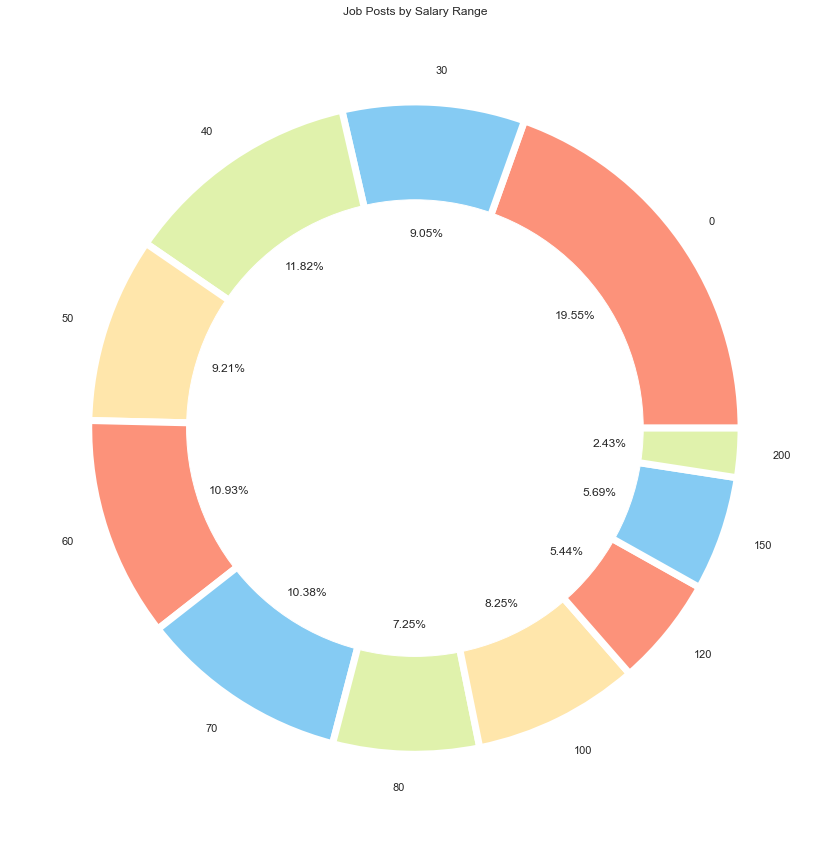

In [137]:
#salary ranges plot



# create data
names = ictTop_bySalary_stats.index
size = ictTop_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

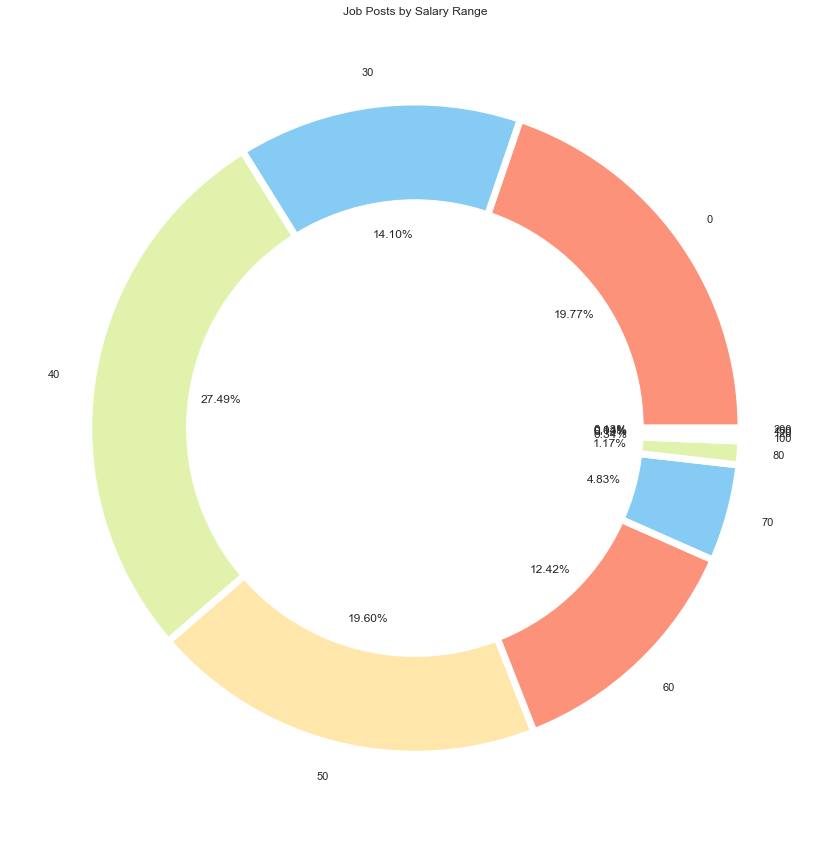

In [138]:
#  'Childcare & Outside School Hours Care',


Developers_Programmers = eduTop[eduTop['SubClassification']==edu_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

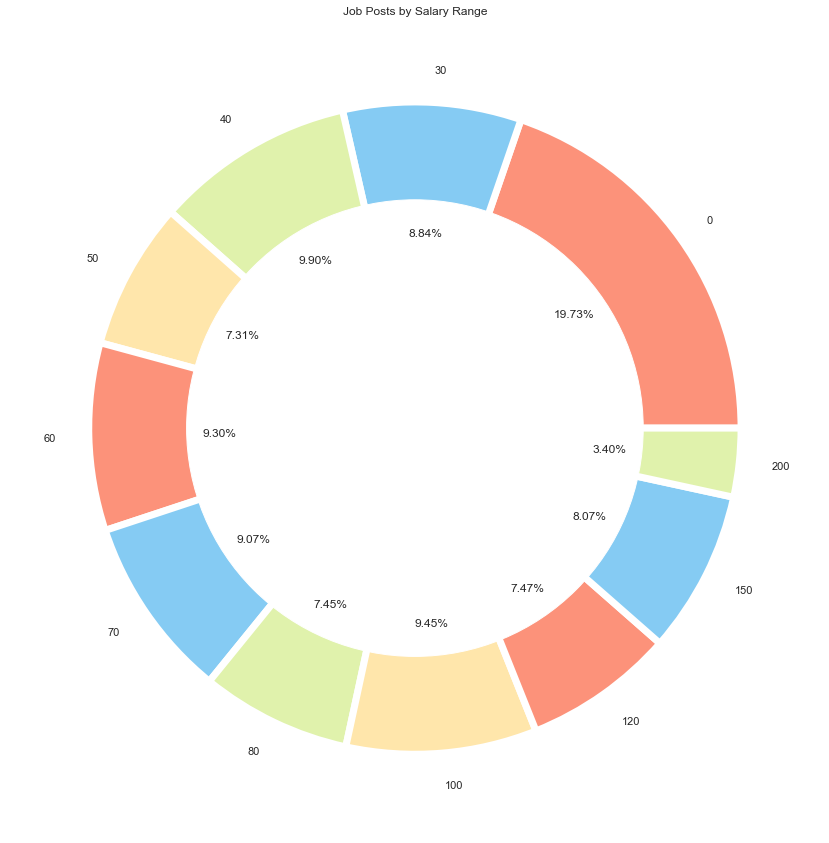

In [139]:
#  'Other'

Developers_Programmers = eduTop[eduTop['SubClassification']==edu_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

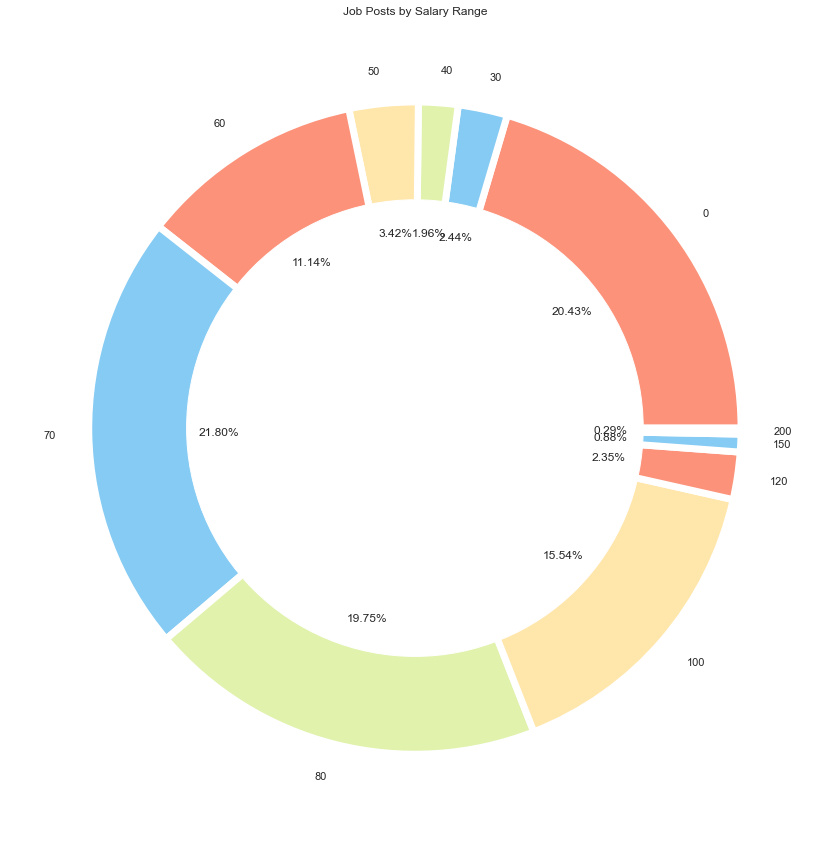

In [140]:
#  'Teaching - Secondary',


Developers_Programmers = eduTop[eduTop['SubClassification']==edu_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

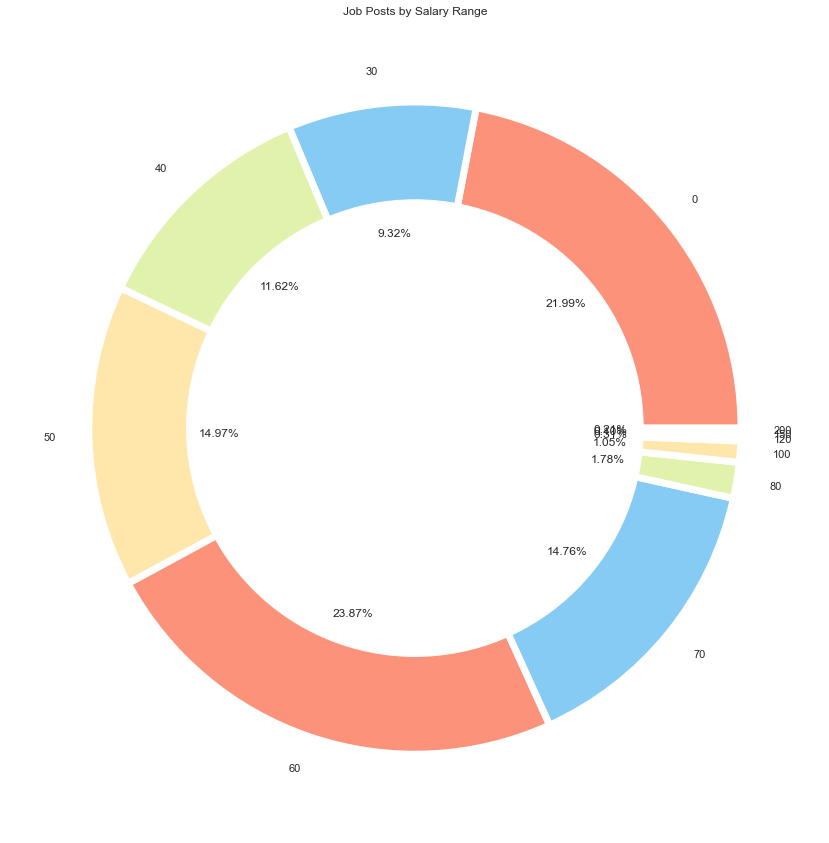

In [141]:
#  'Teaching - Early Childhood',


Developers_Programmers = eduTop[eduTop['SubClassification']==edu_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

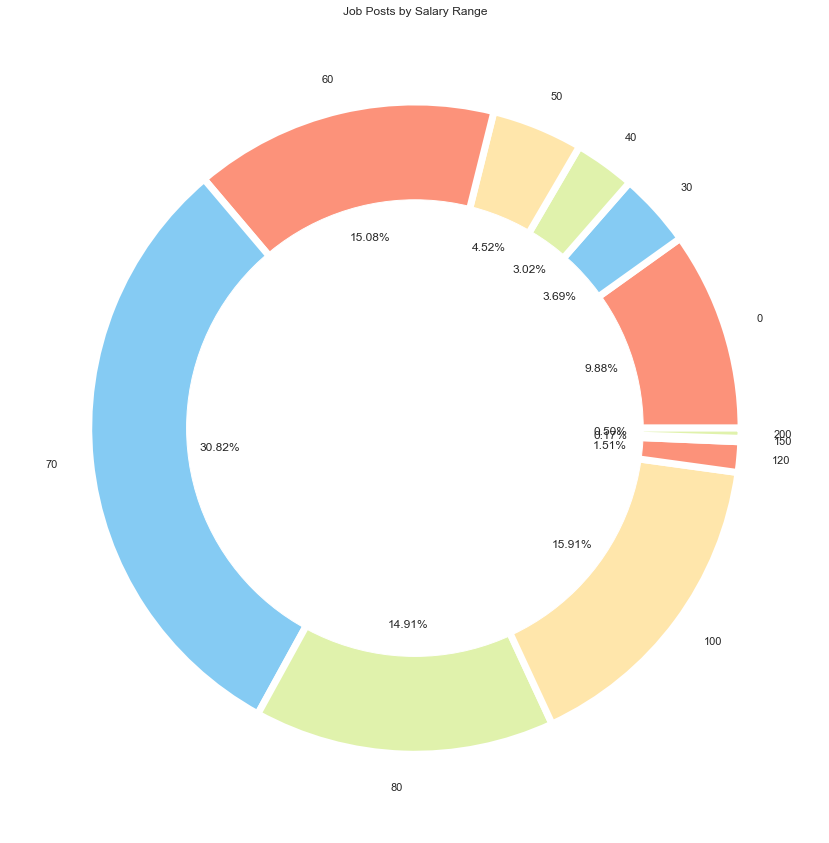

In [142]:
#  'Teaching - Primary'


Developers_Programmers = eduTop[eduTop['SubClassification']==edu_top_5[4]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

Text(0.5, 1.0, 'Salary Range for Teaching - Primary')

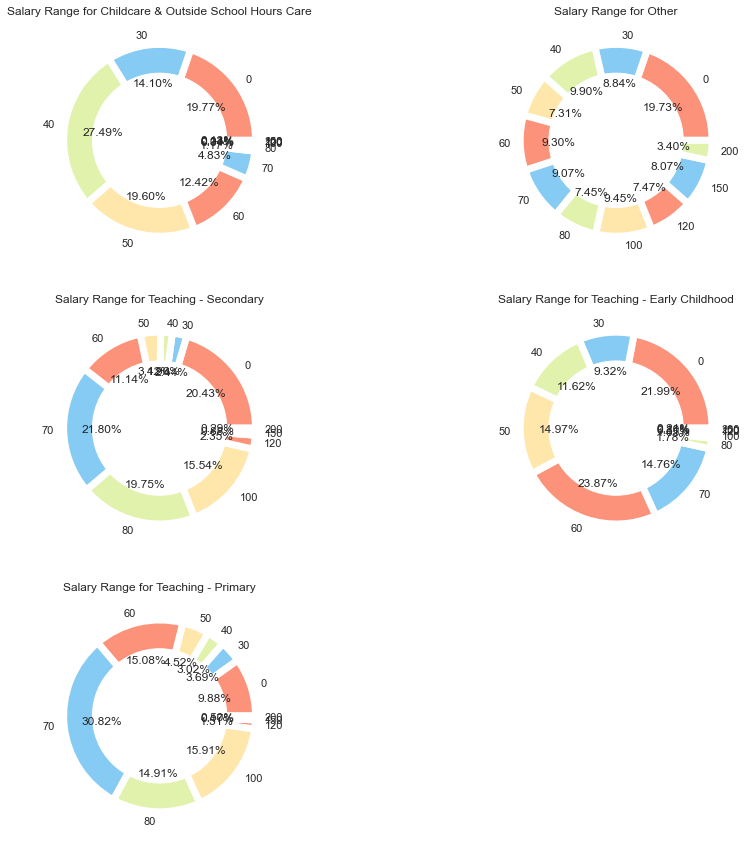

In [143]:
fig = plt.figure(figsize=(15,15))

ax1 = plt.subplot2grid((3,2),(0,0))
#----------------------------------

# 'Childcare & Outside School Hours Care',


Developers_Programmers = eduTop[eduTop['SubClassification']==edu_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Childcare & Outside School Hours Care')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (0, 1))
#----------------------------------

# 'Other',


Developers_Programmers = eduTop[eduTop['SubClassification']==edu_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Other')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 0))
#----------------------------------

# 'Teaching - Secondary',

    
Developers_Programmers = eduTop[eduTop['SubClassification']==edu_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Teaching - Secondary')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 1))
#----------------------------------

# 'Teaching - Early Childhood',

    
Developers_Programmers = eduTop[eduTop['SubClassification']==edu_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Teaching - Early Childhood')
# Show the graph


# #----------------------------------
ax1 = plt.subplot2grid((3,2),(2,0))
# #----------------------------------

 #'Teaching - Primary'
    
Developers_Programmers = eduTop[eduTop['SubClassification']==edu_top_5[4]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Teaching - Primary')


# #----------------------------------

In [144]:
#Construction 
conTop
con_top_5

['Project Management',
 'Foreperson/Supervisors',
 'Contracts Management',
 'Other',
 'Estimating']

In [145]:
ictTop_bySalary = htTop.groupby('LowestSalary')
ictTop_bySalary_stats = ictTop_bySalary.count()
ictTop_bySalary_stats['Count'] = ictTop_bySalary_stats['Id']
ictTop_bySalary_stats['Count']

LowestSalary
0      3051
30     5798
40     2220
50     1270
60      935
70      597
80      446
100     692
120     865
150    1034
200     561
Name: Count, dtype: int64

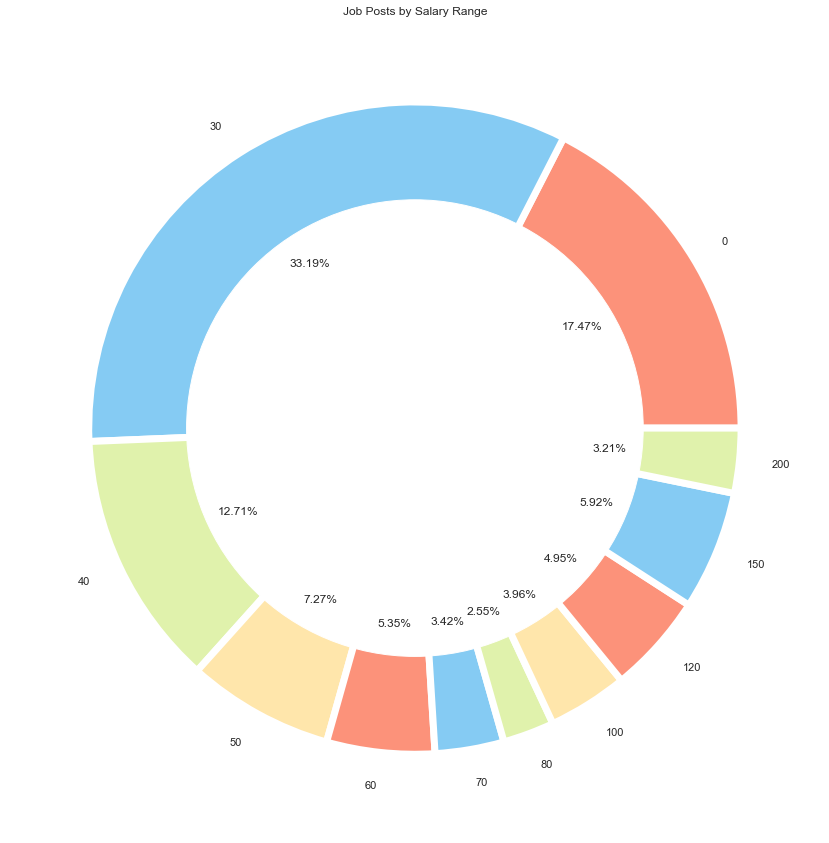

In [146]:
#salary ranges plot



# create data
names = ictTop_bySalary_stats.index
size = ictTop_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

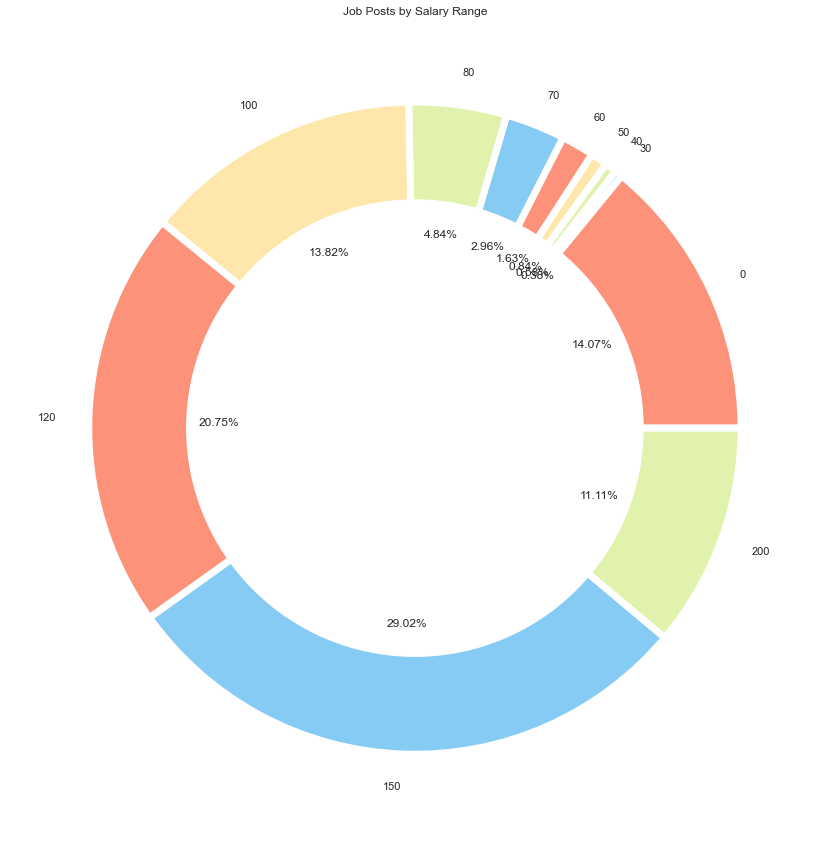

In [147]:
#  'Project Management',

Developers_Programmers = conTop[conTop['SubClassification']==con_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

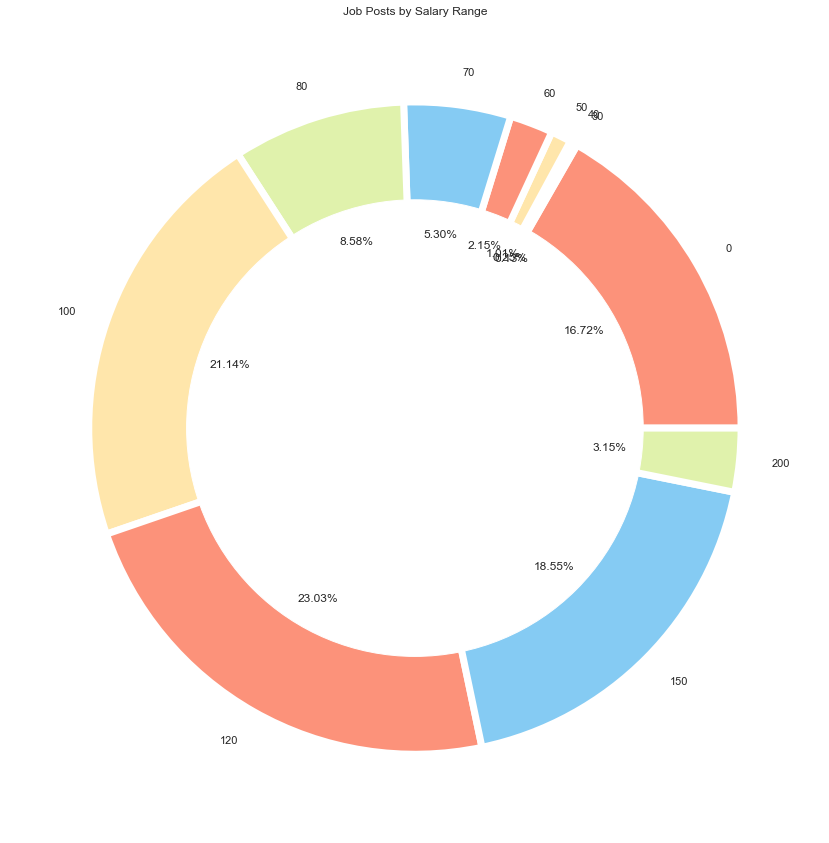

In [148]:
#  'Foreperson/Supervisors',

Developers_Programmers = conTop[conTop['SubClassification']==con_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

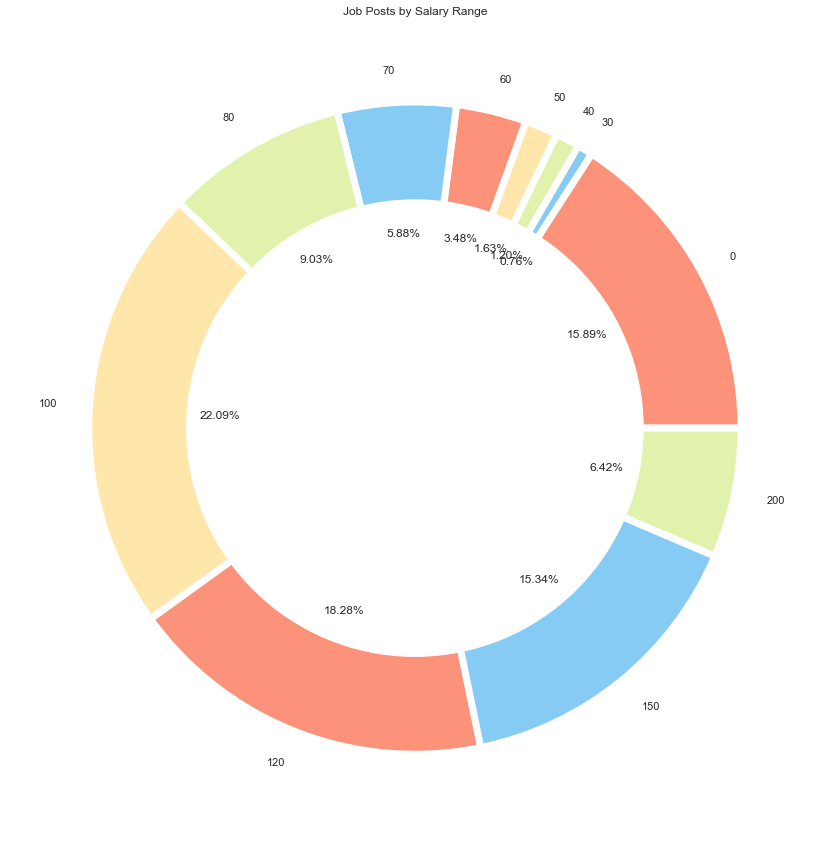

In [149]:
#  'Contracts Management',


Developers_Programmers = conTop[conTop['SubClassification']==con_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

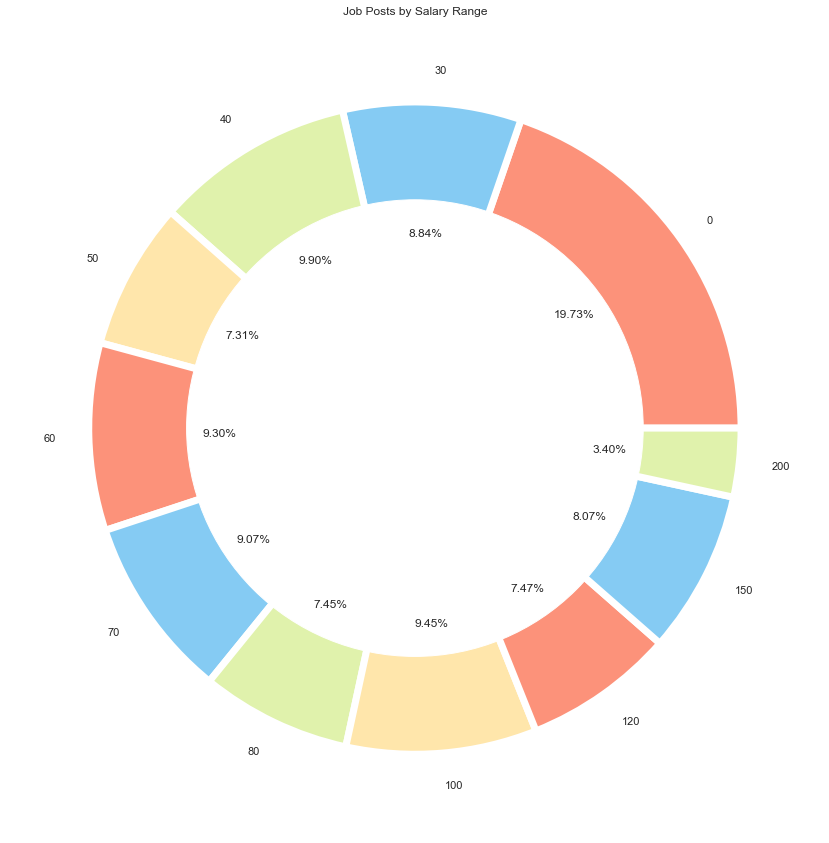

In [150]:
#  'Other',

Developers_Programmers = conTop[conTop['SubClassification']==con_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

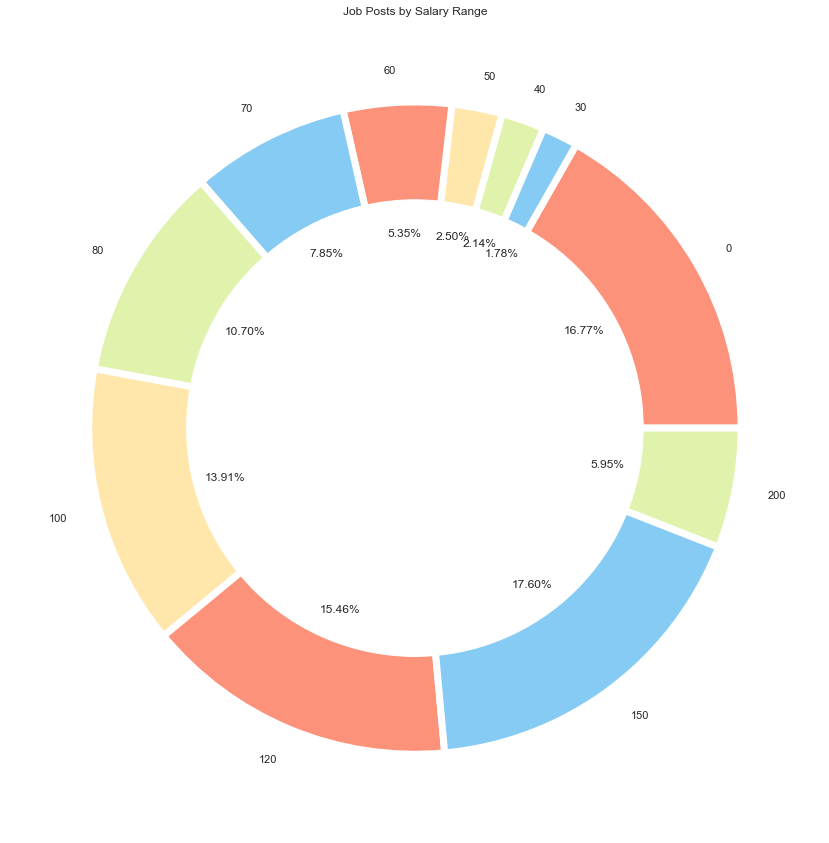

In [151]:
#  'Estimating'

Developers_Programmers = conTop[conTop['SubClassification']==con_top_5[4]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

Text(0.5, 1.0, 'Salary Range for Estimating')

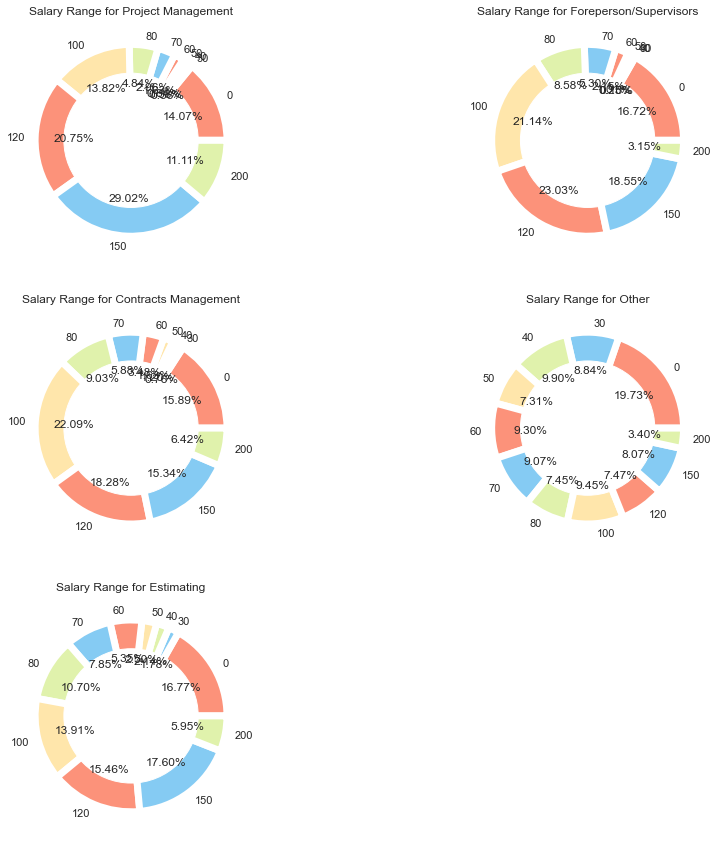

In [152]:
fig = plt.figure(figsize=(15,15))

ax1 = plt.subplot2grid((3,2),(0,0))
#----------------------------------

# 'Project Management',


Developers_Programmers = conTop[conTop['SubClassification']==con_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Project Management')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (0, 1))
#----------------------------------

# 'Foreperson/Supervisors',


Developers_Programmers = conTop[conTop['SubClassification']==con_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Foreperson/Supervisors')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 0))
#----------------------------------

# 'Contracts Management',

    
Developers_Programmers = conTop[conTop['SubClassification']==con_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Contracts Management')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 1))
#----------------------------------

# 'Other',

    
Developers_Programmers = conTop[conTop['SubClassification']==con_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Other')
# Show the graph


# #----------------------------------
ax1 = plt.subplot2grid((3,2),(2,0))
# #----------------------------------

 #'Estimating'
    
Developers_Programmers = conTop[conTop['SubClassification']==con_top_5[4]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Estimating')


# #----------------------------------

In [153]:
#Sales  
saleTop
sale_top_5

['Sales Representatives/Consultants',
 'New Business Development',
 'Account & Relationship Management',
 'Management',
 'Sales Coordinators']

In [154]:
ictTop_bySalary = saleTop.groupby('LowestSalary')
ictTop_bySalary_stats = ictTop_bySalary.count()
ictTop_bySalary_stats['Count'] = ictTop_bySalary_stats['Id']
ictTop_bySalary_stats['Count']

LowestSalary
0      2774
30      318
40     1157
50     1020
60     1219
70     1192
80     1055
100    1413
120    1372
150    1437
200     675
Name: Count, dtype: int64

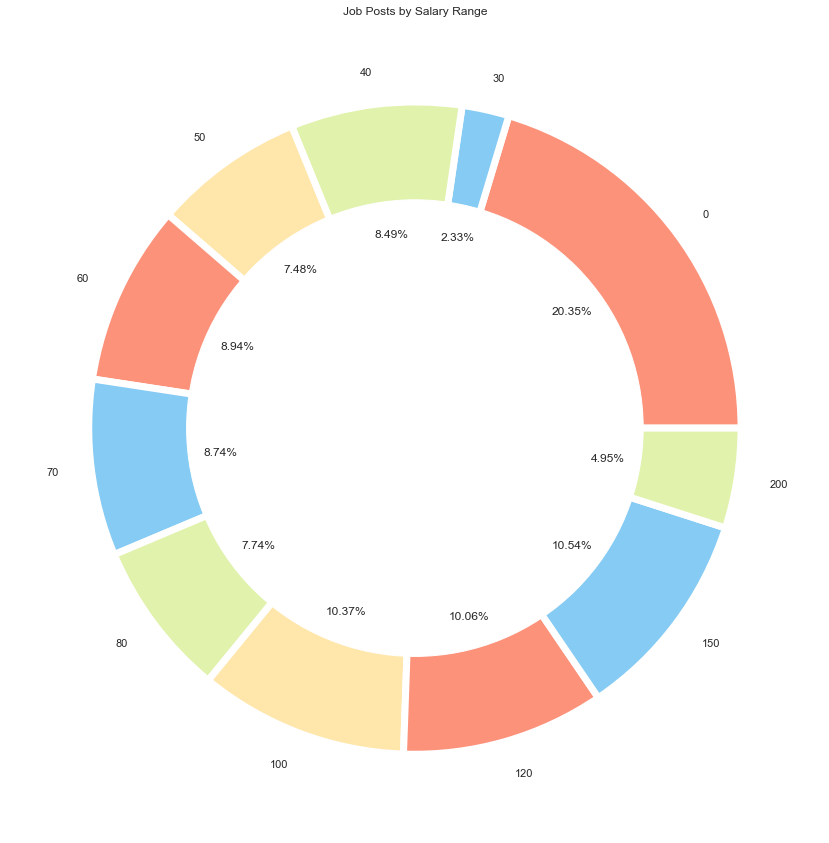

In [155]:
#salary ranges plot



# create data
names = ictTop_bySalary_stats.index
size = ictTop_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

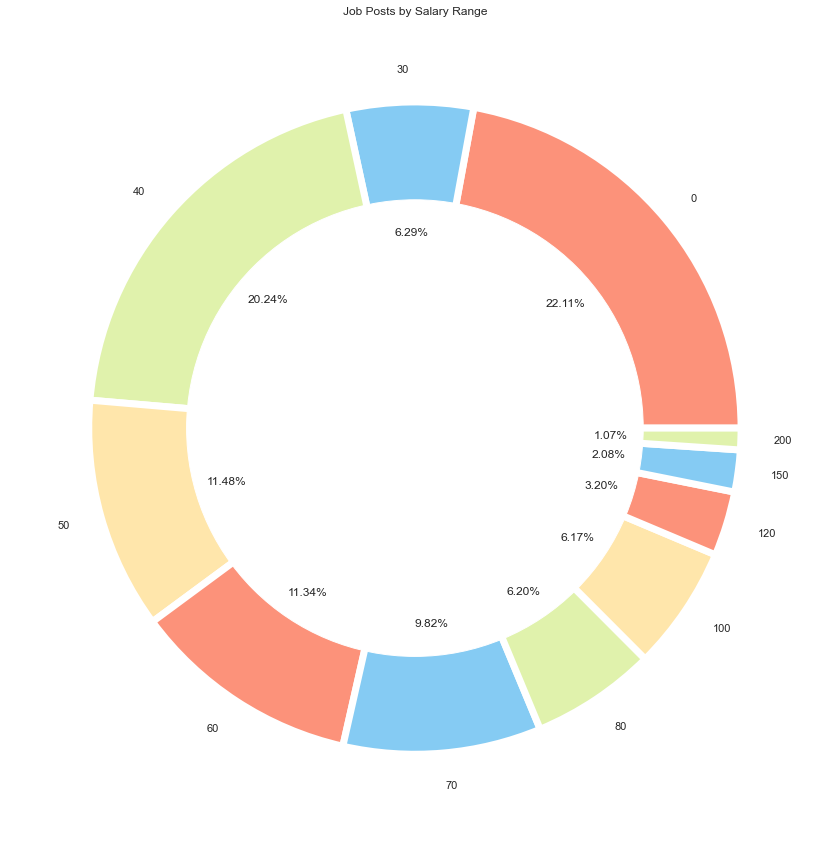

In [156]:
#  'Sales Representatives/Consultants',


Developers_Programmers = saleTop[saleTop['SubClassification']==sale_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

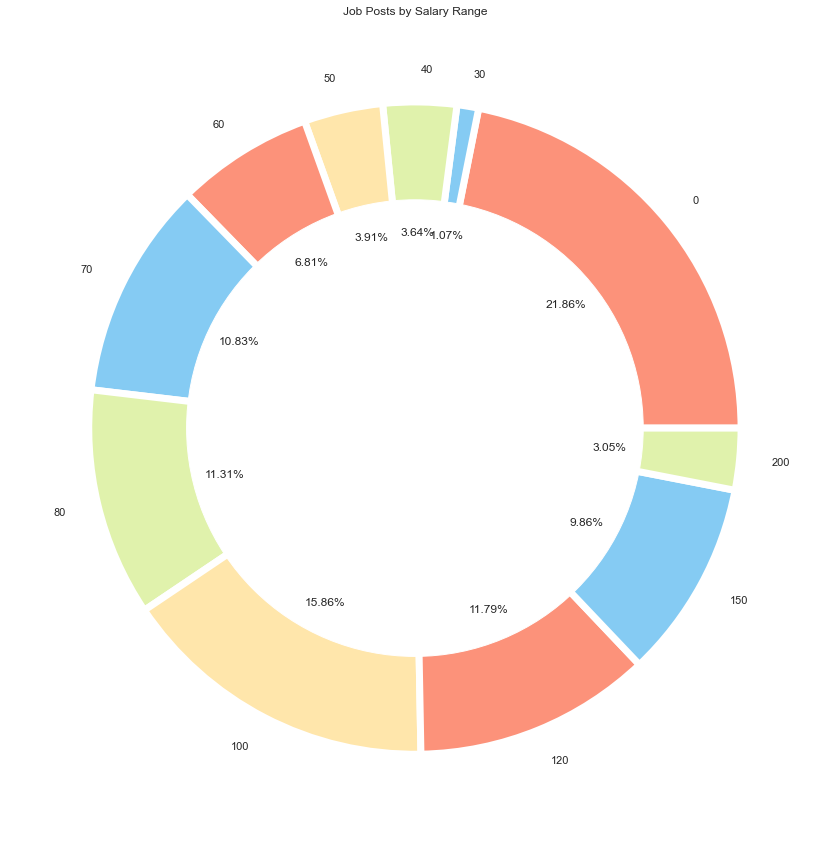

In [157]:
#  'New Business Development',



Developers_Programmers = saleTop[saleTop['SubClassification']==sale_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

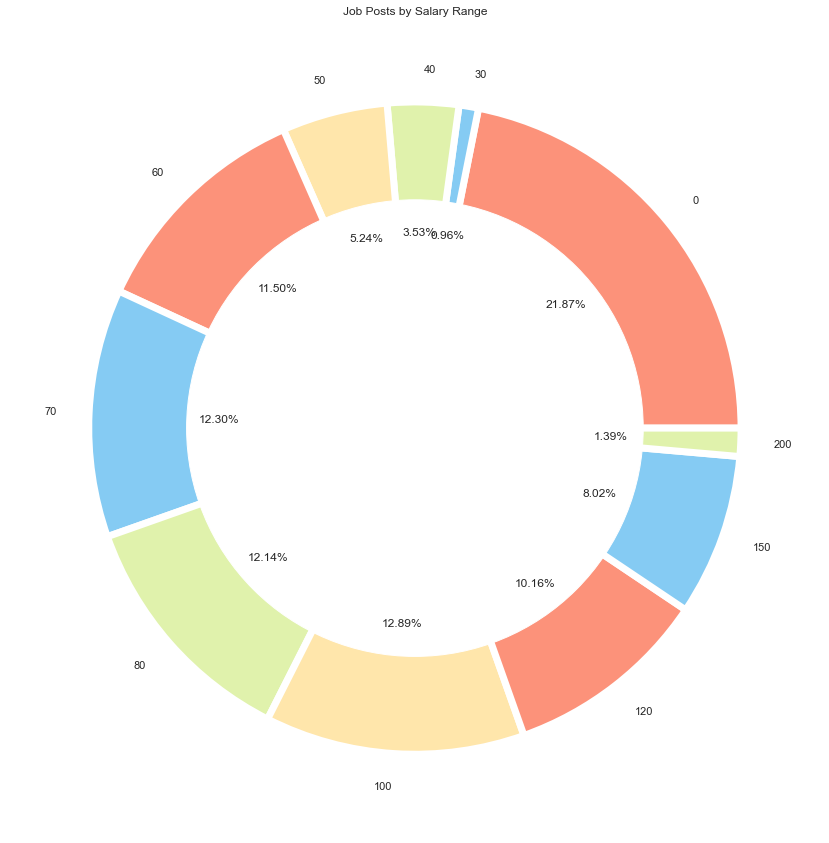

In [158]:
#  'Account & Relationship Management',



Developers_Programmers = saleTop[saleTop['SubClassification']==sale_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

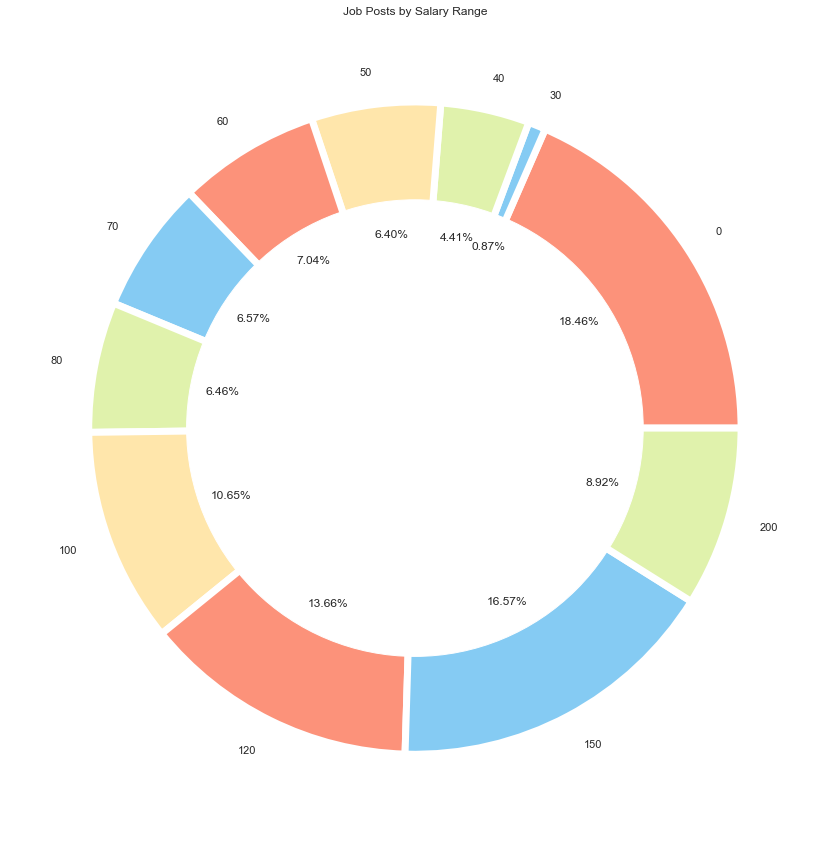

In [159]:
#  'Management',



Developers_Programmers = saleTop[saleTop['SubClassification']==sale_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

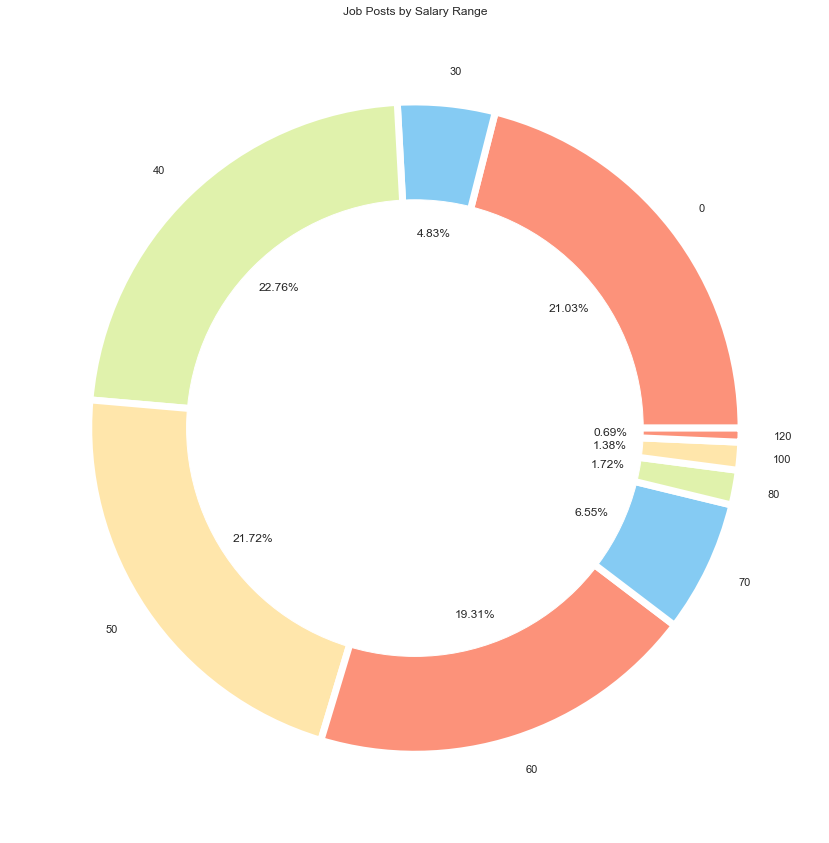

In [160]:
#  'Sales Coordinators'



Developers_Programmers = saleTop[saleTop['SubClassification']==sale_top_5[4]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']

plt.figure(figsize=(15,15))
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Job Posts by Salary Range')
# Show the graph
plt.show()

Text(0.5, 1.0, 'Salary Range for Sales Coordinators')

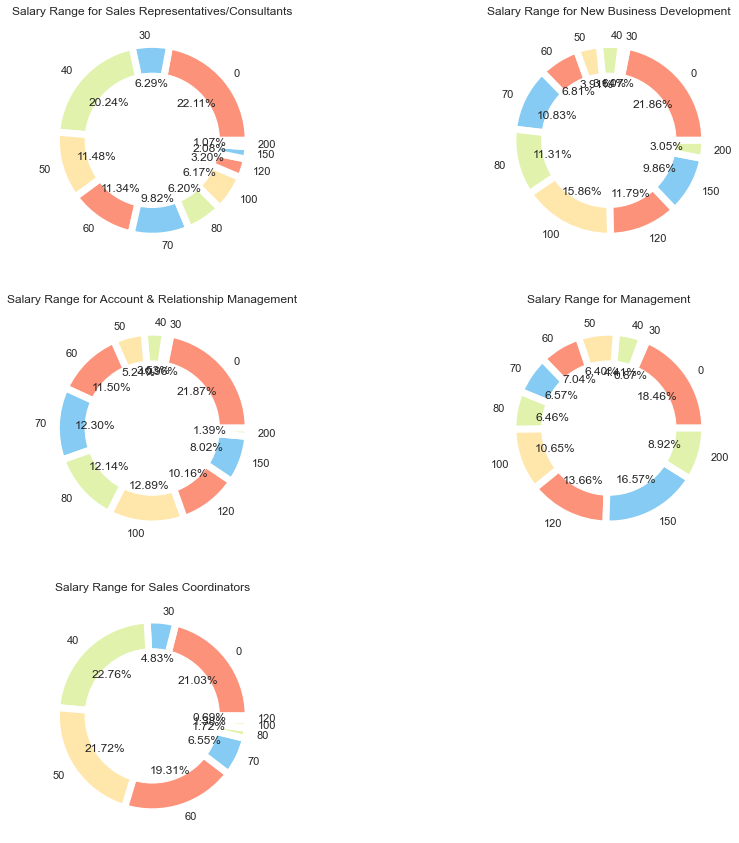

In [161]:
fig = plt.figure(figsize=(15,15))

ax1 = plt.subplot2grid((3,2),(0,0))
#----------------------------------

# 'Sales Representatives/Consultants',


Developers_Programmers = saleTop[saleTop['SubClassification']==sale_top_5[0]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Sales Representatives/Consultants')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (0, 1))
#----------------------------------

# 'New Business Development',


Developers_Programmers = saleTop[saleTop['SubClassification']==sale_top_5[1]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']


 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for New Business Development')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 0))
#----------------------------------

# 'Account & Relationship Management',

    
Developers_Programmers = saleTop[saleTop['SubClassification']==sale_top_5[2]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Account & Relationship Management')


#----------------------------------
ax1 = plt.subplot2grid((3,2), (1, 1))
#----------------------------------

# 'Management',

    
Developers_Programmers = saleTop[saleTop['SubClassification']==sale_top_5[3]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Management')
# Show the graph


# #----------------------------------
ax1 = plt.subplot2grid((3,2),(2,0))
# #----------------------------------

 #'Sales Coordinators'
    
Developers_Programmers = saleTop[saleTop['SubClassification']==sale_top_5[4]]
Developers_Programmers_bySalary = Developers_Programmers.groupby('LowestSalary')
Developers_Programmers_bySalary_bySalary_stats = Developers_Programmers_bySalary.count()
Developers_Programmers_bySalary_bySalary_stats['Count'] = Developers_Programmers_bySalary_bySalary_stats['Id']
Developers_Programmers_bySalary_bySalary_stats['Count']

# create data
names = Developers_Programmers_bySalary_bySalary_stats.index
size = Developers_Programmers_bySalary_bySalary_stats['Count']
 
# Create a circle at the center of the plot
my_circle = plt.Circle( (0,0), 0.7, color='white')

# Give color names
plt.pie(size, labels=names,autopct='%1.2f%%', colors=['#fc927a','#85cbf3','#e0f2ac','#ffe6ab'],wedgeprops = {'linewidth':7,'edgecolor':'white'})
p = plt.gcf()
p.gca().add_artist(my_circle)
p.gca().set_title('Salary Range for Sales Coordinators')


# #----------------------------------

In [162]:
import pandas as pd
df = pd.read_csv('preprocessed_data.csv', low_memory=False)

locationDf = df[df['Location'].isna()==False]
locationDf = locationDf.groupby('Location').count()
locationDf['Location'] = locationDf.index
locationDf['Count'] = locationDf["Id"]

locationDf.sort_values("Count",ascending=False,inplace=True)

#Get top 10 big cities
locationDf = locationDf.sort_values(by=["Count"], ascending =False)
locationTop10Df = locationDf[:10].copy()
#others
new_row = pd.DataFrame(data = {
    'Location' : ['Others'],
    'Count' : [locationDf["Count"][10:].sum()]
})
locationTop10Df = pd.concat([locationTop10Df, new_row],sort=False)
locationTop10Df.index = locationTop10Df['Location']
locationTop10Df_sorted = locationTop10Df.sort_values(by=["Count"], ascending =False)


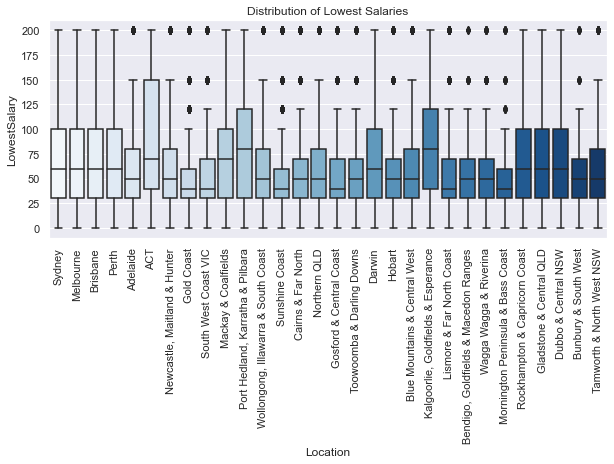

In [163]:
#Your code here
locationDf.head()

# sns.set()
# sns.set_style("whitegrid")

# sns.barplot(data=averageSalaryDf,x="AverageSalary",y="Count",color="blue")
# plt.xticks(rotation=90)
# plt.show()
plt.figure(figsize=(10,4))
plt.xticks(rotation=90)#fontsize=20
#plt.yticks(fontsize=20)
plt.title("Distribution of Lowest Salaries")


boxplot_data = df[:10]

sns.boxplot(
    data = df,
    x="Location",
    y="LowestSalary",
    order=locationDf["Location"][:30],#locationDf['Location'][:30],
    palette=sns.color_palette("Blues",n_colors=30)
)
plt.show()

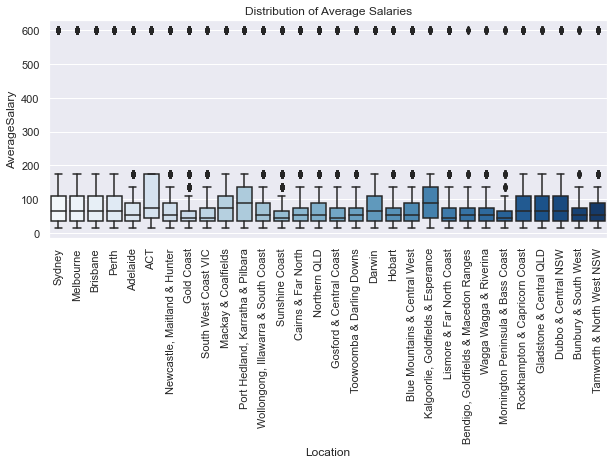

In [164]:
plt.figure(figsize=(10,4))
plt.xticks(rotation=90)#fontsize=20
plt.title("Distribution of Average Salaries")

boxplot_data = df[:10]

sns.boxplot(
    data = df,
    x="Location",
    y="AverageSalary",
    order=locationDf["Location"][:30],#locationDf['Location'][:30],
    palette=sns.color_palette("Blues",n_colors=30)
)
plt.show()

#### 2) Study Market By Location

In [165]:
# Maket Size in each city
# Distribution of all Job pst of all Sectors and sub-sectors

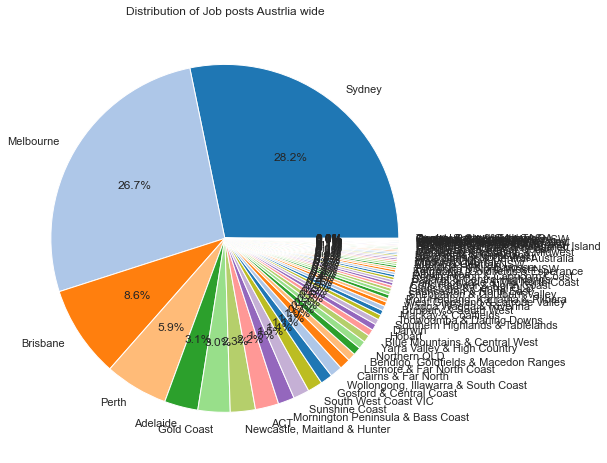

In [166]:
job_post_locations = df.groupby('Location').count()
job_post_locations['Location'] = job_post_locations.index
job_post_locations['Count'] = job_post_locations["Id"]
job_post_locations['Not Specified'] = htTop[~htTop['Location'].isnull()].count()
job_post_locations.sort_values("Count",ascending=False,inplace=True)
job_post_locations

plt.figure(figsize=(8,8))
plt.title("Distribution of Job posts Austrlia wide")
plt.pie(
    top_ht_locations["Count"],
    labels=top_ht_locations["Location"],
    colors=colors,
    autopct= "%.1f%%"#lambda p: '{:.2f}%({:.0f})'.format(p,(p/100)*jobTypeDf["Count"].sum())
)

plt.show()

In [167]:
job_post_locations.index[:5]

Index(['Sydney', 'Melbourne', 'Brisbane', 'Perth', 'Adelaide'], dtype='object', name='Location')

In [ ]:
# Range of Salaries for each Sub sector

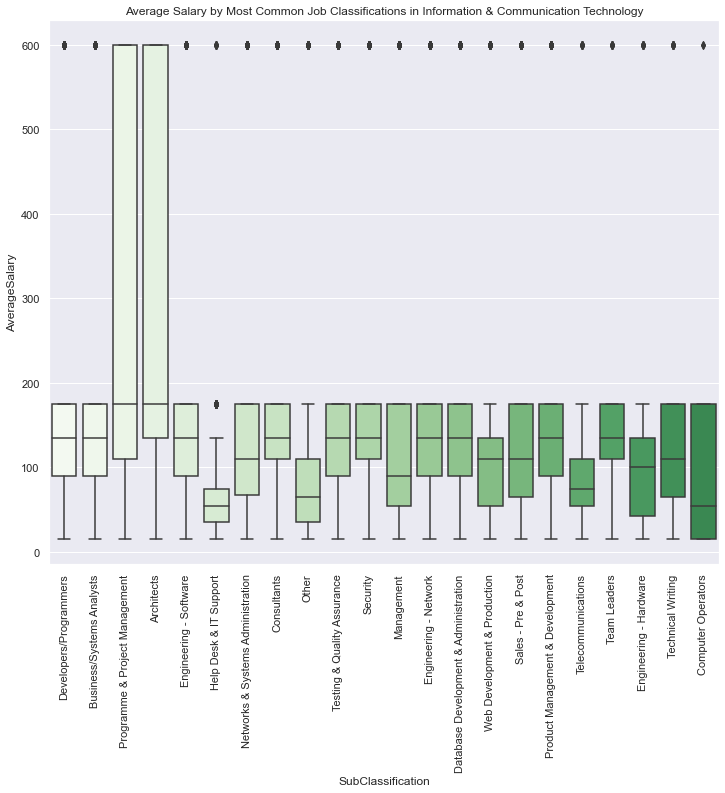

In [112]:
# Information & Communication Technology 

ictSubClasstn = df[df['Classification'] == "Information & Communication Technology"]
ictSubClasstn["SubClassification"].value_counts().index

plt.figure(figsize=(12,10))
plt.xticks(rotation=90)#,fontsize=20
# plt.yticks(fontsize=20)
plt.title("Average Salary by Most Common Job Classifications in Information & Communication Technology")


boxplot_data = df[:10]

sns.boxplot(
    data = df,
    x="SubClassification",
    y="AverageSalary",
    order=ictSubClasstn["SubClassification"].value_counts().index,
    palette=sns.color_palette("Greens",n_colors=30)
)
plt.show()

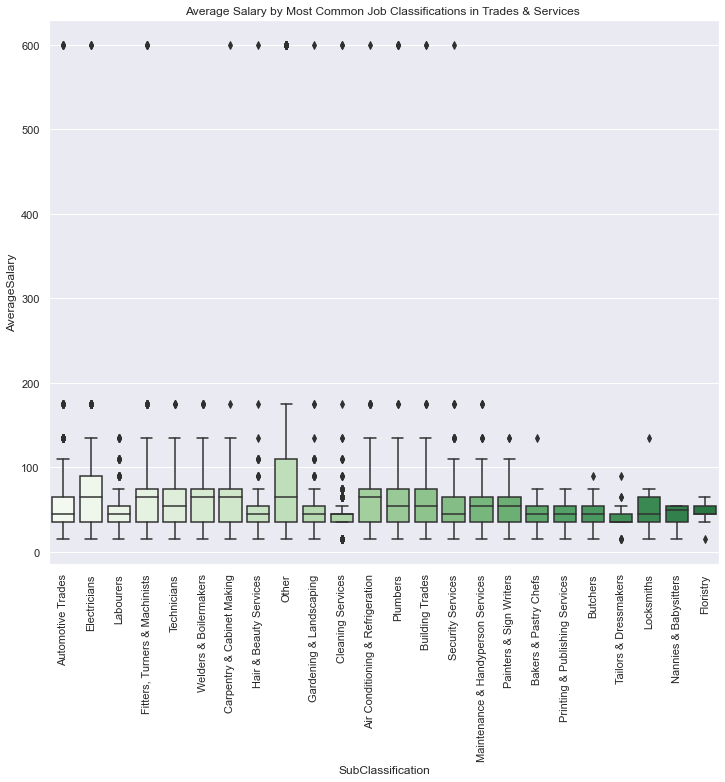

In [113]:
# Trades & Services  

ictSubClasstn = df[df['Classification'] == "Trades & Services"]
ictSubClasstn["SubClassification"].value_counts().index

plt.figure(figsize=(12,10))
plt.xticks(rotation=90)#,fontsize=20
# plt.yticks(fontsize=20)
plt.title("Average Salary by Most Common Job Classifications in Trades & Services ")


boxplot_data = df[:10]

sns.boxplot(
    data = df,
    x="SubClassification",
    y="AverageSalary",
    order=ictSubClasstn["SubClassification"].value_counts().index,
    palette=sns.color_palette("Greens",n_colors=30)
)
plt.show()

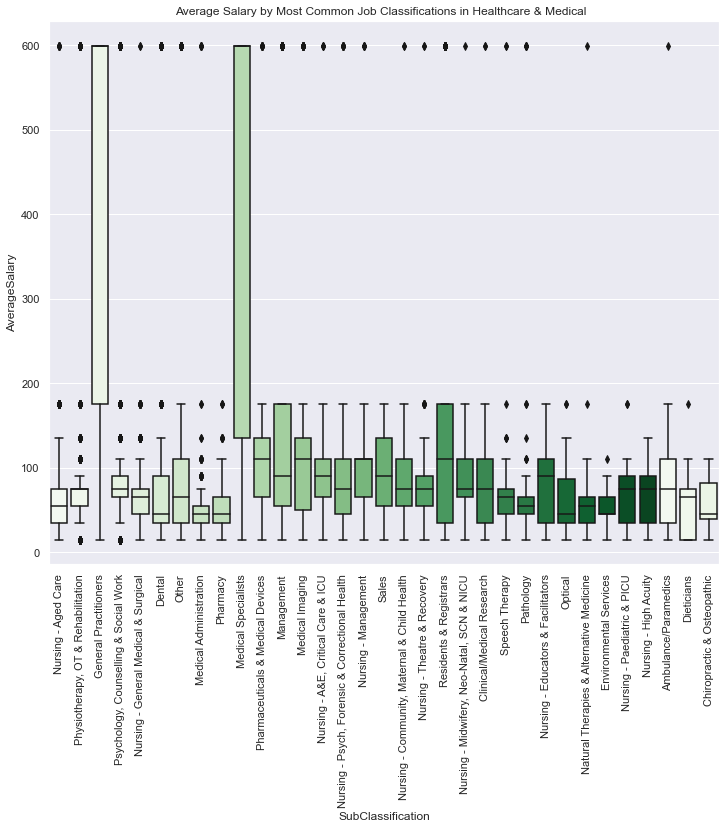

In [104]:
# Healthcare & Medical   

ictSubClasstn = df[df['Classification'] == "Healthcare & Medical"]
ictSubClasstn["SubClassification"].value_counts().index

plt.figure(figsize=(12,10))
plt.xticks(rotation=90)#,fontsize=20
# plt.yticks(fontsize=20)
plt.title("Average Salary by Most Common Job Classifications in Healthcare & Medical  ")


boxplot_data = df[:10]

sns.boxplot(
    data = df,
    x="SubClassification",
    y="AverageSalary",
    order=ictSubClasstn["SubClassification"].value_counts().index,
    palette=sns.color_palette("Greens",n_colors=30)
)
plt.show()

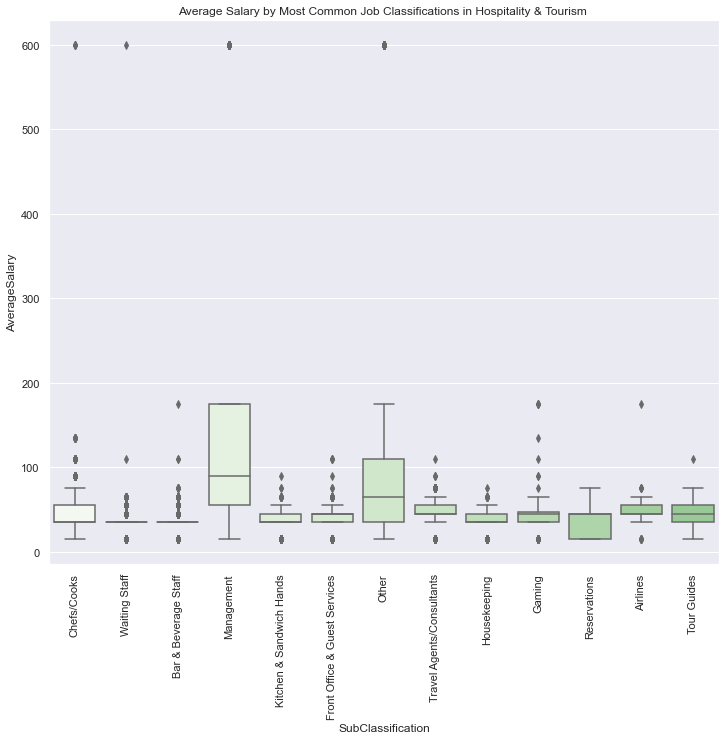

In [105]:
# Hospitality & Tourism     

ictSubClasstn = df[df['Classification'] == "Hospitality & Tourism"]
ictSubClasstn["SubClassification"].value_counts().index

plt.figure(figsize=(12,10))
plt.xticks(rotation=90)#,fontsize=20
# plt.yticks(fontsize=20)
plt.title("Average Salary by Most Common Job Classifications in Hospitality & Tourism ")


boxplot_data = df[:10]

sns.boxplot(
    data = df,
    x="SubClassification",
    y="AverageSalary",
    order=ictSubClasstn["SubClassification"].value_counts().index,
    palette=sns.color_palette("Greens",n_colors=30)
)
plt.show()

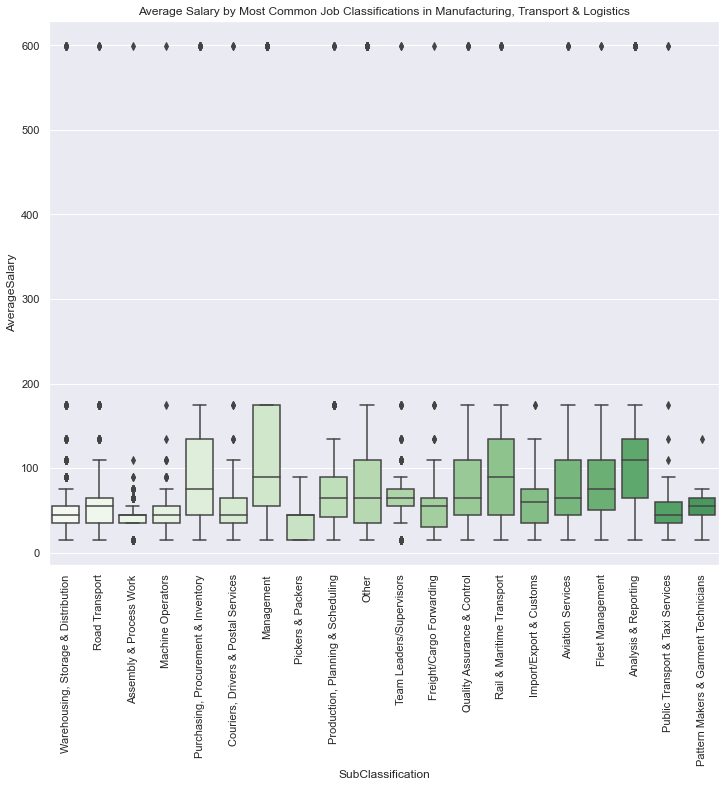

In [106]:
# Manufacturing, Transport & Logistics   

ictSubClasstn = df[df['Classification'] == "Manufacturing, Transport & Logistics"]
ictSubClasstn["SubClassification"].value_counts().index

plt.figure(figsize=(12,10))
plt.xticks(rotation=90)#,fontsize=20
# plt.yticks(fontsize=20)
plt.title("Average Salary by Most Common Job Classifications in Manufacturing, Transport & Logistics")


boxplot_data = df[:10]

sns.boxplot(
    data = df,
    x="SubClassification",
    y="AverageSalary",
    order=ictSubClasstn["SubClassification"].value_counts().index,
    palette=sns.color_palette("Greens",n_colors=30)
)
plt.show()

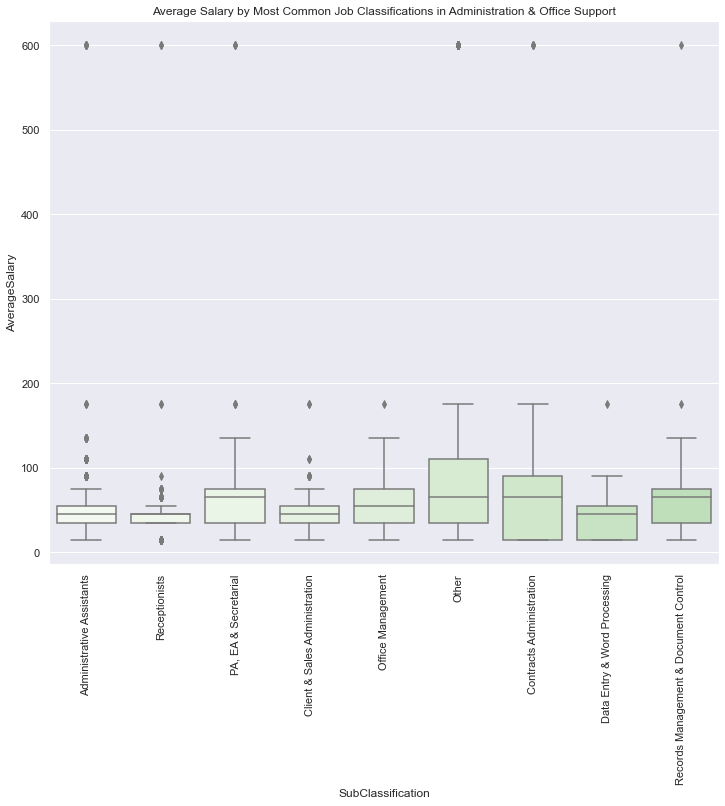

In [107]:
# Administration & Office Support

ictSubClasstn = df[df['Classification'] == "Administration & Office Support"]
ictSubClasstn["SubClassification"].value_counts().index

plt.figure(figsize=(12,10))
plt.xticks(rotation=90)#,fontsize=20
# plt.yticks(fontsize=20)
plt.title("Average Salary by Most Common Job Classifications in Administration & Office Support")


boxplot_data = df[:10]

sns.boxplot(
    data = df,
    x="SubClassification",
    y="AverageSalary",
    order=ictSubClasstn["SubClassification"].value_counts().index,
    palette=sns.color_palette("Greens",n_colors=30)
)
plt.show()

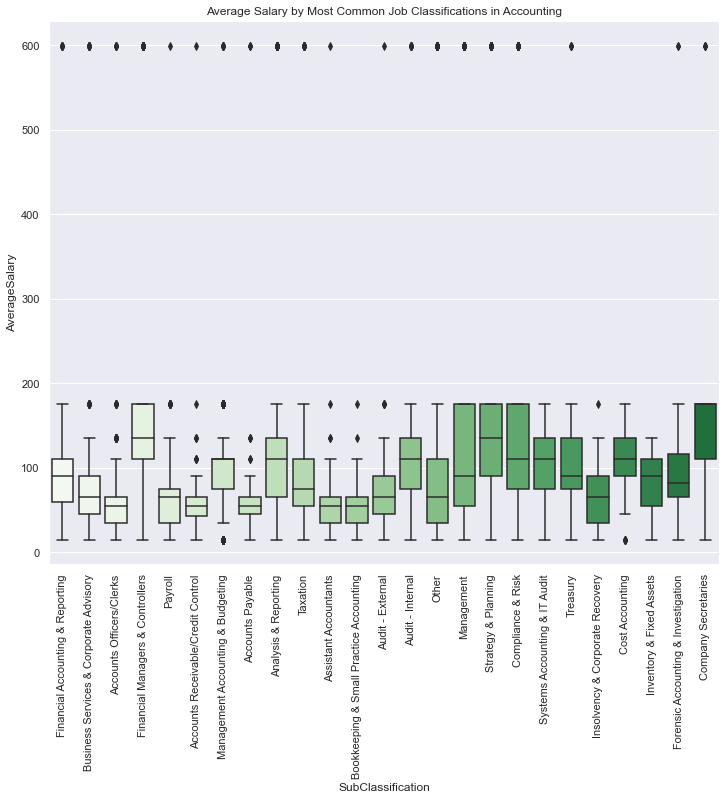

In [108]:
# Accounting

ictSubClasstn = df[df['Classification'] == "Accounting"]
ictSubClasstn["SubClassification"].value_counts().index

plt.figure(figsize=(12,10))
plt.xticks(rotation=90)#,fontsize=20
# plt.yticks(fontsize=20)
plt.title("Average Salary by Most Common Job Classifications in Accounting")


boxplot_data = df[:10]

sns.boxplot(
    data = df,
    x="SubClassification",
    y="AverageSalary",
    order=ictSubClasstn["SubClassification"].value_counts().index,
    palette=sns.color_palette("Greens",n_colors=30)
)
plt.show()

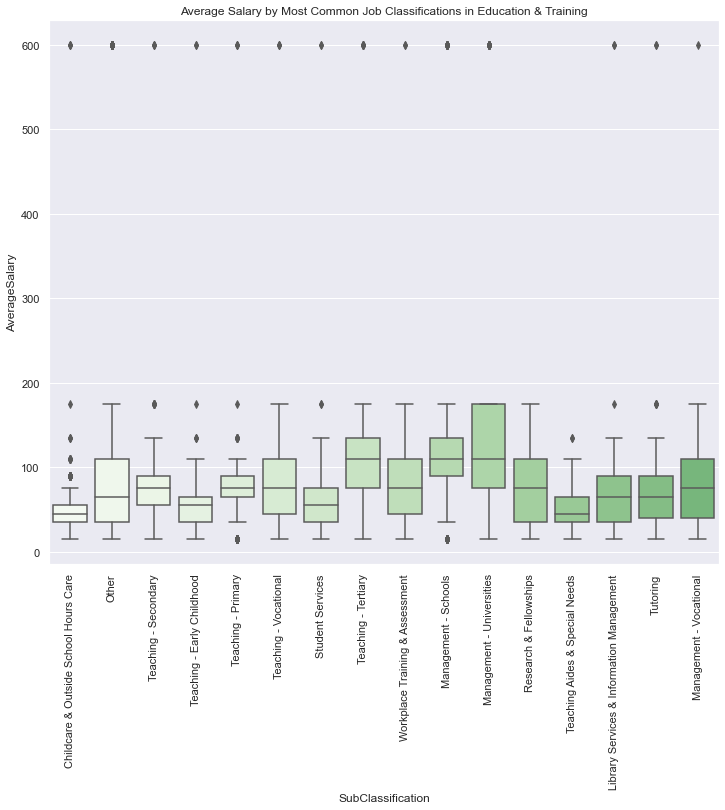

In [109]:
# Education & Training 

ictSubClasstn = df[df['Classification'] == "Education & Training"]
ictSubClasstn["SubClassification"].value_counts().index

plt.figure(figsize=(12,10))
plt.xticks(rotation=90)#,fontsize=20
# plt.yticks(fontsize=20)
plt.title("Average Salary by Most Common Job Classifications in Education & Training")


boxplot_data = df[:10]

sns.boxplot(
    data = df,
    x="SubClassification",
    y="AverageSalary",
    order=ictSubClasstn["SubClassification"].value_counts().index,
    palette=sns.color_palette("Greens",n_colors=30)
)
plt.show()

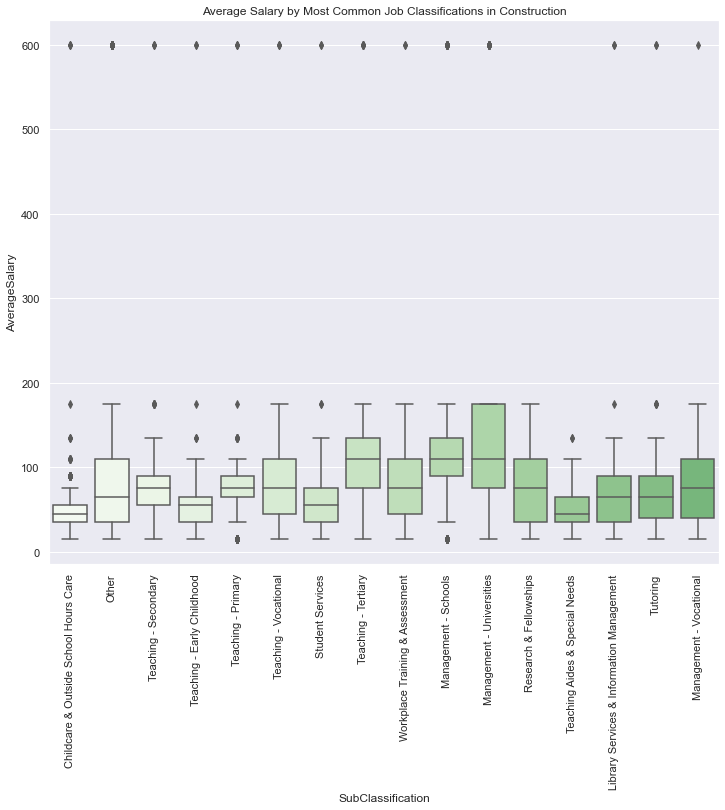

In [110]:
# Construction 

ictSubClasstn = df[df['Classification'] == "Education & Training"]
ictSubClasstn["SubClassification"].value_counts().index

plt.figure(figsize=(12,10))
plt.xticks(rotation=90)#,fontsize=20
# plt.yticks(fontsize=20)
plt.title("Average Salary by Most Common Job Classifications in Construction")


boxplot_data = df[:10]

sns.boxplot(
    data = df,
    x="SubClassification",
    y="AverageSalary",
    order=ictSubClasstn["SubClassification"].value_counts().index,
    palette=sns.color_palette("Greens",n_colors=30)
)
plt.show()

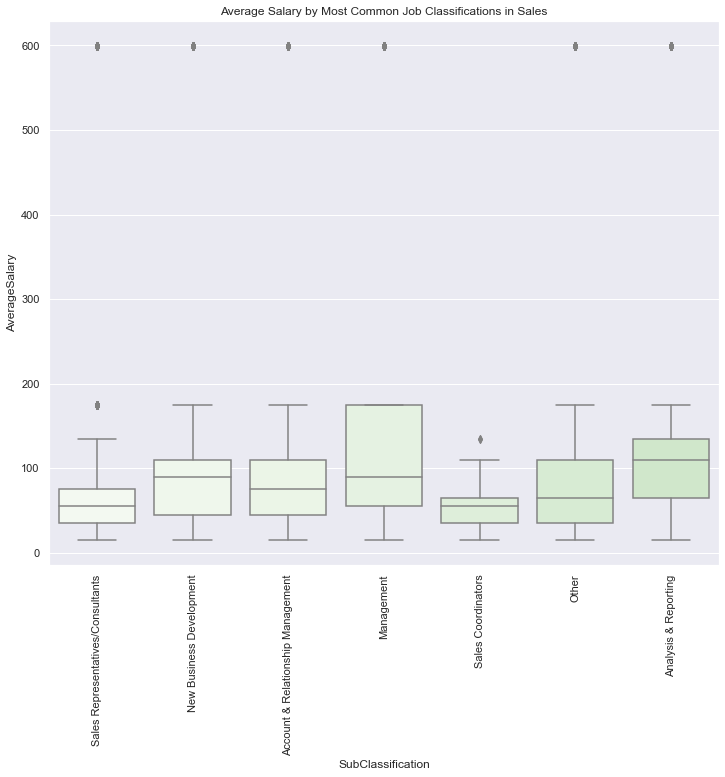

In [111]:
# Sales 

ictSubClasstn = df[df['Classification'] == "Sales"]
ictSubClasstn["SubClassification"].value_counts().index

plt.figure(figsize=(12,10))
plt.xticks(rotation=90)#,fontsize=20
# plt.yticks(fontsize=20)
plt.title("Average Salary by Most Common Job Classifications in Sales")


boxplot_data = df[:10]

sns.boxplot(
    data = df,
    x="SubClassification",
    y="AverageSalary",
    order=ictSubClasstn["SubClassification"].value_counts().index,
    palette=sns.color_palette("Greens",n_colors=30)
)
plt.show()